In [1]:
!pip install gym==0.10.9
!pip install box2d-py==2.3.8
!pip install torch==1.0.0
!pip install Pillow==6.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 32.2 MB/s 
     |████████████████████████████████| 964 kB 78.5 MB/s 
  Created wheel for gym: filename=gym-0.10.9-py3-none-any.whl size=1587026 sha256=19daf1bd11dcc22857e9f8125bc9cf1b3da735326f6ba9e960ac4870d66eeeb0
  Stored in directory: /root/.cache/pip/wheels/c6/21/f6/25791f7252f63757db41a2cca66c45618ac66277c287c773ab
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.25.2
    Uninstalling gym-0.25.2:
      Successfully uninstalled gym-0.25.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 374 kB 28.5 MB/s 
  ERROR: Failed building wheel for box2d-py
  Running setup.py clean for box2d-py
Failed to build box2d-py
    Running setup.py install for box2d-py ... error
ERROR: Command errored out with exit status 1: /u

In [1]:
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1

In [2]:
# HIDE OUTPUT
!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1
!pip install gym[atari] > /dev/null 2>&1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.2 MB 34.3 MB/s 
  Attempting uninstall: setuptools
    Found existing installation: setuptools 57.4.0
    Uninstalling setuptools-57.4.0:
      Successfully uninstalled setuptools-57.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.9.0 requires jedi>=0.10, which is not installed.


In [3]:
!pip install pyglet==1.3.2
!pip install Box2D

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 35.1 MB/s 
  Attempting uninstall: pyglet
    Found existing installation: pyglet 2.0.1
    Uninstalling pyglet-2.0.1:
      Successfully uninstalled pyglet-2.0.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 33.8 MB/s 


In [4]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

In [5]:
import os
import argparse
import gym

import cv2
import numpy as np
from collections import deque
import numpy as np
import scipy.signal

import os
import re
import shutil

import numpy as np
import tensorflow as tf
from tensorflow.python.framework import ops
ops.reset_default_graph()
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [6]:
class FrameStack():
    def __init__(self, initImage, stacLen=4, preFunc=None):
        self.imageStack = deque(maxlen=stacLen)
        if preFunc:
          initImage = preFunc(initImage)
        else:
          initImage = initImage
        c = 0
        while c < stacLen:
          c += 1
          self.imageStack.append(initImage)
        self.state = np.stack(self.imageStack, axis=-1)
        self.preFunc = preFunc

    def addFrame(self, frame):
        self.imageStack.append(self.preFunc(frame))
        self.state = np.stack(self.imageStack, axis=-1)

    def getState(self):
        return self.state


def discount(x, gamma):
    return scipy.signal.lfilter([1], [1, -gamma], x[::-1], axis=0)[::-1]




def genReturn(rewards, bootstrapVal, termnl, gamma):
    result = []
    R = bootstrapVal
    for i in range(len(rewards)-1,-1,-1):
        R *= (1.0 - termnl[i]) * gamma
        R += rewards[i]
        result.append(R)

    result = reversed(result)
    return np.array(list(result))


def genGae(rewards, vals, bootstrapVal, termnl, gamma, lam):
    vals = np.vstack((vals, [bootstrapVal]))
    deltas = []
    for i in range(len(rewards)-1,-1,-1):
        V = rewards[i] + (1.0 - termnl[i]) * gamma * vals[i + 1]
        delta = V - vals[i]
        deltas.append(delta)
    deltas = np.array(list(reversed(deltas)))
    A = deltas[-1, :]
    advS = [A]
    for i in range(len(deltas)-2,-1,-1):
        A = deltas[i] + (1.0 - termnl[i]) * gamma * lam * A
        advS.append(A)
    advS = reversed(advS)

    return np.array(list(advS))

In [7]:

class PolicyGraph():


    def __init__(self, inStates, takenAct,
                 numActions, minAction, maxAction, scope_name,
                 initial_mean_factor=0.1, clip_action_space=False):
        with tf.variable_scope(scope_name):
            # Construct model
            self.conv1 = tf.layers.conv2d(inStates, filters=16, kernel_size=8,
                                          strides=4, activation=tf.nn.leaky_relu, padding="valid", name="conv1")
            self.conv2 = tf.layers.conv2d(self.conv1, filters=32, kernel_size=3,
                                          strides=2, activation=tf.nn.leaky_relu, padding="valid", name="conv2")
            self.shared_features = tf.layers.flatten(self.conv2, name="flatten")


            self.action_mean = tf.layers.dense(self.shared_features, numActions,
                                               activation=tf.nn.tanh,
                                               kernel_initializer=tf.initializers.variance_scaling(
                                                   scale=initial_mean_factor),
                                               name="action_mean")
            self.action_mean = minAction + \
                ((self.action_mean + 1) / 2) * (maxAction - minAction)
            self.action_logstd = tf.Variable(
                np.full((numActions), np.log(0.4), dtype=np.float32), name="action_logstd")


            self.value = tf.layers.dense(
                self.shared_features, 1, activation=None, name="value")


            self.action_normal = tf.distributions.Normal(
                self.action_mean, tf.exp(self.action_logstd), validate_args=True)
            self.sampled_action = tf.squeeze(
                self.action_normal.sample(1), axis=0)
            if clip_action_space:
                num_envs = tf.shape(self.sampled_action)[0]
                minAction = tf.reshape(tf.tile(tf.convert_to_tensor(
                    minAction, dtype=tf.float32), (num_envs,)), (num_envs, numActions))
                maxAction = tf.reshape(tf.tile(tf.convert_to_tensor(
                    maxAction, dtype=tf.float32), (num_envs,)), (num_envs, numActions))
                self.sampled_action = tf.clip_by_value(
                    self.sampled_action, minAction, maxAction)


            self.action_log_prob = tf.reduce_sum(
                self.action_normal.log_prob(takenAct),
                axis=-1, keepdims=True)


            self.action_mean = tf.check_numerics(
                self.action_mean, "Invalid value for self.action_mean")
            self.action_logstd = tf.check_numerics(
                self.action_logstd, "Invalid value for self.action_logstd")
            self.value = tf.check_numerics(
                self.value, "Invalid value for self.value")
            self.action_log_prob = tf.check_numerics(
                self.action_log_prob, "Invalid value for self.action_log_prob")


class PPO():

    def __init__(self, inputShape, numActions, minAction, maxAction,
                 epsilon=0.2, valScale=0.5, entropyScale=0.01,
                 model_checkpoint=None, modelName="ppo"):
        tf.reset_default_graph()
        #tf.compat.v1.reset_default_graph()
        self.inStates = tf.placeholder(shape=(None, *inputShape), dtype=tf.float32)
        self.takenAct = tf.placeholder(shape=(None, numActions), dtype=tf.float32)
        self.inStates = tf.check_numerics(self.inStates,"Invalid value for self.inStates")
        self.takenAct = tf.check_numerics(self.takenAct,"Invalid value for self.takenAct")
        self.policy = PolicyGraph(self.inStates, self.takenAct, numActions, minAction,maxAction, "policy")
        self.policy_old = PolicyGraph(self.inStates, self.takenAct, numActions, minAction,maxAction, "policy_old")


        self.retPlacehold = tf.placeholder(shape=(None,), dtype=tf.float32, name="retPlacehold_placeholder")
        self.advPlacehold = tf.placeholder(shape=(None,), dtype=tf.float32, name="advantage_placeholder")


        self.prob_ratio = tf.exp(self.policy.action_log_prob - self.policy_old.action_log_prob)

        # Validate values
        self.retPlacehold = tf.check_numerics(
            self.retPlacehold, "Invalid value for self.retPlacehold")
        self.advPlacehold = tf.check_numerics(
            self.advPlacehold, "Invalid value for self.advPlacehold")
        self.prob_ratio = tf.check_numerics(
            self.prob_ratio, "Invalid value for self.prob_ratio")

        # Policy loss
        adv = tf.expand_dims(self.advPlacehold, axis=-1)
        self.policy_loss = tf.reduce_mean(tf.minimum(
            self.prob_ratio * adv,
            tf.clip_by_value(self.prob_ratio,
                             1.0 - epsilon,
                             1.0 + epsilon) * adv))

        # Value loss = mse(V(s_t) - R_t)
        self.value_loss = tf.reduce_mean(tf.squared_difference(
            tf.squeeze(self.policy.value), self.retPlacehold)) * valScale

        # Entropy loss
        self.entropy_loss = tf.reduce_mean(tf.reduce_sum(
            self.policy.action_normal.entropy(), axis=-1)) * entropyScale

        # Total loss
        self.loss = -self.policy_loss + self.value_loss - self.entropy_loss

        # Policy parameters
        policy_params = tf.get_collection(
            tf.GraphKeys.TRAINABLE_VARIABLES, scope="policy/")
        policy_old_params = tf.get_collection(
            tf.GraphKeys.TRAINABLE_VARIABLES, scope="policy_old/")
        assert(len(policy_params) == len(policy_old_params))
        for src, dst in zip(policy_params, policy_old_params):
            assert(src.shape == dst.shape)

        # Minimize loss
        self.learning_rate = tf.placeholder(
            shape=(), dtype=tf.float32, name="lr_placeholder")
        self.optimizer = tf.train.AdamOptimizer(
            learning_rate=self.learning_rate)
        self.train_step = self.optimizer.minimize(
            self.loss, var_list=policy_params)

        # Update network parameters
        self.update_op = tf.group(
            [dst.assign(src) for src, dst in zip(policy_params, policy_old_params)])

        # Create session
        config = tf.ConfigProto()
        config.gpu_options.allow_growth = True
        self.sess = tf.Session(config=config)

        # Run the initializer
        self.sess.run(tf.global_variables_initializer())

        # Load model checkpoint
        self.modelName = modelName
        self.saver = tf.train.Saver()

        self.model_dir = "./models/{}".format(self.modelName)
        self.log_dir = "./logs/{}".format(self.modelName)
        self.video_dir = "./videos/{}".format(self.modelName)
        if model_checkpoint is None and os.path.isdir(self.model_dir):
          model_checkpoint = tf.train.latest_checkpoint(self.model_dir)
        if model_checkpoint:
            self.steps = int(re.findall(
                r"[/\\]step\d+", model_checkpoint)[0][len("/step"):])
            self.saver.restore(self.sess, model_checkpoint)
            print("[INFO] Model checkpoint restored from {}".format(
                model_checkpoint))
        else:
            self.steps = 0
            for d in [self.model_dir, self.log_dir, self.video_dir]:
                if os.path.isdir(d):
                    shutil.rmtree(d)
                os.makedirs(d)
    def save(self):
        model_checkpoint = os.path.join(
            self.model_dir, "step{}.ckpt".format(self.steps))
        self.saver.save(self.sess, model_checkpoint)
        print("[INFO] Model checkpoint saved to {}".format(model_checkpoint))
    def getPredection(self, inStates, use_old_policy=False, greedy=False):
        if use_old_policy:
          policy = self.policy_old
        else:
          policy = self.policy
        if greedy:
          action = policy.action_mean
        else:
          action = policy.sampled_action
        return self.sess.run([action, policy.value],
                             feed_dict={self.inStates: inStates})

    def write_to_summary(self, name, value):
        summary = tf.Summary()
        summary.value.add(tag=name, simple_value=value)
        self.train_writer.add_summary(summary, self.steps)

    def update_old_policy(self):
        self.sess.run(self.update_op)

In [8]:
%cd /content/drive/MyDrive/RL_project

/content/drive/MyDrive/RL_project


/usr/local/lib/python3.8/dist-packages/gym/envs/registration.py:14: PkgResourcesDeprecationWarning: Parameters to load are deprecated.  Call .resolve and .require separately.
  result = entry_point.load(False)
<ipython-input-7-d2980687082f>:30: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  self.conv1 = tf.layers.conv2d(input_states, filters=16, kernel_size=8,
<ipython-input-7-d2980687082f>:32: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  self.conv2 = tf.layers.conv2d(self.conv1, filters=32, kernel_size=3,
<ipython-input-7-d2980687082f>:34: UserWarning: `tf.layers.flatten` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Flatten` instead.
  self.shared_features = tf.layers.flatten(
<ipython-input-7-d2980687082f>:38: UserWarning: `tf.layers.dense` is deprecated and will be removed

[INFO] Creating test environment
[INFO] Creating model
./models/racecar_final exists. Do you wish to continue (C) or restart training (R)?C
[INFO] Creating environments
Track generation: 1140..1429 -> 289-tiles trackTrack generation: 1194..1505 -> 311-tiles trackTrack generation: 1180..1479 -> 299-tiles trackTrack generation: 1181..1480 -> 299-tiles track



Track generation: 1087..1368 -> 281-tiles trackTrack generation: 1111..1399 -> 288-tiles track
Track generation: 1310..1646 -> 336-tiles track

Track generation: 1067..1338 -> 271-tiles trackTrack generation: 984..1234 -> 250-tiles trackTrack generation: 1122..1407 -> 285-tiles trackTrack generation: 1285..1620 -> 335-tiles trackTrack generation: 1102..1381 -> 279-tiles trackTrack generation: 1283..1608 -> 325-tiles track

Track generation: 1209..1515 -> 306-tiles trackTrack generation: 1345..1686 -> 341-tiles trackTrack generation: 1203..1508 -> 305-tiles track






[INFO] Training loop
The episode is  1
[INFO] Running evaluation

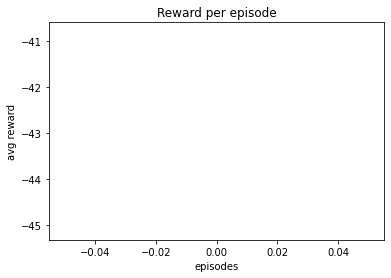

The episode is  2
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221552
the value error is 24.023214909803137


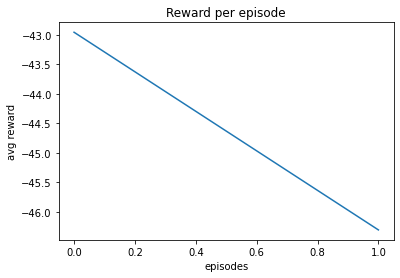

The episode is  3
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228815
the value error is 21.305092142350002


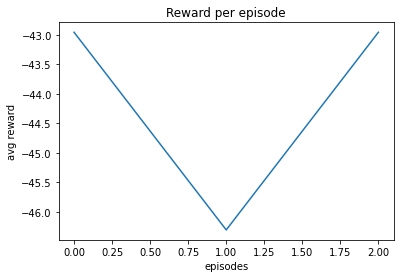

The episode is  4
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 23.031168167302962


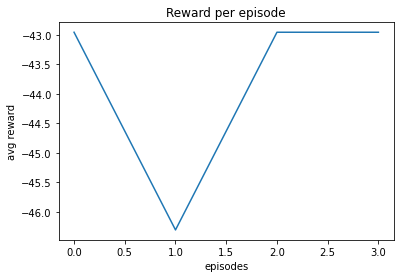

The episode is  5
The eval average rewards per episode is  -42.95302013422888
the value error is 23.031168167302962


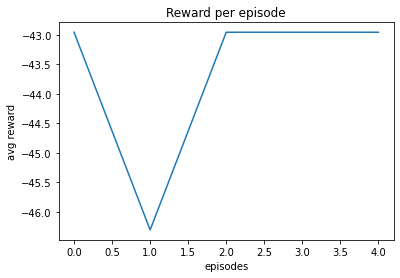

The episode is  6
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 24.20699392065833


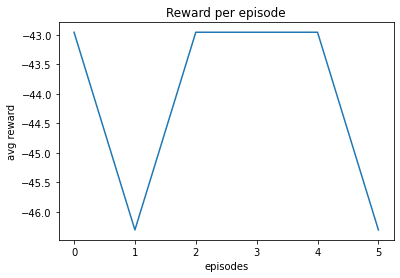

The episode is  7
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step1000.ckpt
The eval average rewards per episode is  -46.30872483221548
the value error is 23.80285077685264


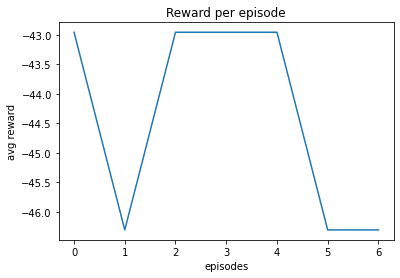

The episode is  8
Track generation: 1057..1334 -> 277-tiles track
Track generation: 1075..1348 -> 273-tiles track
Track generation: 1083..1365 -> 282-tiles trackTrack generation: 1169..1465 -> 296-tiles track
Track generation: 1095..1378 -> 283-tiles trackTrack generation: 1146..1443 -> 297-tiles trackTrack generation: 1028..1289 -> 261-tiles trackTrack generation: 1133..1429 -> 296-tiles track



Track generation: 1243..1558 -> 315-tiles trackTrack generation: 1015..1273 -> 258-tiles trackTrack generation: 1146..1446 -> 300-tiles track
Track generation: 1073..1348 -> 275-tiles trackTrack generation: 1107..1393 -> 286-tiles track
Track generation: 1156..1449 -> 293-tiles trackTrack generation: 1090..1373 -> 283-tiles track
Track generation: 1142..1432 -> 290-tiles track





retry to generate track (normal if there are not many of this messages)
Track generation: 1170..1460 -> 290-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

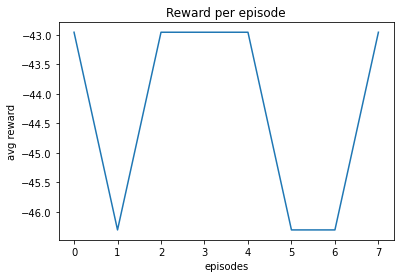

The episode is  9
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 22.458328530883165


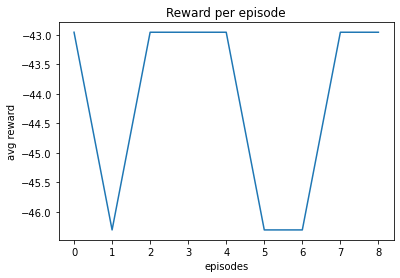

The episode is  10
The eval average rewards per episode is  -42.953020134228886
the value error is 22.458328530883165


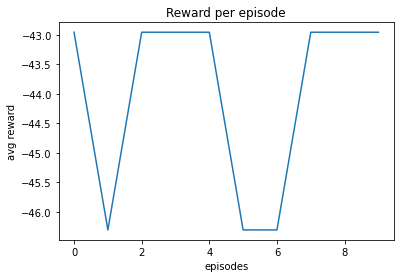

The episode is  11
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228815
the value error is 21.54868228179415


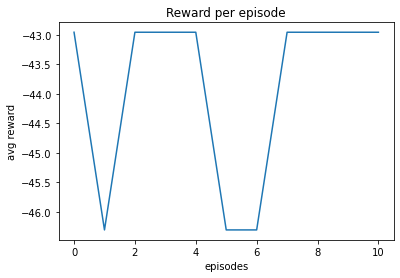

The episode is  12
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.43495131810334


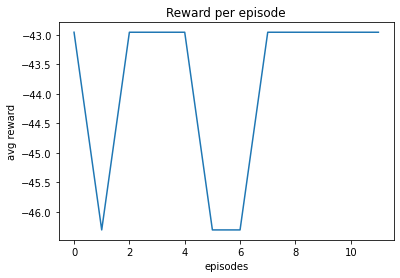

The episode is  13
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step2000.ckpt
The eval average rewards per episode is  -42.953020134228886
the value error is 22.31556184118125


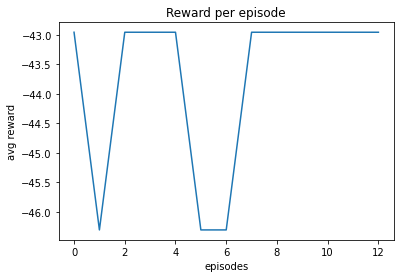

The episode is  14
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 22.8883048867409


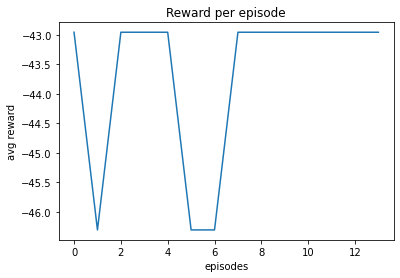

The episode is  15
The eval average rewards per episode is  -42.953020134228844
the value error is 22.8883048867409


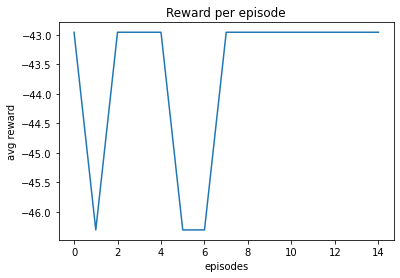

The episode is  16
Track generation: 1335..1673 -> 338-tiles track
Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1195..1498 -> 303-tiles trackTrack generation: 1123..1408 -> 285-tiles trackTrack generation: 1141..1427 -> 286-tiles track

Track generation: 1104..1384 -> 280-tiles track


Track generation: 1151..1443 -> 292-tiles track
Track generation: 1004..1259 -> 255-tiles trackTrack generation: 967..1216 -> 249-tiles track
Track generation: 1097..1375 -> 278-tiles track
Track generation: 1196..1499 -> 303-tiles trackTrack generation: 1109..1390 -> 281-tiles track
retry to generate track (normal if there are not many of this messages)Track generation: 1212..1519 -> 307-tiles track


Track generation: 1185..1485 -> 300-tiles trackTrack generation: 1207..1513 -> 306-tiles track
Track generation: 1123..1408 -> 285-tiles track
Track generation: 1190..1491 -> 301-tiles track


[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

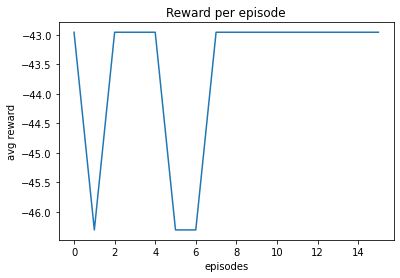

The episode is  17
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422875
the value error is 21.349605737210346


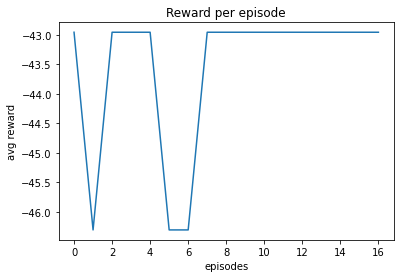

The episode is  18
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.603351915018887


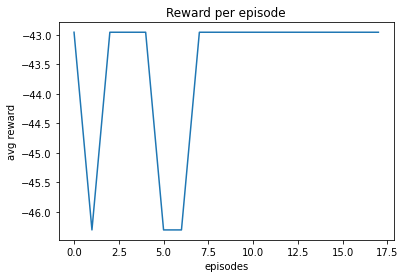

The episode is  19
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step3000.ckpt
The eval average rewards per episode is  -42.95302013422886
the value error is 22.013398034099318


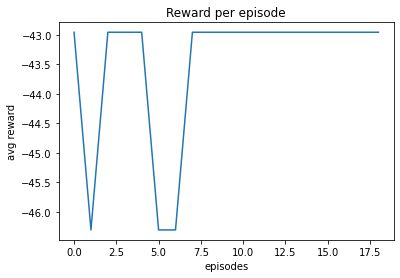

The episode is  20
The eval average rewards per episode is  -42.95302013422886
the value error is 22.013398034099318


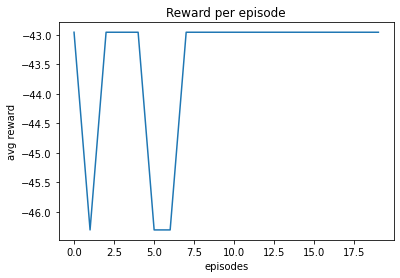

The episode is  21
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 22.64383172199769


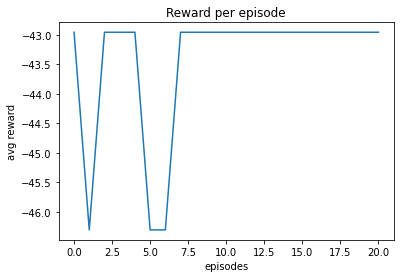

The episode is  22
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 22.057370600965225


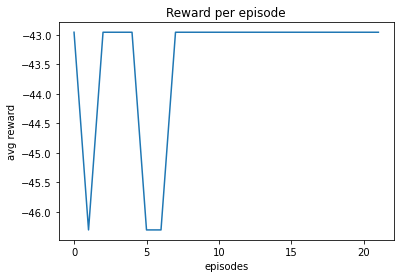

The episode is  23
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624222
the value error is 19.494154744583046


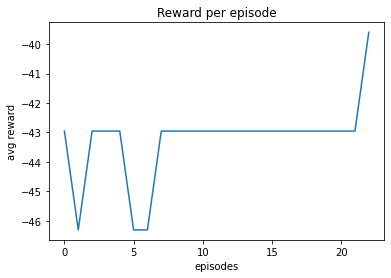

The episode is  24
Track generation: 1136..1424 -> 288-tiles track
Track generation: 999..1257 -> 258-tiles trackTrack generation: 1315..1648 -> 333-tiles trackTrack generation: 1236..1549 -> 313-tiles trackTrack generation: 1089..1373 -> 284-tiles track
Track generation: 1046..1312 -> 266-tiles track
Track generation: 1020..1279 -> 259-tiles trackTrack generation: 1041..1305 -> 264-tiles track
Track generation: 1100..1379 -> 279-tiles trackTrack generation: 1324..1661 -> 337-tiles trackTrack generation: 1183..1483 -> 300-tiles track
Track generation: 1194..1497 -> 303-tiles track

retry to generate track (normal if there are not many of this messages)

Track generation: 1189..1499 -> 310-tiles track

Track generation: 1144..1434 -> 290-tiles track


Track generation: 1147..1438 -> 291-tiles track

Track generation: 1183..1486 -> 303-tiles trackTrack generation: 1067..1346 -> 279-tiles track

retry to generate track (normal if there are not many of this messages)
Track generation: 1247

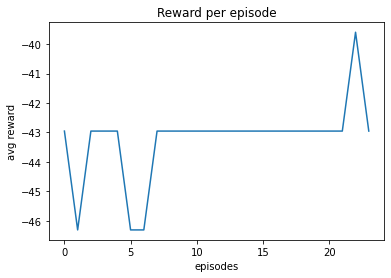

The episode is  25
The eval average rewards per episode is  -42.953020134228886
the value error is 21.33998201527692


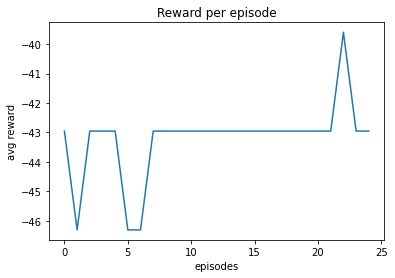

The episode is  26
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step4000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 21.60552865727813


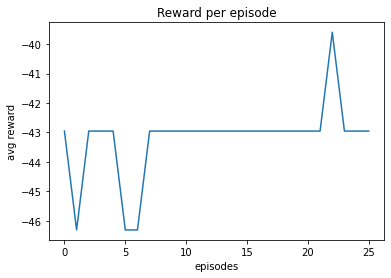

The episode is  27
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242205
the value error is 19.434879938488933


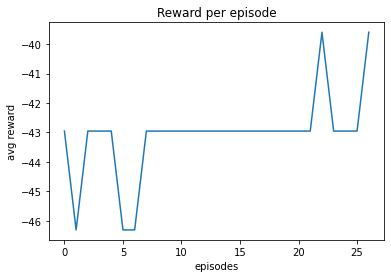

The episode is  28
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624218
the value error is 19.2127842236385


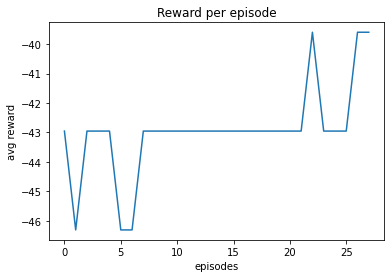

The episode is  29
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.178337804197263


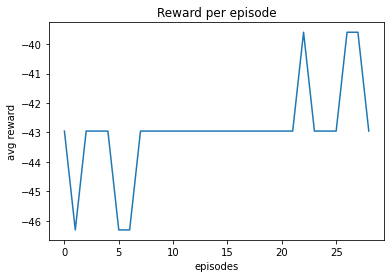

The episode is  30
The eval average rewards per episode is  -42.95302013422883
the value error is 21.178337804197263


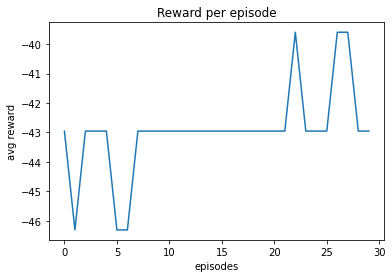

The episode is  31
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.28917062286597


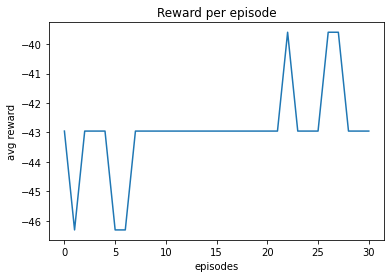

The episode is  32
Track generation: 1243..1558 -> 315-tiles track
Track generation: 1170..1474 -> 304-tiles trackTrack generation: 940..1182 -> 242-tiles track
Track generation: 1103..1383 -> 280-tiles trackretry to generate track (normal if there are not many of this messages)

Track generation: 982..1236 -> 254-tiles track

Track generation: 1097..1375 -> 278-tiles trackTrack generation: 1139..1428 -> 289-tiles trackTrack generation: 1183..1483 -> 300-tiles trackTrack generation: 993..1248 -> 255-tiles trackTrack generation: 1336..1674 -> 338-tiles trackTrack generation: 1100..1379 -> 279-tiles trackTrack generation: 1216..1524 -> 308-tiles track
Track generation: 992..1244 -> 252-tiles track
Track generation: 1042..1307 -> 265-tiles track


Track generation: 1082..1361 -> 279-tiles track

Track generation: 945..1188 -> 243-tiles trackTrack generation: 1117..1400 -> 283-tiles track




retry to generate track (normal if there are not many of this messages)
retry to generate track (n

Instructions for updating:
Use standard file APIs to delete files with this prefix.


[INFO] Model checkpoint saved to ./models/racecar_final/step5000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 21.9528456696869


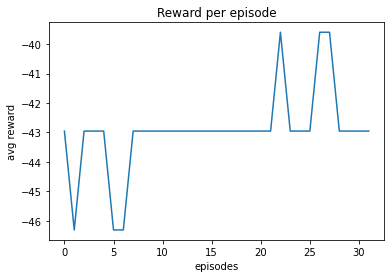

The episode is  33
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 22.740294851614603


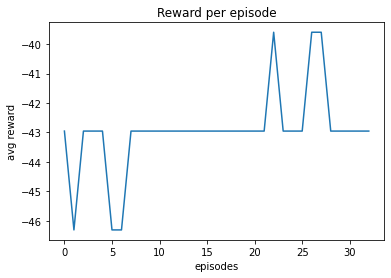

The episode is  34
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.88772325203316


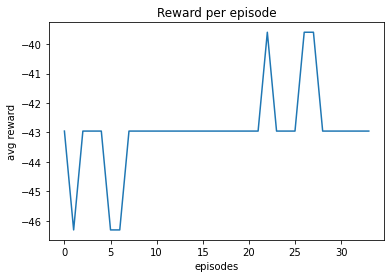

The episode is  35
The eval average rewards per episode is  -42.95302013422885
the value error is 21.88772325203316


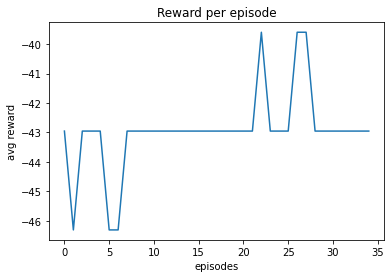

The episode is  36
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.18041224493433


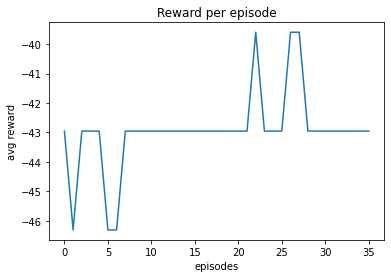

The episode is  37
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 22.362447289239412


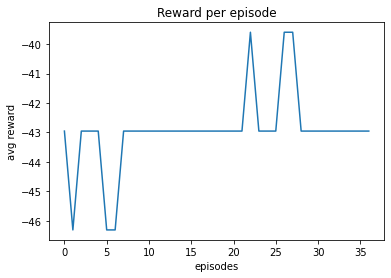

The episode is  38
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step6000.ckpt
The eval average rewards per episode is  -39.597315436242205
the value error is 18.63640097891571


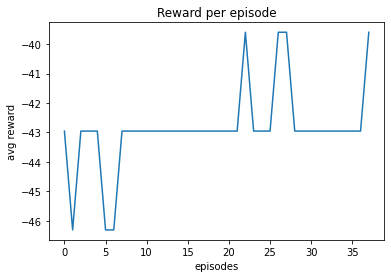

The episode is  39
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.3087248322155
the value error is 24.687044223659896


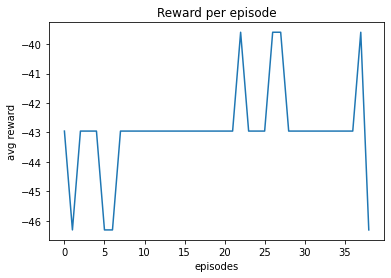

The episode is  40
Track generation: 1299..1628 -> 329-tiles trackTrack generation: 1112..1394 -> 282-tiles track

Track generation: 1047..1320 -> 273-tiles track
Track generation: 1125..1413 -> 288-tiles trackTrack generation: 1139..1428 -> 289-tiles trackTrack generation: 1159..1453 -> 294-tiles track
Track generation: 1123..1408 -> 285-tiles trackTrack generation: 1228..1536 -> 308-tiles track
retry to generate track (normal if there are not many of this messages)Track generation: 987..1238 -> 251-tiles trackTrack generation: 1023..1283 -> 260-tiles trackTrack generation: 1106..1387 -> 281-tiles track
Track generation: 1146..1437 -> 291-tiles track
Track generation: 1172..1469 -> 297-tiles trackretry to generate track (normal if there are not many of this messages)
Track generation: 1212..1519 -> 307-tiles track





Track generation: 1351..1693 -> 342-tiles trackTrack generation: 1167..1463 -> 296-tiles track



Track generation: 1246..1569 -> 323-tiles track
Track generation: 1251

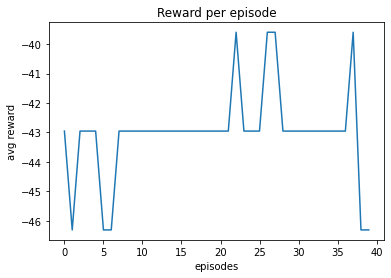

The episode is  41
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.014458966609144


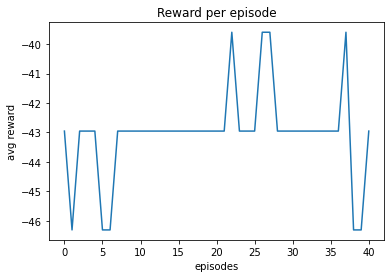

The episode is  42
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.17205864472827


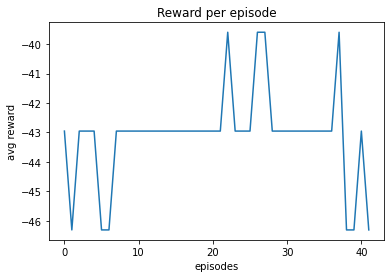

The episode is  43
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 21.651992503127406


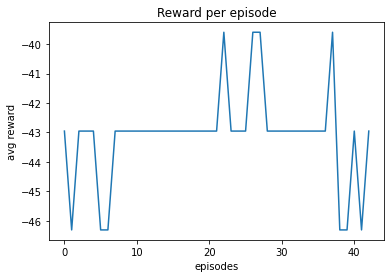

The episode is  44
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step7000.ckpt
The eval average rewards per episode is  -42.95302013422884
the value error is 21.90352495297722


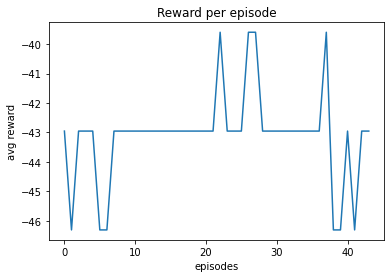

The episode is  45
The eval average rewards per episode is  -42.95302013422884
the value error is 21.90352495297722


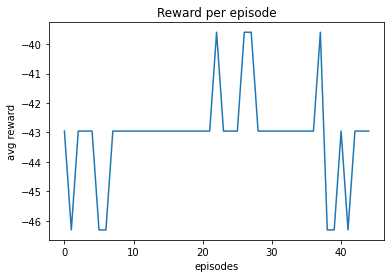

The episode is  46
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.70388780578827


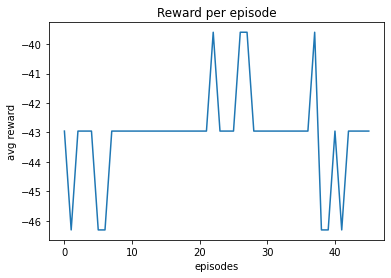

The episode is  47
Track generation: 1172..1470 -> 298-tiles track
Track generation: 1087..1363 -> 276-tiles trackTrack generation: 1228..1539 -> 311-tiles track
Track generation: 1159..1453 -> 294-tiles trackTrack generation: 1185..1487 -> 302-tiles trackTrack generation: 939..1180 -> 241-tiles trackTrack generation: 1109..1390 -> 281-tiles track
Track generation: 1027..1288 -> 261-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 1027..1288 -> 261-tiles track

Track generation: 1092..1369 -> 277-tiles track



Track generation: 1293..1621 -> 328-tiles trackretry to generate track (normal if there are not many of this messages)
Track generation: 963..1215 -> 252-tiles trackTrack generation: 1118..1407 -> 289-tiles track
Track generation: 1180..1479 -> 299-tiles track
Track generation: 1055..1325 -> 270-tiles trackTrack generation: 963..1208 -> 245-tiles track
Track generation: 1012..1269 -> 257-tiles track
retry to generate track (no

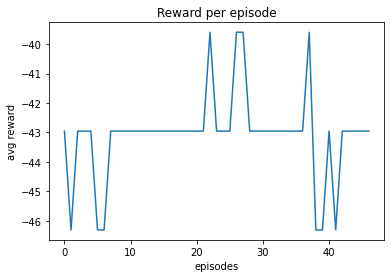

The episode is  48
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.422852814015734


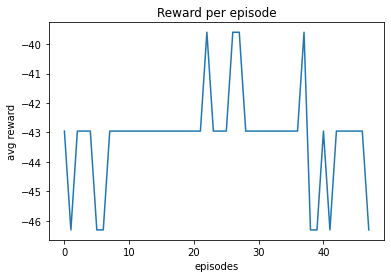

The episode is  49
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422879
the value error is 21.695131811125407


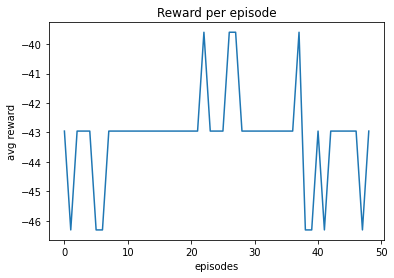

The episode is  50
The eval average rewards per episode is  -42.95302013422879
the value error is 21.695131811125407


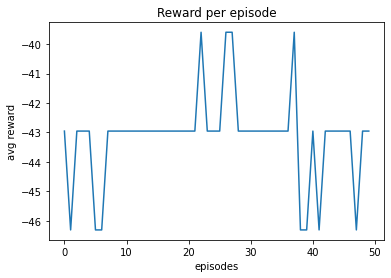

The episode is  51
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step8000.ckpt
The eval average rewards per episode is  -42.95302013422888
the value error is 21.642107837159386


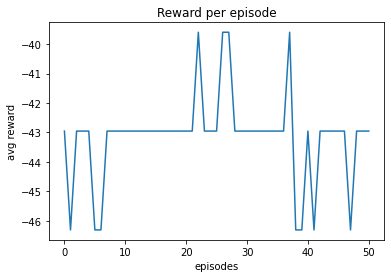

The episode is  52
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624226
the value error is 19.380859646611345


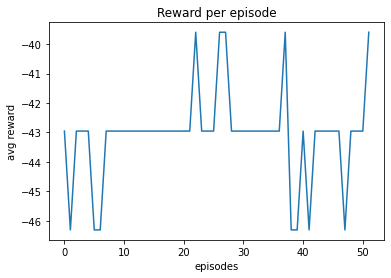

The episode is  53
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342288
the value error is 22.510978900062817


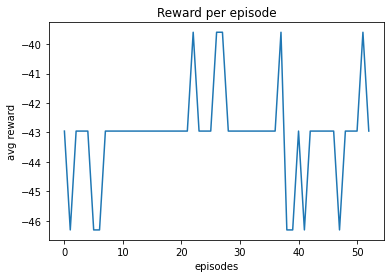

The episode is  54
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.5973154362423
the value error is 20.013881989641455


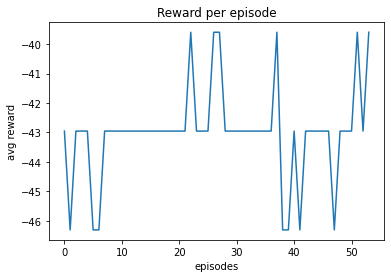

The episode is  55
Track generation: 1470..1841 -> 371-tiles trackTrack generation: 1203..1508 -> 305-tiles track
Track generation: 1028..1294 -> 266-tiles trackTrack generation: 1087..1363 -> 276-tiles track
Track generation: 927..1163 -> 236-tiles trackTrack generation: 1120..1404 -> 284-tiles track

Track generation: 1144..1440 -> 296-tiles trackTrack generation: 1101..1385 -> 284-tiles trackTrack generation: 1161..1456 -> 295-tiles track


Track generation: 1160..1454 -> 294-tiles trackTrack generation: 1237..1550 -> 313-tiles trackTrack generation: 1253..1571 -> 318-tiles trackTrack generation: 1070..1343 -> 273-tiles track
Track generation: 1212..1527 -> 315-tiles track




Track generation: 1079..1353 -> 274-tiles trackTrack generation: 1304..1635 -> 331-tiles track


The eval average rewards per episode is  -39.5973154362423
the value error is 20.013881989641455


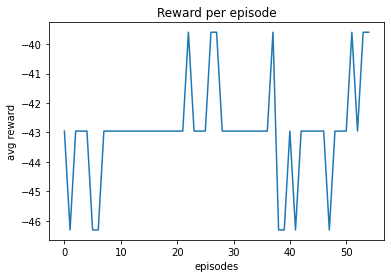

The episode is  56
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.121172597570848


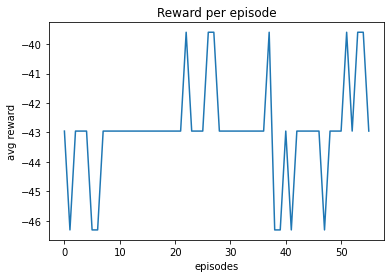

The episode is  57
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step9000.ckpt
The eval average rewards per episode is  -42.95302013422891
the value error is 21.00713297603541


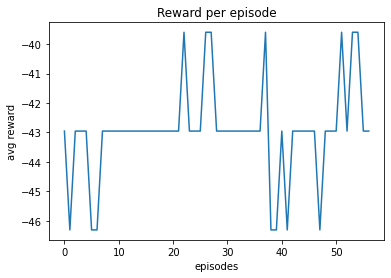

The episode is  58
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624225
the value error is 19.915596057937794


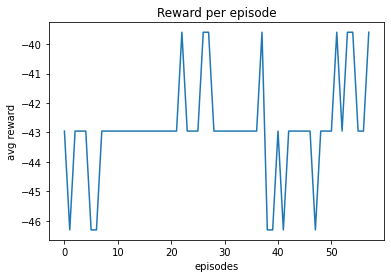

The episode is  59
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.487701764541782


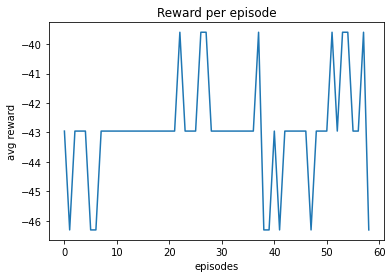

The episode is  60
The eval average rewards per episode is  -46.30872483221549
the value error is 24.487701764541782


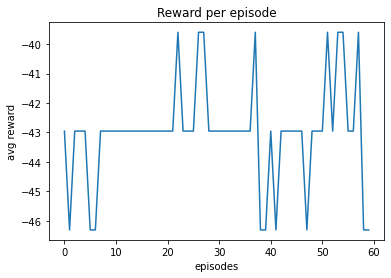

The episode is  61
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.624526619202832


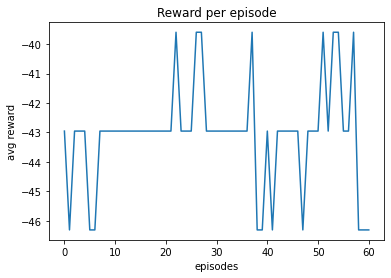

The episode is  62
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 21.926427722951797


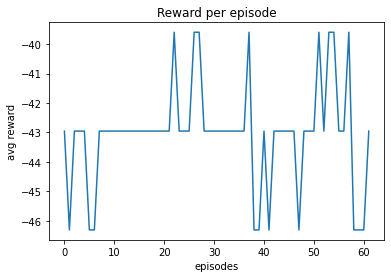

The episode is  63
Track generation: 1116..1399 -> 283-tiles track
Track generation: 989..1248 -> 259-tiles trackTrack generation: 982..1236 -> 254-tiles track
Track generation: 1103..1382 -> 279-tiles track
Track generation: 1037..1303 -> 266-tiles trackTrack generation: 1035..1306 -> 271-tiles trackTrack generation: 1198..1502 -> 304-tiles trackTrack generation: 1157..1450 -> 293-tiles trackTrack generation: 1157..1450 -> 293-tiles trackTrack generation: 1139..1428 -> 289-tiles trackTrack generation: 1185..1485 -> 300-tiles track


Track generation: 1063..1337 -> 274-tiles track


Track generation: 1143..1433 -> 290-tiles trackretry to generate track (normal if there are not many of this messages)


Track generation: 1209..1515 -> 306-tiles track
Track generation: 1136..1424 -> 288-tiles trackTrack generation: 1147..1438 -> 291-tiles trackTrack generation: 1073..1345 -> 272-tiles track


retry to generate track (normal if there are not many of this messages)

Track generation: 1073..

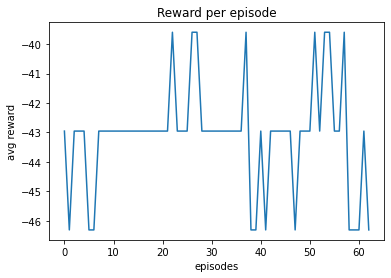

The episode is  64
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -49.66442953020209
the value error is 27.027587658789184


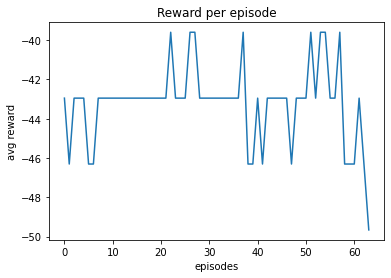

The episode is  65
The eval average rewards per episode is  -49.66442953020209
the value error is 27.027587658789184


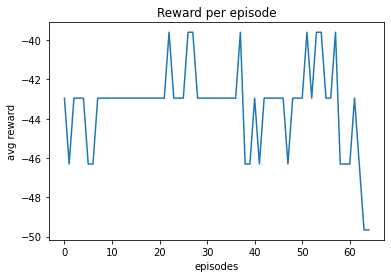

The episode is  66
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624221
the value error is 19.255056157292472


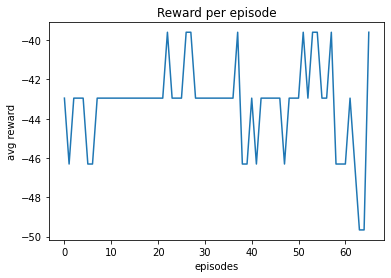

The episode is  67
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.67606282047415


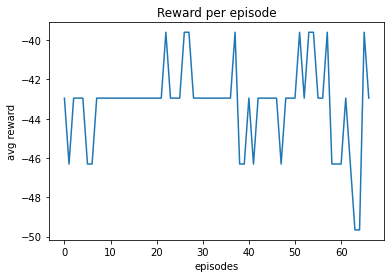

The episode is  68
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422893
the value error is 22.567656263157527


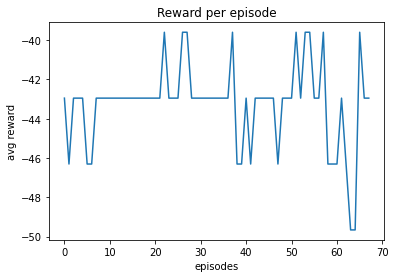

The episode is  69
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step11000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 21.893778950252326


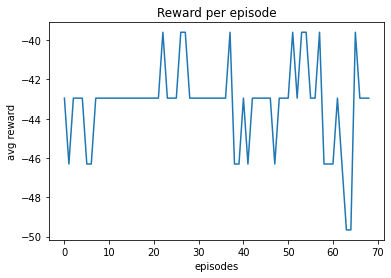

The episode is  70
The eval average rewards per episode is  -42.95302013422887
the value error is 21.893778950252326


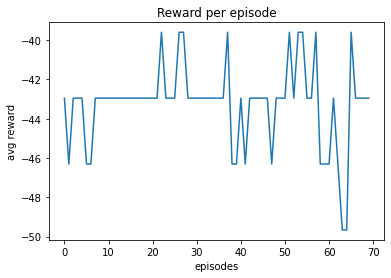

The episode is  71
Track generation: 1270..1591 -> 321-tiles track
Track generation: 1283..1608 -> 325-tiles trackTrack generation: 1076..1349 -> 273-tiles track

Track generation: 1155..1448 -> 293-tiles trackTrack generation: 1257..1575 -> 318-tiles trackTrack generation: 1267..1588 -> 321-tiles track
Track generation: 1035..1302 -> 267-tiles trackTrack generation: 1102..1383 -> 281-tiles trackTrack generation: 1140..1429 -> 289-tiles track

Track generation: 1278..1595 -> 317-tiles track
Track generation: 1132..1419 -> 287-tiles trackTrack generation: 1086..1369 -> 283-tiles trackTrack generation: 1229..1540 -> 311-tiles trackTrack generation: 998..1259 -> 261-tiles track
Track generation: 1202..1507 -> 305-tiles track





Track generation: 1084..1359 -> 275-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 21.921503649548555


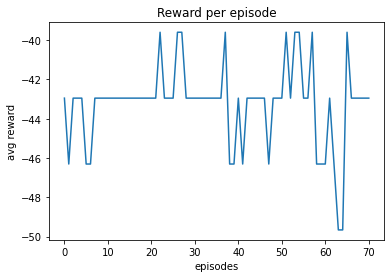

The episode is  72
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228915
the value error is 22.034271610797745


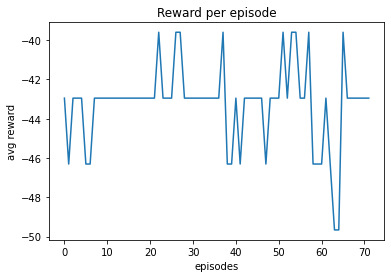

The episode is  73
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624227
the value error is 19.635927285384906


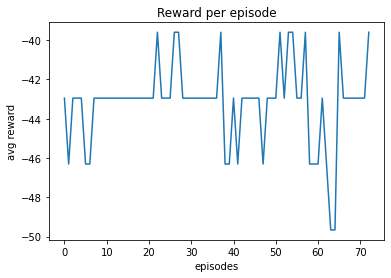

The episode is  74
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.3704915865643


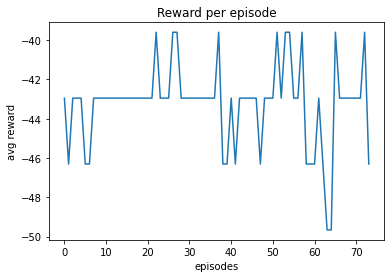

The episode is  75
The eval average rewards per episode is  -46.30872483221544
the value error is 24.3704915865643


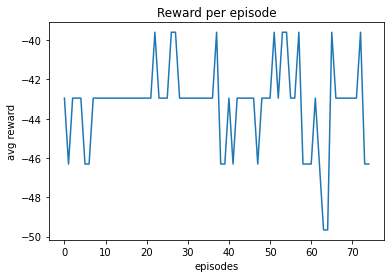

The episode is  76
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step12000.ckpt
The eval average rewards per episode is  -46.30872483221545
the value error is 25.638484723530937


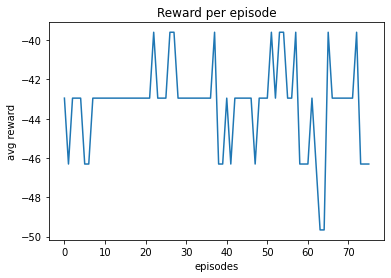

The episode is  77
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624229
the value error is 20.18544064369657


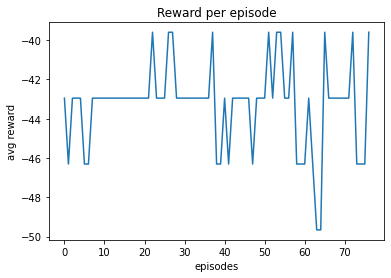

The episode is  78
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.97829651063034


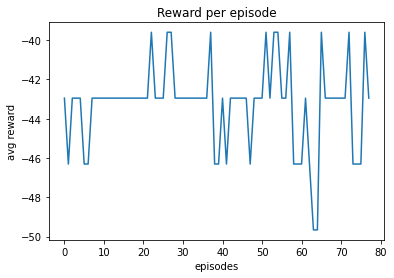

The episode is  79
Track generation: 1187..1488 -> 301-tiles track
Track generation: 1070..1342 -> 272-tiles trackTrack generation: 1243..1558 -> 315-tiles trackTrack generation: 1109..1390 -> 281-tiles trackTrack generation: 1123..1408 -> 285-tiles trackTrack generation: 1188..1489 -> 301-tiles trackTrack generation: 955..1203 -> 248-tiles track

Track generation: 1084..1359 -> 275-tiles trackTrack generation: 1020..1279 -> 259-tiles trackTrack generation: 1167..1463 -> 296-tiles track



Track generation: 1062..1332 -> 270-tiles trackTrack generation: 1187..1487 -> 300-tiles track

Track generation: 1124..1411 -> 287-tiles track



Track generation: 1140..1429 -> 289-tiles trackTrack generation: 1106..1386 -> 280-tiles trackTrack generation: 1103..1383 -> 280-tiles track
retry to generate track (normal if there are not many of this messages)

Track generation: 1049..1324 -> 275-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

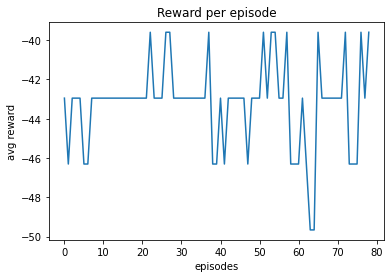

The episode is  80
The eval average rewards per episode is  -39.59731543624223
the value error is 19.73305289852609


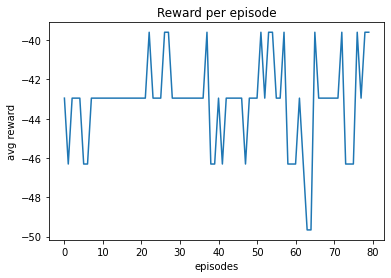

The episode is  81
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242184
the value error is 19.536114775707418


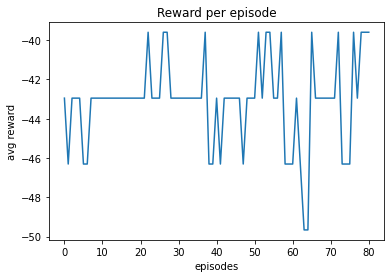

The episode is  82
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step13000.ckpt
The eval average rewards per episode is  -42.95302013422889
the value error is 22.396192684090092


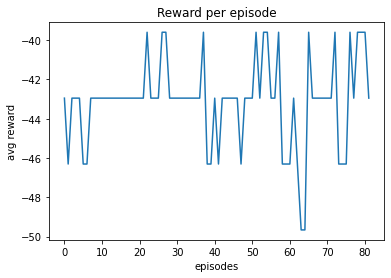

The episode is  83
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.119966963507085


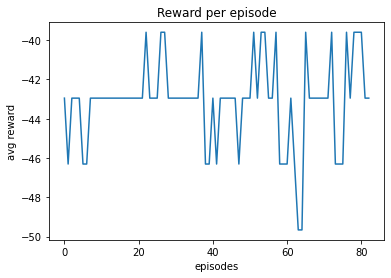

The episode is  84
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.398740361707155


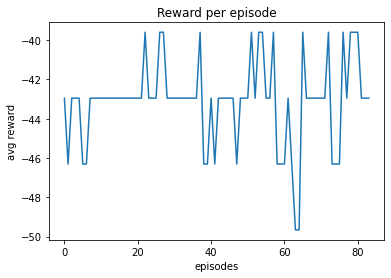

The episode is  85
The eval average rewards per episode is  -42.95302013422888
the value error is 21.398740361707155


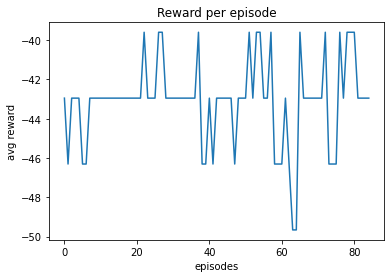

The episode is  86
Track generation: 1221..1531 -> 310-tiles trackTrack generation: 1170..1466 -> 296-tiles trackTrack generation: 1327..1663 -> 336-tiles track
Track generation: 1172..1469 -> 297-tiles trackTrack generation: 1088..1370 -> 282-tiles track
Track generation: 1279..1603 -> 324-tiles trackTrack generation: 1167..1463 -> 296-tiles track
Track generation: 1174..1472 -> 298-tiles trackTrack generation: 1135..1423 -> 288-tiles trackTrack generation: 1211..1518 -> 307-tiles trackTrack generation: 1135..1423 -> 288-tiles trackTrack generation: 1123..1408 -> 285-tiles track

Track generation: 1167..1463 -> 296-tiles trackTrack generation: 1100..1389 -> 289-tiles track







Track generation: 1063..1333 -> 270-tiles track
Track generation: 1067..1338 -> 271-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 25.124673655672215


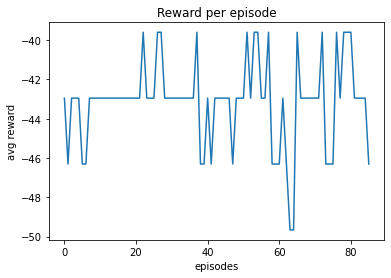

The episode is  87
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221541
the value error is 24.969261579992633


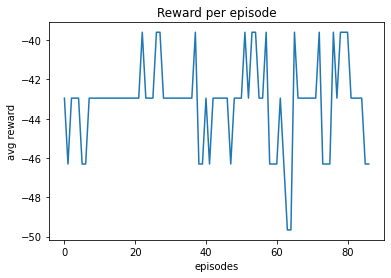

The episode is  88
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step14000.ckpt
The eval average rewards per episode is  -42.953020134228865
the value error is 22.17254916784297


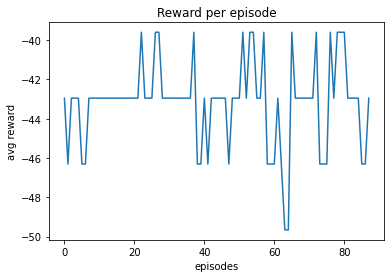

The episode is  89
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 24.283570488547944


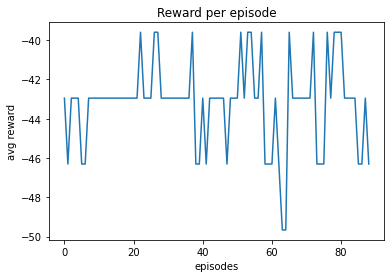

The episode is  90
The eval average rewards per episode is  -46.308724832215496
the value error is 24.283570488547944


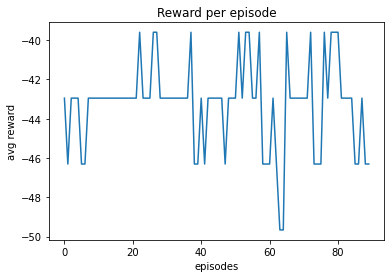

The episode is  91
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242276
the value error is 19.08517806105645


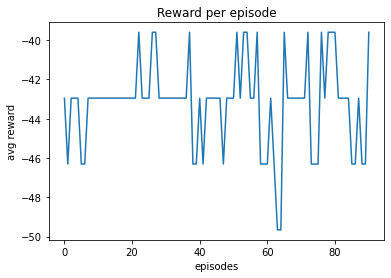

The episode is  92
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.710372501233955


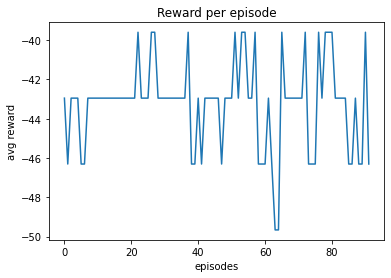

The episode is  93
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.541040578075993


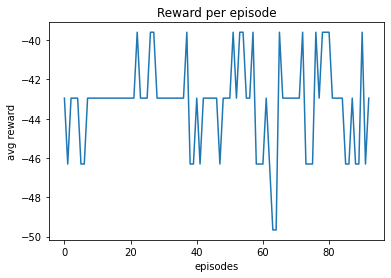

The episode is  94
Track generation: 1256..1574 -> 318-tiles track
Track generation: 1009..1265 -> 256-tiles trackTrack generation: 1131..1418 -> 287-tiles trackTrack generation: 1067..1338 -> 271-tiles trackTrack generation: 1192..1494 -> 302-tiles trackTrack generation: 1175..1473 -> 298-tiles trackTrack generation: 1110..1400 -> 290-tiles track
Track generation: 1215..1523 -> 308-tiles trackTrack generation: 1098..1383 -> 285-tiles track
Track generation: 1094..1371 -> 277-tiles track
Track generation: 1132..1419 -> 287-tiles trackTrack generation: 1155..1453 -> 298-tiles trackTrack generation: 1220..1529 -> 309-tiles track
Track generation: 1162..1464 -> 302-tiles track






Track generation: 1055..1330 -> 275-tiles track
Track generation: 1239..1561 -> 322-tiles trackretry to generate track (normal if there are not many of this messages)



Track generation: 1080..1354 -> 274-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model che

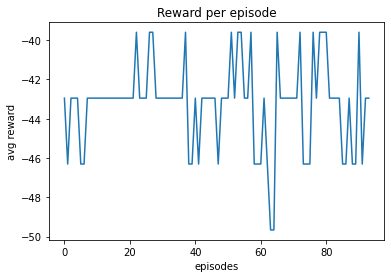

The episode is  95
The eval average rewards per episode is  -42.953020134228844
the value error is 22.1612283181442


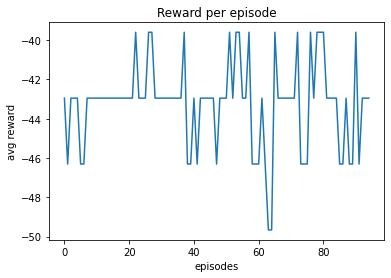

The episode is  96
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 21.994173518579693


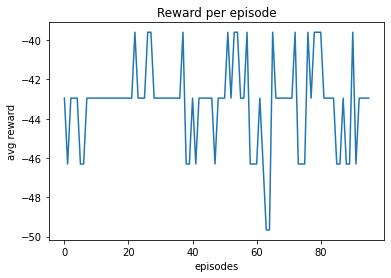

The episode is  97
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 22.62952888632099


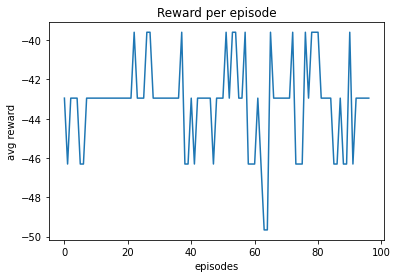

The episode is  98
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.69378791545689


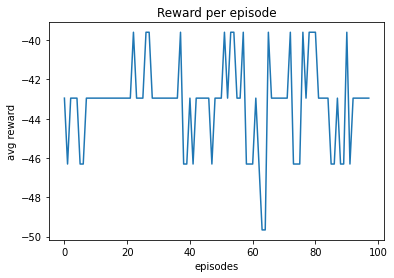

The episode is  99
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 22.343808784354355


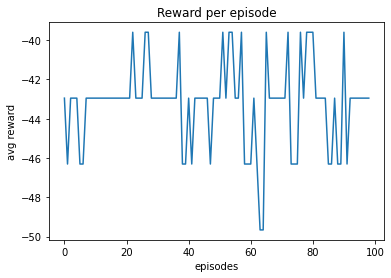

The episode is  100
The eval average rewards per episode is  -42.95302013422888
the value error is 22.343808784354355


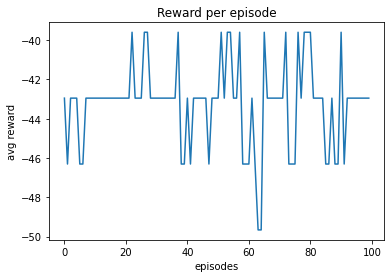

The episode is  101
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step16000.ckpt
The eval average rewards per episode is  -46.30872483221547
the value error is 23.996202708536895


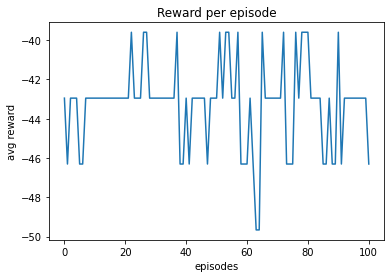

The episode is  102
Track generation: 1191..1492 -> 301-tiles track
Track generation: 1154..1454 -> 300-tiles trackTrack generation: 1035..1298 -> 263-tiles trackTrack generation: 1045..1314 -> 269-tiles track

Track generation: 1248..1575 -> 327-tiles trackTrack generation: 1152..1444 -> 292-tiles track


Track generation: 1092..1369 -> 277-tiles trackTrack generation: 978..1226 -> 248-tiles trackTrack generation: 1094..1372 -> 278-tiles trackTrack generation: 1352..1694 -> 342-tiles trackTrack generation: 1140..1429 -> 289-tiles trackTrack generation: 1093..1371 -> 278-tiles trackTrack generation: 1044..1309 -> 265-tiles track
Track generation: 1191..1494 -> 303-tiles trackTrack generation: 1168..1464 -> 296-tiles track
retry to generate track (normal if there are not many of this messages)






Track generation: 1275..1598 -> 323-tiles track

Track generation: 1036..1299 -> 263-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average

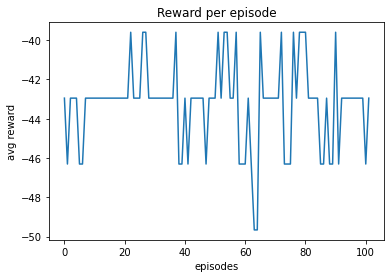

The episode is  103
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.140930917078926


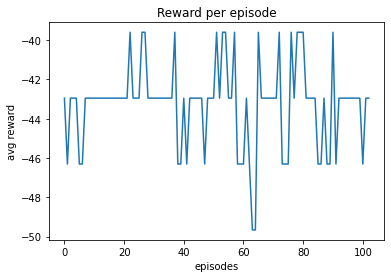

The episode is  104
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.95947203403439


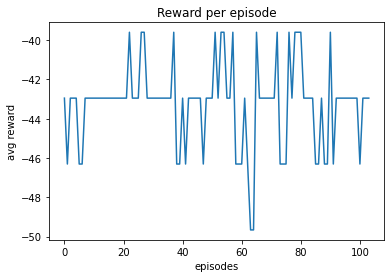

The episode is  105
The eval average rewards per episode is  -42.95302013422881
the value error is 21.95947203403439


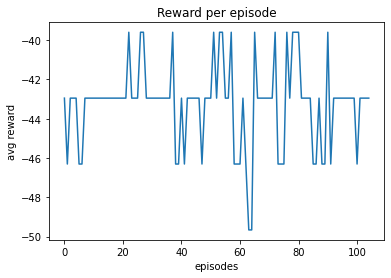

The episode is  106
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624228
the value error is 20.062193324794627


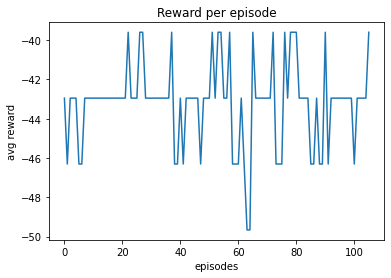

The episode is  107
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step17000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 22.251730475088667


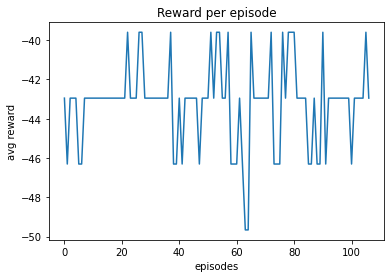

The episode is  108
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.976495362493214


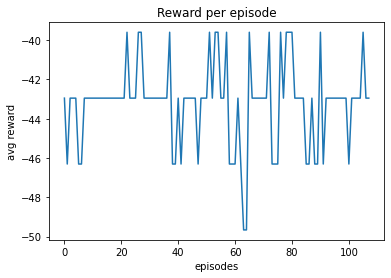

The episode is  109
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 23.017813545552073


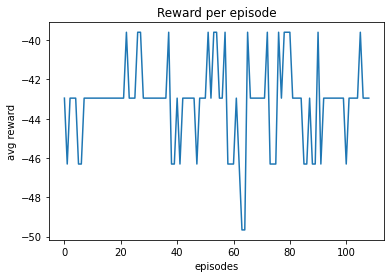

The episode is  110
Track generation: 1190..1491 -> 301-tiles track
Track generation: 1168..1464 -> 296-tiles trackTrack generation: 1145..1435 -> 290-tiles trackTrack generation: 1104..1384 -> 280-tiles trackTrack generation: 1213..1520 -> 307-tiles trackTrack generation: 941..1183 -> 242-tiles trackTrack generation: 1207..1513 -> 306-tiles track
Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1079..1353 -> 274-tiles track
Track generation: 1216..1524 -> 308-tiles track

Track generation: 1187..1496 -> 309-tiles trackTrack generation: 1084..1359 -> 275-tiles track
Track generation: 1114..1398 -> 284-tiles track






retry to generate track (normal if there are not many of this messages)Track generation: 1054..1322 -> 268-tiles trackTrack generation: 1289..1615 -> 326-tiles trackTrack generation: 1172..1473 -> 301-tiles track



Track generation: 1076..1353 -> 277-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 113

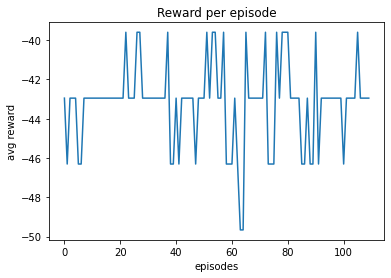

The episode is  111
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.534898683194218


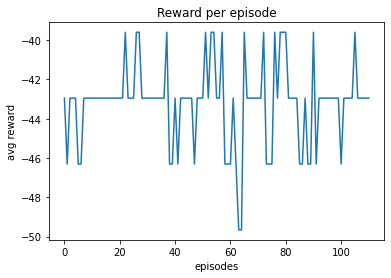

The episode is  112
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422879
the value error is 22.4883062700445


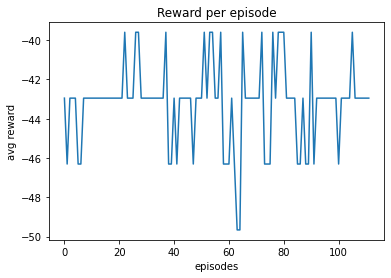

The episode is  113
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step18000.ckpt
The eval average rewards per episode is  -46.30872483221548
the value error is 24.994305418433004


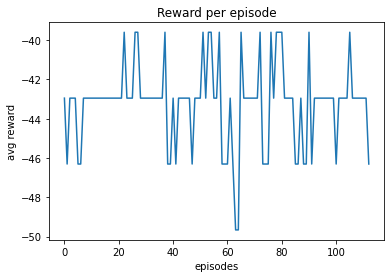

The episode is  114
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.128190042404015


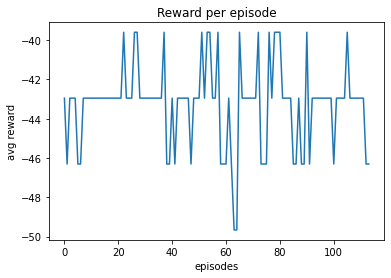

The episode is  115
The eval average rewards per episode is  -46.30872483221547
the value error is 24.128190042404015


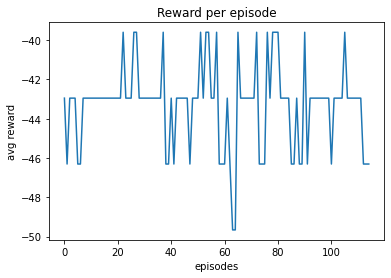

The episode is  116
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.91772667987622


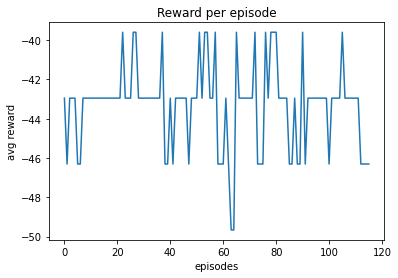

The episode is  117
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 23.556129462717287


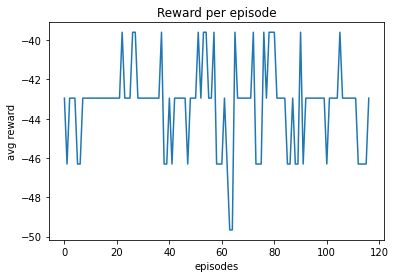

The episode is  118
Track generation: 932..1169 -> 237-tiles trackTrack generation: 1047..1313 -> 266-tiles trackTrack generation: 1184..1484 -> 300-tiles track
Track generation: 1075..1355 -> 280-tiles trackTrack generation: 1107..1395 -> 288-tiles track
Track generation: 1298..1633 -> 335-tiles track
Track generation: 1124..1409 -> 285-tiles track
Track generation: 1147..1444 -> 297-tiles trackTrack generation: 1070..1349 -> 279-tiles trackTrack generation: 1176..1474 -> 298-tiles trackTrack generation: 1328..1664 -> 336-tiles track




Track generation: 1107..1397 -> 290-tiles trackTrack generation: 1080..1362 -> 282-tiles track
Track generation: 1139..1428 -> 289-tiles trackTrack generation: 1249..1572 -> 323-tiles track



Track generation: 1059..1335 -> 276-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 24.10621073275018


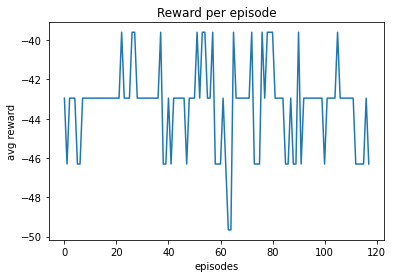

The episode is  119
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step19000.ckpt
The eval average rewards per episode is  -42.95302013422889
the value error is 22.11340829842354


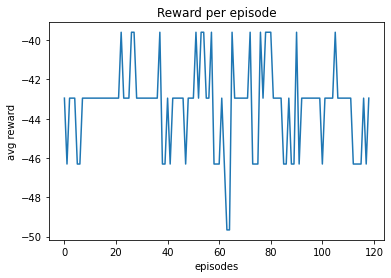

The episode is  120
The eval average rewards per episode is  -42.95302013422889
the value error is 22.11340829842354


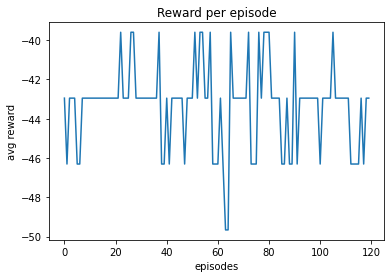

The episode is  121
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.523002112177124


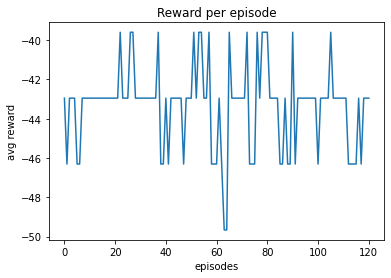

The episode is  122
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 22.507776672939702


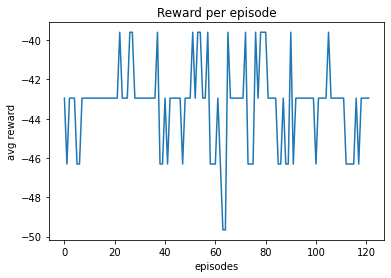

The episode is  123
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.468046824037934


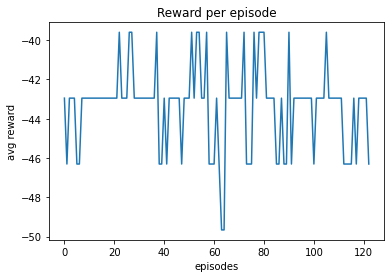

The episode is  124
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 23.894824263828816


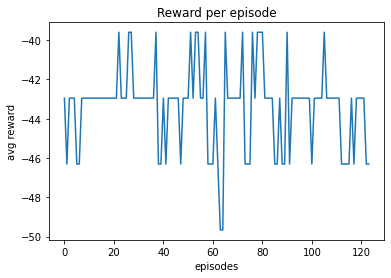

The episode is  125
Track generation: 1157..1455 -> 298-tiles trackTrack generation: 1310..1639 -> 329-tiles track
Track generation: 1220..1529 -> 309-tiles trackTrack generation: 1175..1473 -> 298-tiles trackTrack generation: 1338..1676 -> 338-tiles trackTrack generation: 1073..1348 -> 275-tiles track

Track generation: 996..1254 -> 258-tiles track
Track generation: 1108..1389 -> 281-tiles track
Track generation: 1184..1484 -> 300-tiles trackTrack generation: 1144..1434 -> 290-tiles track


Track generation: 1109..1396 -> 287-tiles track



Track generation: 1106..1395 -> 289-tiles trackTrack generation: 1168..1464 -> 296-tiles trackretry to generate track (normal if there are not many of this messages)

Track generation: 1151..1443 -> 292-tiles track
Track generation: 1147..1438 -> 291-tiles trackTrack generation: 1263..1585 -> 322-tiles trackTrack generation: 1066..1337 -> 271-tiles track


The eval average rewards per episode is  -46.308724832215475
the value error is 23.8948242638

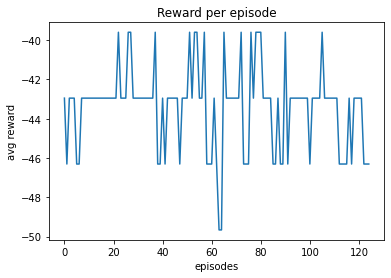

The episode is  126
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step20000.ckpt
The eval average rewards per episode is  -42.953020134228915
the value error is 22.054318472401295


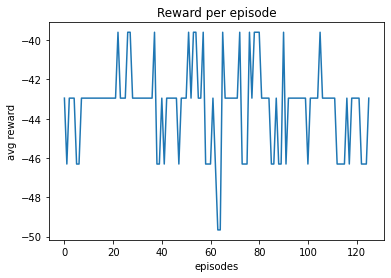

The episode is  127
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.23154262146582


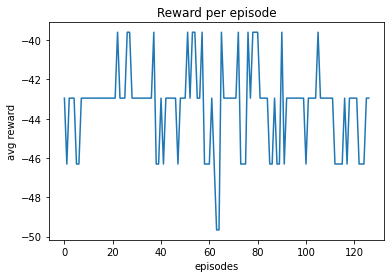

The episode is  128
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.81906532622189


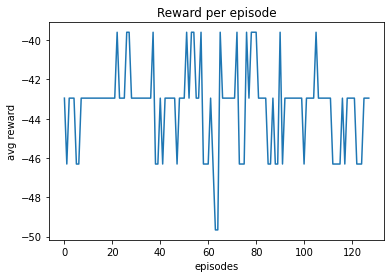

The episode is  129
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 24.38611662362983


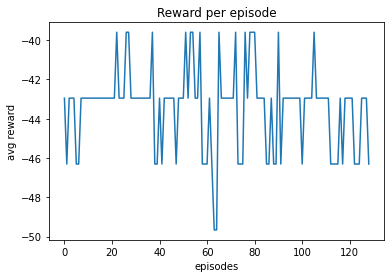

The episode is  130
The eval average rewards per episode is  -46.308724832215454
the value error is 24.38611662362983


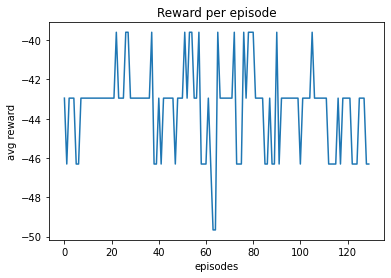

The episode is  131
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 22.555650062795706


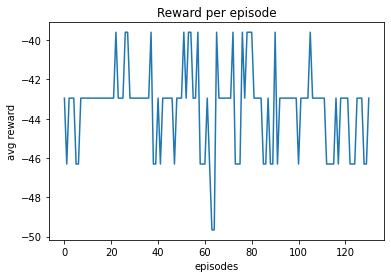

The episode is  132
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step21000.ckpt
The eval average rewards per episode is  -42.953020134228915
the value error is 22.045796088515324


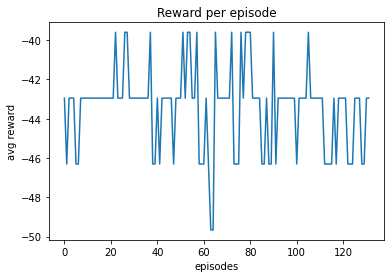

The episode is  133
Track generation: 1208..1515 -> 307-tiles trackTrack generation: 1074..1347 -> 273-tiles trackTrack generation: 1195..1499 -> 304-tiles track


Track generation: 1242..1558 -> 316-tiles trackTrack generation: 1104..1388 -> 284-tiles track
Track generation: 1288..1614 -> 326-tiles track

Track generation: 1003..1258 -> 255-tiles trackTrack generation: 1119..1409 -> 290-tiles trackTrack generation: 1254..1575 -> 321-tiles trackTrack generation: 1040..1304 -> 264-tiles trackTrack generation: 1072..1344 -> 272-tiles trackTrack generation: 1132..1419 -> 287-tiles track

Track generation: 1079..1353 -> 274-tiles track

Track generation: 1083..1358 -> 275-tiles track

Track generation: 1204..1509 -> 305-tiles trackTrack generation: 1371..1728 -> 357-tiles track



retry to generate track (normal if there are not many of this messages)
Track generation: 1087..1363 -> 276-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval averag

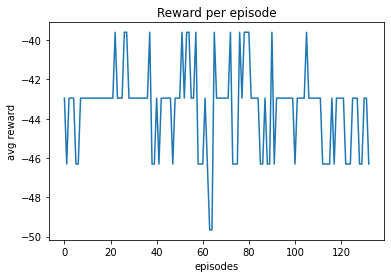

The episode is  134
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 24.901710832584335


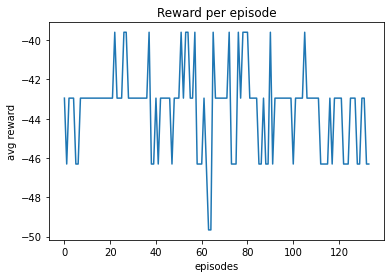

The episode is  135
The eval average rewards per episode is  -46.30872483221543
the value error is 24.901710832584335


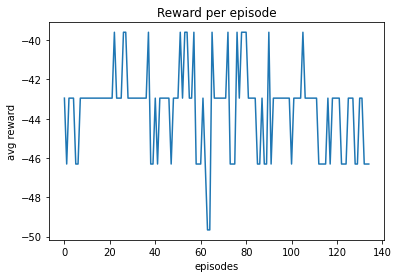

The episode is  136
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 22.367320182818617


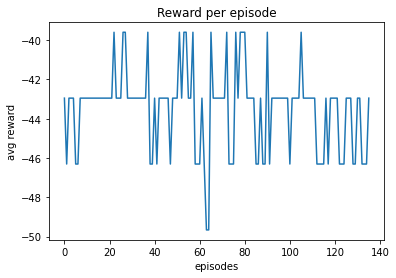

The episode is  137
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.101837802072243


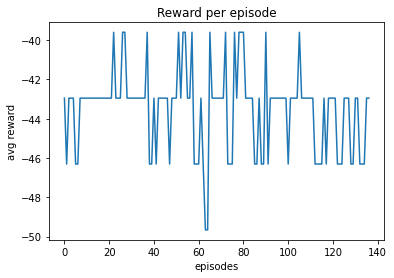

The episode is  138
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step22000.ckpt
The eval average rewards per episode is  -46.308724832215496
the value error is 24.96493926017163


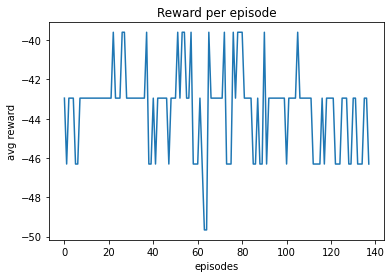

The episode is  139
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422892
the value error is 22.71588244449428


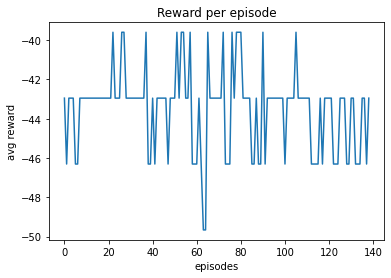

The episode is  140
The eval average rewards per episode is  -42.95302013422892
the value error is 22.71588244449428


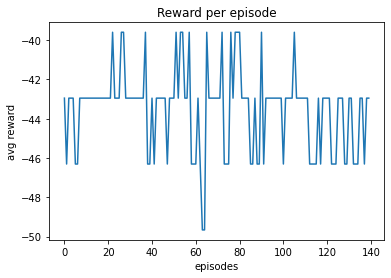

The episode is  141
Track generation: 1189..1490 -> 301-tiles trackTrack generation: 1231..1543 -> 312-tiles trackTrack generation: 1162..1462 -> 300-tiles trackTrack generation: 1168..1464 -> 296-tiles track

Track generation: 995..1254 -> 259-tiles trackTrack generation: 1093..1370 -> 277-tiles trackTrack generation: 1206..1512 -> 306-tiles track


Track generation: 1168..1464 -> 296-tiles trackTrack generation: 1254..1571 -> 317-tiles track
Track generation: 1024..1284 -> 260-tiles track
Track generation: 1068..1343 -> 275-tiles trackTrack generation: 1161..1455 -> 294-tiles trackTrack generation: 1052..1323 -> 271-tiles track

Track generation: 1076..1349 -> 273-tiles track


Track generation: 1131..1425 -> 294-tiles trackTrack generation: 1260..1579 -> 319-tiles track



retry to generate track (normal if there are not many of this messages)retry to generate track (normal if there are not many of this messages)

Track generation: 1213..1520 -> 307-tiles trackTrack generation: 1056

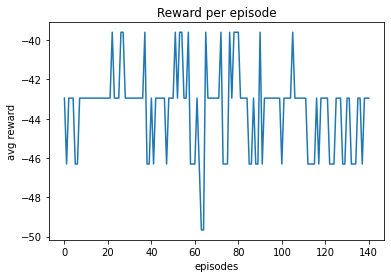

The episode is  142
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.823345944480835


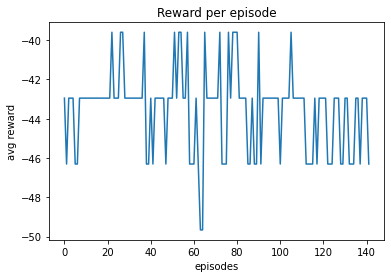

The episode is  143
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.716716806131387


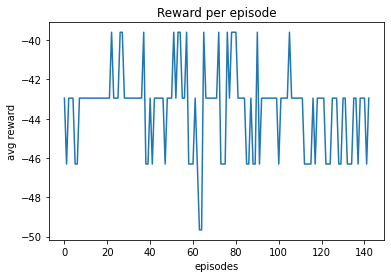

The episode is  144
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step23000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 21.724175119608713


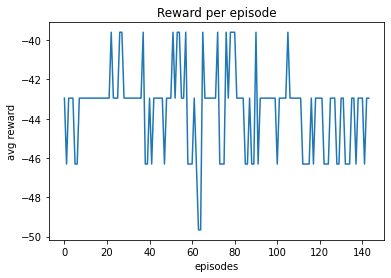

The episode is  145
The eval average rewards per episode is  -42.95302013422887
the value error is 21.724175119608713


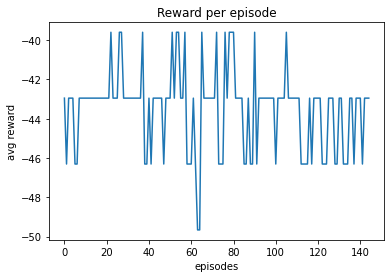

The episode is  146
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.921523548364267


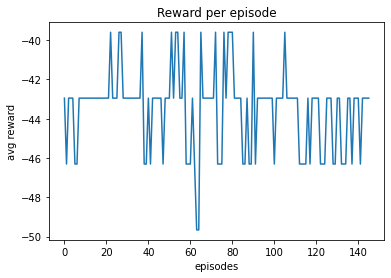

The episode is  147
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 23.82230363347321


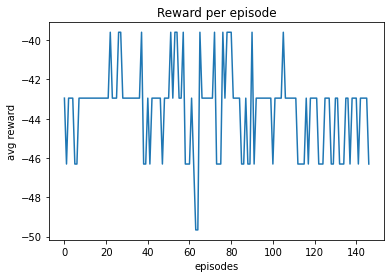

The episode is  148
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422878
the value error is 21.520580498956782


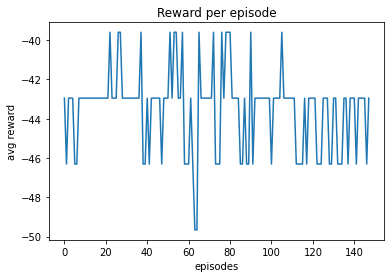

The episode is  149
Track generation: 951..1199 -> 248-tiles track
Track generation: 1176..1474 -> 298-tiles trackTrack generation: 1151..1443 -> 292-tiles trackTrack generation: 1212..1519 -> 307-tiles trackTrack generation: 1145..1441 -> 296-tiles trackTrack generation: 1223..1533 -> 310-tiles track

Track generation: 1032..1294 -> 262-tiles track


Track generation: 1119..1403 -> 284-tiles trackTrack generation: 1184..1484 -> 300-tiles trackTrack generation: 1200..1504 -> 304-tiles trackTrack generation: 1012..1269 -> 257-tiles track
Track generation: 1134..1427 -> 293-tiles track
Track generation: 990..1248 -> 258-tiles trackTrack generation: 1090..1372 -> 282-tiles trackTrack generation: 1128..1414 -> 286-tiles trackTrack generation: 1119..1402 -> 283-tiles track







[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 24.610842205418663


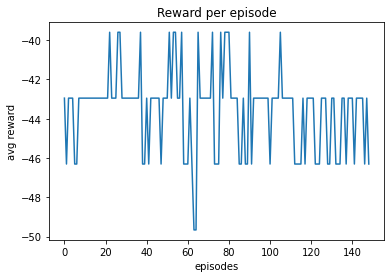

The episode is  150
The eval average rewards per episode is  -46.30872483221545
the value error is 24.610842205418663


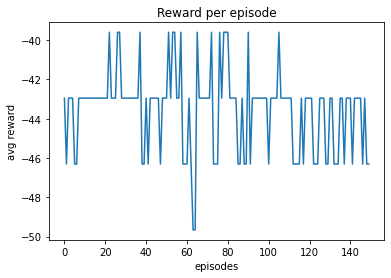

The episode is  151
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step24000.ckpt
The eval average rewards per episode is  -42.95302013422879
the value error is 21.623966474079964


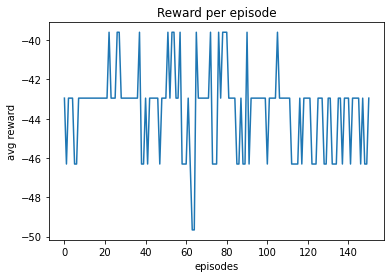

The episode is  152
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 24.534243737516395


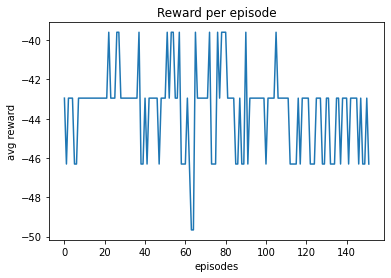

The episode is  153
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 24.396051373012313


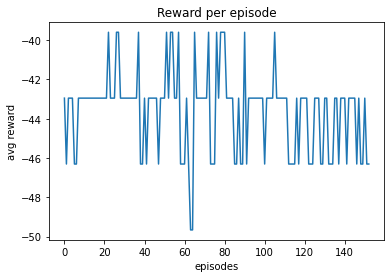

The episode is  154
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 25.25695512838601


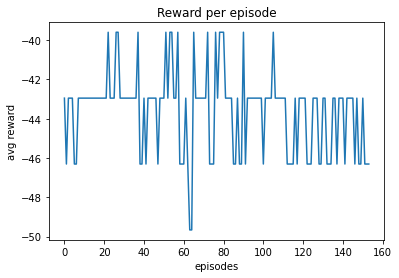

The episode is  155
The eval average rewards per episode is  -46.30872483221544
the value error is 25.25695512838601


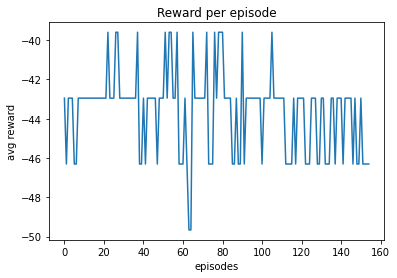

The episode is  156
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.97400690040234


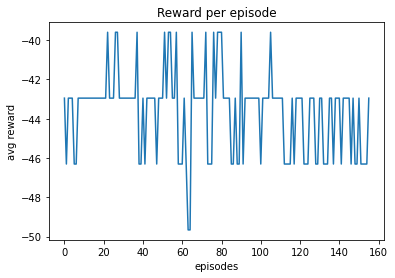

The episode is  157
Track generation: 1095..1373 -> 278-tiles trackTrack generation: 1112..1394 -> 282-tiles track

Track generation: 1152..1446 -> 294-tiles trackTrack generation: 1080..1354 -> 274-tiles track
Track generation: 1092..1372 -> 280-tiles trackTrack generation: 1097..1386 -> 289-tiles track
Track generation: 1066..1340 -> 274-tiles trackTrack generation: 1254..1580 -> 326-tiles trackTrack generation: 1041..1304 -> 263-tiles trackTrack generation: 1148..1439 -> 291-tiles track
Track generation: 1125..1410 -> 285-tiles track
Track generation: 1178..1476 -> 298-tiles trackTrack generation: 1092..1369 -> 277-tiles track
Track generation: 1201..1505 -> 304-tiles trackTrack generation: 1344..1684 -> 340-tiles track




Track generation: 1200..1504 -> 304-tiles track



retry to generate track (normal if there are not many of this messages)
Track generation: 1156..1449 -> 293-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model ch

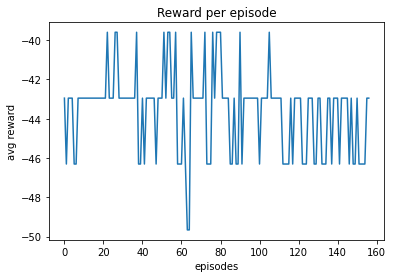

The episode is  158
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.62602623010505


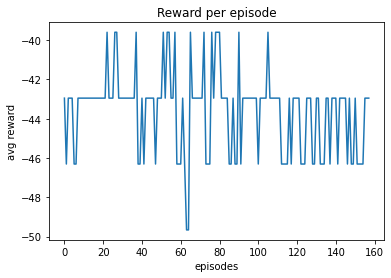

The episode is  159
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.45228843200802


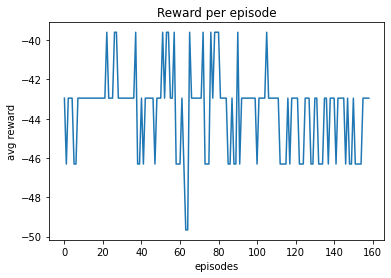

The episode is  160
The eval average rewards per episode is  -42.953020134228886
the value error is 21.45228843200802


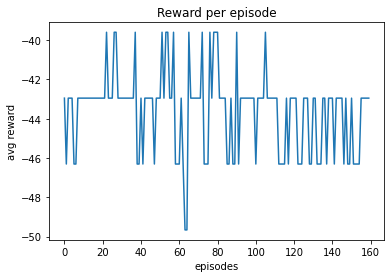

The episode is  161
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242255
the value error is 19.132305884857743


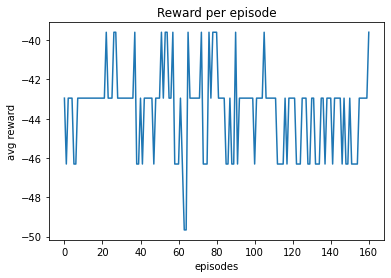

The episode is  162
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.70605104417771


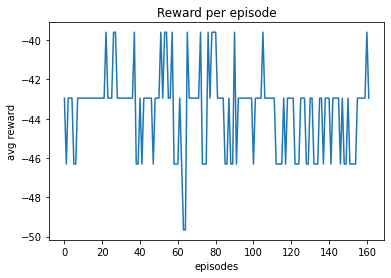

The episode is  163
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step26000.ckpt
The eval average rewards per episode is  -42.95302013422888
the value error is 21.480640953272765


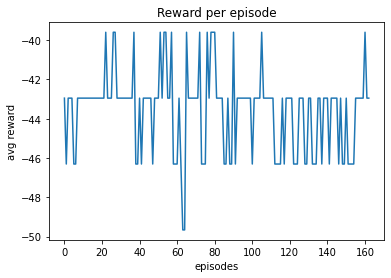

The episode is  164
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.867916734931832


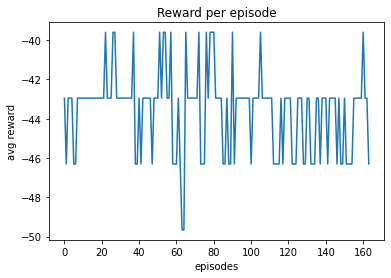

The episode is  165
Track generation: 1148..1439 -> 291-tiles trackTrack generation: 1207..1513 -> 306-tiles track

Track generation: 1207..1514 -> 307-tiles trackTrack generation: 1211..1523 -> 312-tiles track
Track generation: 1195..1501 -> 306-tiles trackTrack generation: 1117..1408 -> 291-tiles trackTrack generation: 1333..1669 -> 336-tiles trackTrack generation: 1199..1509 -> 310-tiles track
Track generation: 1198..1502 -> 304-tiles trackTrack generation: 1151..1443 -> 292-tiles trackTrack generation: 1213..1520 -> 307-tiles track

Track generation: 1043..1308 -> 265-tiles trackTrack generation: 1114..1396 -> 282-tiles trackTrack generation: 1265..1593 -> 328-tiles track



Track generation: 1030..1290 -> 260-tiles track



Track generation: 1159..1453 -> 294-tiles track

retry to generate track (normal if there are not many of this messages)
Track generation: 984..1236 -> 252-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 114

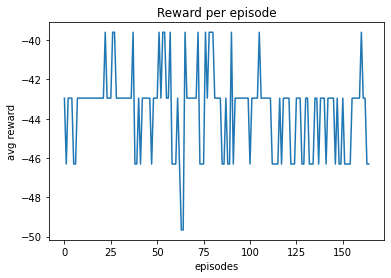

The episode is  166
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 22.075101331498608


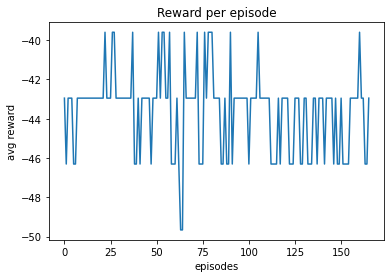

The episode is  167
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.34356736851292


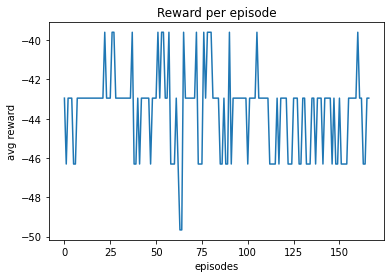

The episode is  168
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228915
the value error is 22.915162218764564


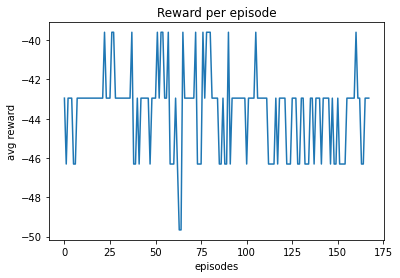

The episode is  169
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step27000.ckpt
The eval average rewards per episode is  -42.953020134228765
the value error is 21.827527045296595


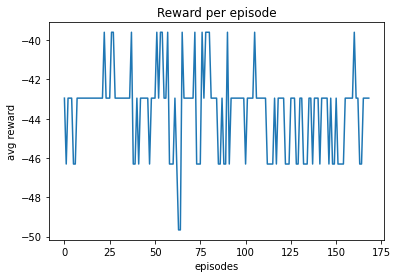

The episode is  170
The eval average rewards per episode is  -42.953020134228765
the value error is 21.827527045296595


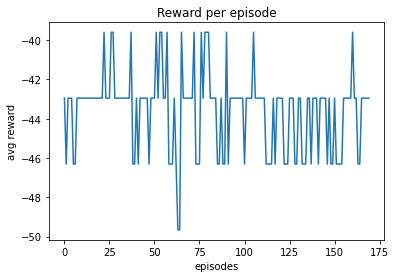

The episode is  171
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.491693457580634


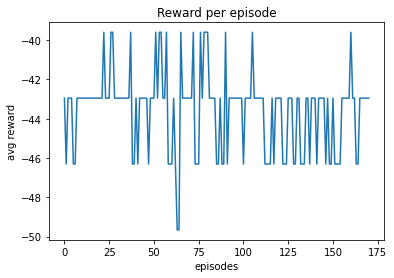

The episode is  172
Track generation: 1147..1438 -> 291-tiles trackTrack generation: 1028..1289 -> 261-tiles track
Track generation: 1096..1374 -> 278-tiles track
Track generation: 1095..1383 -> 288-tiles track
Track generation: 1159..1453 -> 294-tiles trackTrack generation: 1179..1477 -> 298-tiles track
Track generation: 1305..1635 -> 330-tiles trackTrack generation: 1122..1417 -> 295-tiles trackTrack generation: 1151..1443 -> 292-tiles track



Track generation: 1159..1453 -> 294-tiles trackTrack generation: 1005..1260 -> 255-tiles track
Track generation: 1078..1352 -> 274-tiles trackTrack generation: 1183..1483 -> 300-tiles trackTrack generation: 1129..1415 -> 286-tiles trackTrack generation: 1063..1342 -> 279-tiles track

Track generation: 1040..1304 -> 264-tiles track




[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.909668443224977


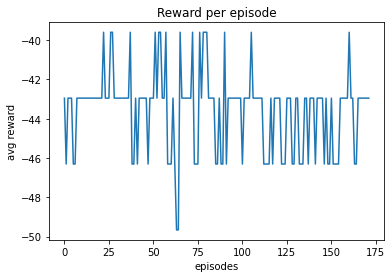

The episode is  173
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.295928340309388


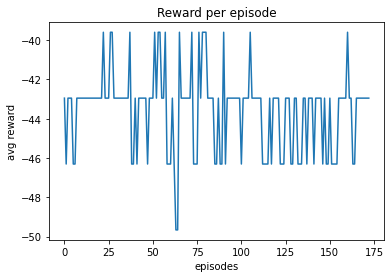

The episode is  174
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.128894870076294


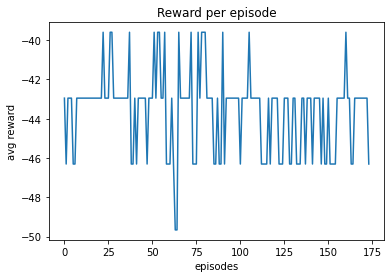

The episode is  175
The eval average rewards per episode is  -46.30872483221548
the value error is 24.128894870076294


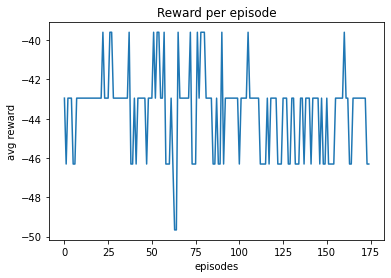

The episode is  176
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step28000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.71768074285831


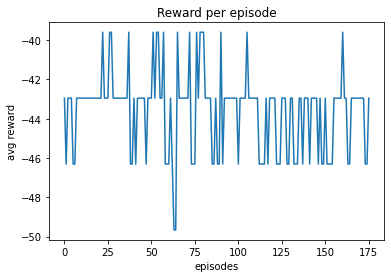

The episode is  177
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 22.485399994523316


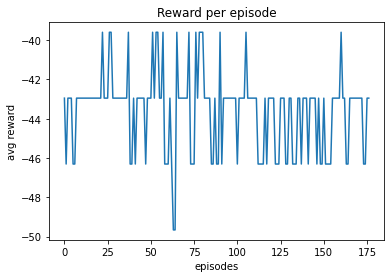

The episode is  178
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 21.25629074086732


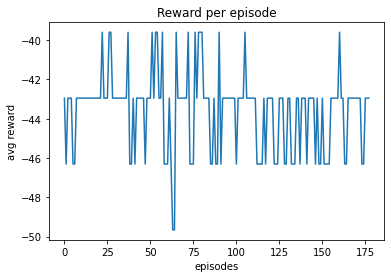

The episode is  179
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.560471020758012


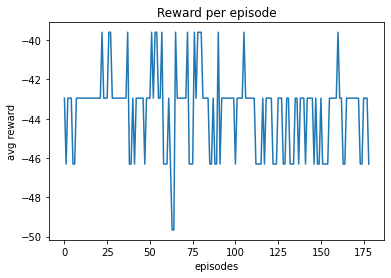

The episode is  180
Track generation: 1262..1581 -> 319-tiles trackTrack generation: 1156..1449 -> 293-tiles track

Track generation: 1095..1373 -> 278-tiles trackTrack generation: 1056..1331 -> 275-tiles trackTrack generation: 1152..1444 -> 292-tiles trackTrack generation: 978..1232 -> 254-tiles trackTrack generation: 1067..1338 -> 271-tiles trackTrack generation: 1121..1406 -> 285-tiles track
Track generation: 1203..1508 -> 305-tiles track

Track generation: 1246..1562 -> 316-tiles track
Track generation: 1150..1449 -> 299-tiles trackTrack generation: 1161..1455 -> 294-tiles trackTrack generation: 1139..1428 -> 289-tiles track

Track generation: 1061..1330 -> 269-tiles track


Track generation: 1335..1676 -> 341-tiles trackTrack generation: 980..1233 -> 253-tiles track




The eval average rewards per episode is  -46.30872483221549
the value error is 24.560471020758012


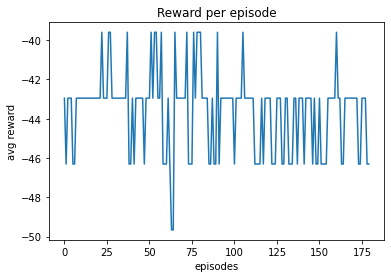

The episode is  181
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.28390570374312


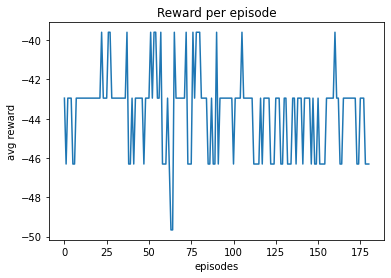

The episode is  182
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step29000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.826980120074538


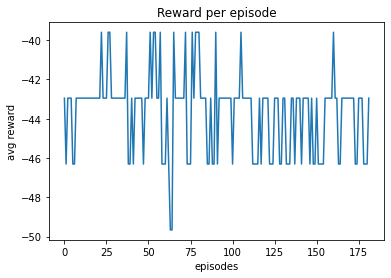

The episode is  183
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -36.24161073825555
the value error is 16.87027766112598


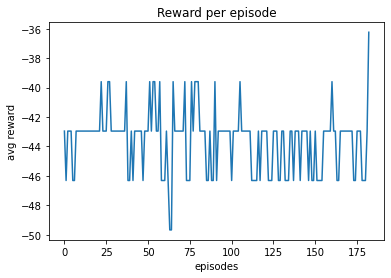

The episode is  184
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 24.272555022300775


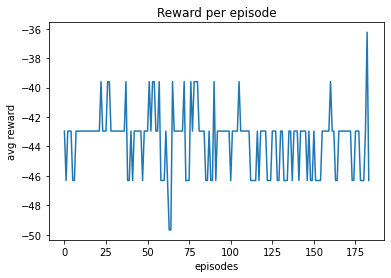

The episode is  185
The eval average rewards per episode is  -46.30872483221545
the value error is 24.272555022300775


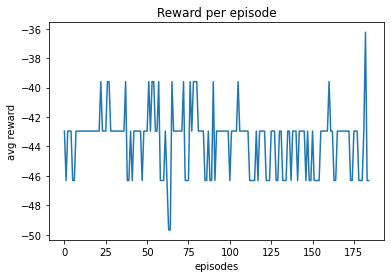

The episode is  186
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242205
the value error is 19.962581214183267


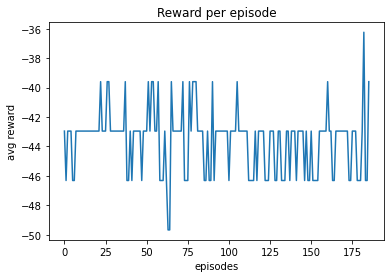

The episode is  187
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.078613878559935


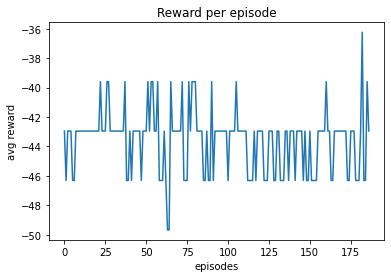

The episode is  188
Track generation: 1155..1448 -> 293-tiles trackTrack generation: 1073..1345 -> 272-tiles trackTrack generation: 1114..1397 -> 283-tiles trackTrack generation: 1096..1374 -> 278-tiles trackTrack generation: 1263..1583 -> 320-tiles trackTrack generation: 1036..1299 -> 263-tiles track
Track generation: 1142..1432 -> 290-tiles trackTrack generation: 1161..1461 -> 300-tiles trackTrack generation: 1044..1309 -> 265-tiles track


Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1252..1569 -> 317-tiles track
Track generation: 1227..1538 -> 311-tiles trackTrack generation: 1160..1454 -> 294-tiles track

Track generation: 1057..1325 -> 268-tiles trackTrack generation: 1157..1450 -> 293-tiles track







Track generation: 1103..1383 -> 280-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step30000.ckpt
The eval average rewards per episode is  -42.95302013422886
the 

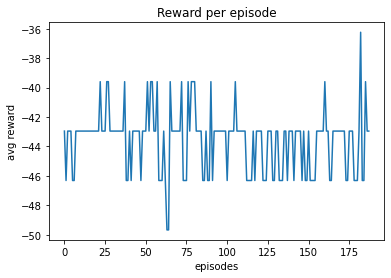

The episode is  189
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 23.536902399927676


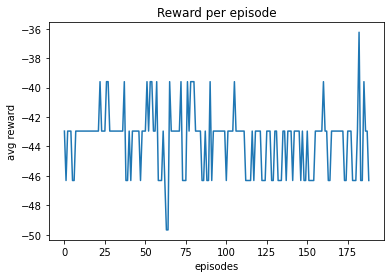

The episode is  190
The eval average rewards per episode is  -46.30872483221553
the value error is 23.536902399927676


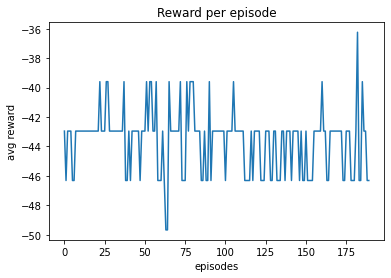

The episode is  191
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242276
the value error is 19.456692241355345


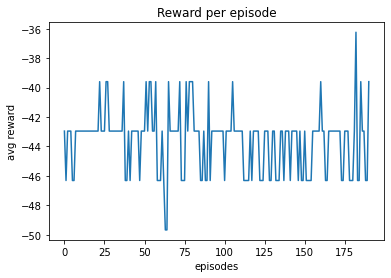

The episode is  192
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 22.862440435726576


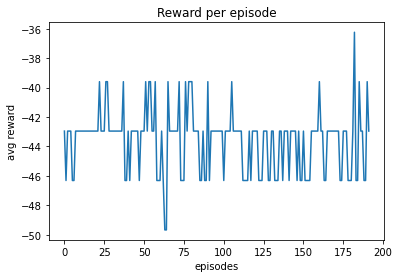

The episode is  193
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624224
the value error is 20.19142081690753


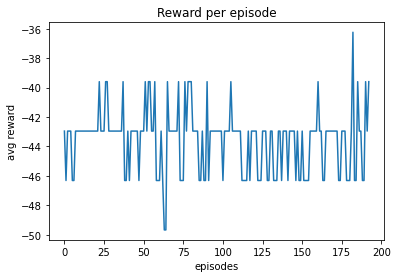

The episode is  194
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step31000.ckpt
The eval average rewards per episode is  -39.597315436242255
the value error is 19.556499657721297


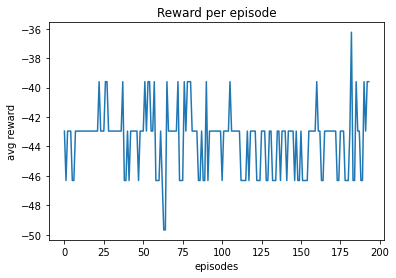

The episode is  195
The eval average rewards per episode is  -39.597315436242255
the value error is 19.556499657721297


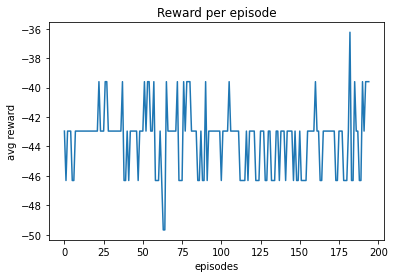

The episode is  196
Track generation: 1225..1535 -> 310-tiles track
Track generation: 997..1257 -> 260-tiles trackTrack generation: 995..1248 -> 253-tiles trackTrack generation: 1097..1375 -> 278-tiles track


Track generation: 1048..1314 -> 266-tiles trackTrack generation: 1157..1450 -> 293-tiles trackTrack generation: 979..1234 -> 255-tiles trackTrack generation: 1103..1383 -> 280-tiles track
Track generation: 1036..1307 -> 271-tiles trackTrack generation: 1127..1413 -> 286-tiles track
Track generation: 1114..1404 -> 290-tiles track
Track generation: 1195..1498 -> 303-tiles trackTrack generation: 1075..1348 -> 273-tiles track

Track generation: 1207..1513 -> 306-tiles track




Track generation: 1196..1499 -> 303-tiles trackTrack generation: 1396..1749 -> 353-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.3087248322155
the value error is 24.57021655802551


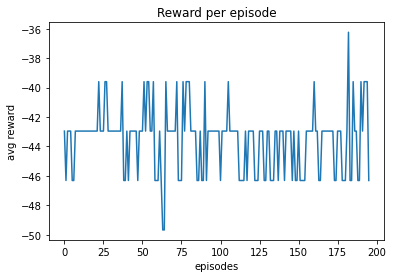

The episode is  197
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.22474675213163


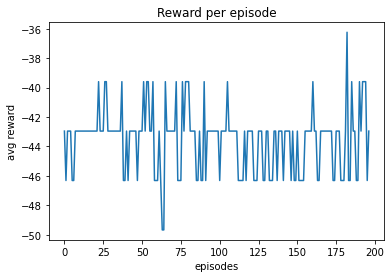

The episode is  198
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 23.709880201196103


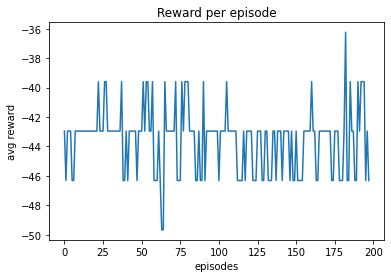

The episode is  199
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624227
the value error is 18.5564389480167


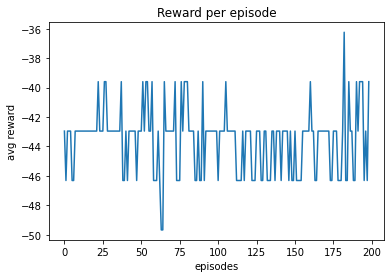

The episode is  200
The eval average rewards per episode is  -39.59731543624227
the value error is 18.5564389480167


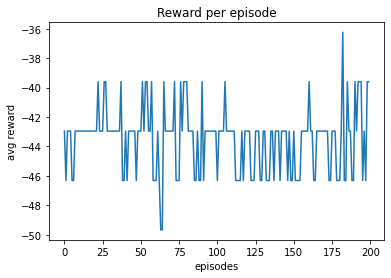

The episode is  201
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step32000.ckpt
The eval average rewards per episode is  -42.953020134228844
the value error is 22.196851404775057


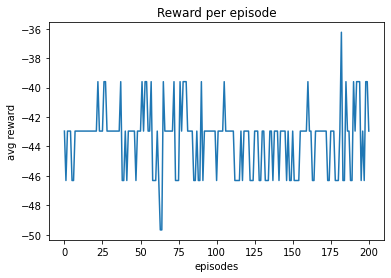

The episode is  202
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 24.78893434469657


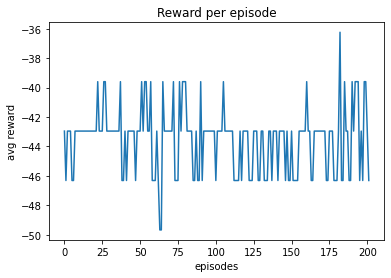

The episode is  203
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 25.031764947968032


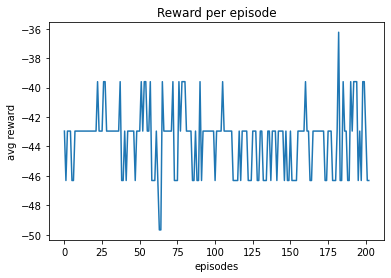

The episode is  204
Track generation: 1092..1369 -> 277-tiles trackTrack generation: 1052..1319 -> 267-tiles trackTrack generation: 1079..1353 -> 274-tiles trackTrack generation: 1332..1669 -> 337-tiles trackTrack generation: 1041..1311 -> 270-tiles trackTrack generation: 1284..1609 -> 325-tiles trackTrack generation: 1112..1394 -> 282-tiles trackTrack generation: 1061..1330 -> 269-tiles track
Track generation: 1025..1285 -> 260-tiles trackTrack generation: 1035..1298 -> 263-tiles track
Track generation: 1160..1454 -> 294-tiles track
Track generation: 1018..1277 -> 259-tiles track

Track generation: 1239..1553 -> 314-tiles trackTrack generation: 1115..1398 -> 283-tiles track




Track generation: 1036..1299 -> 263-tiles track


Track generation: 1109..1390 -> 281-tiles track


[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 24.359638646322917


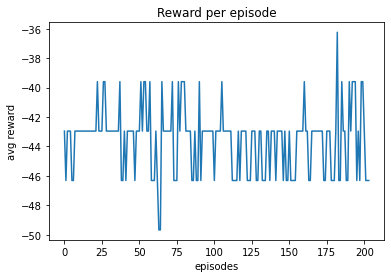

The episode is  205
The eval average rewards per episode is  -46.308724832215454
the value error is 24.359638646322917


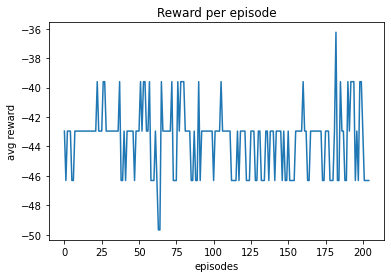

The episode is  206
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 22.595398800668324


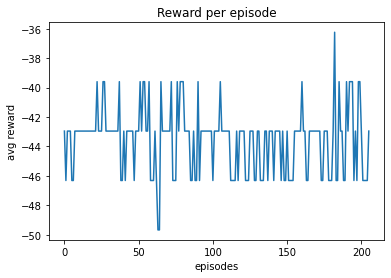

The episode is  207
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step33000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 21.361575908546747


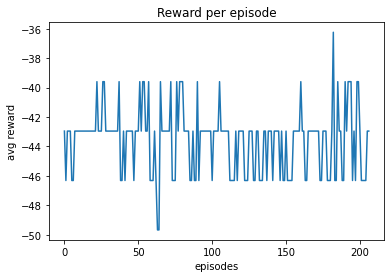

The episode is  208
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 23.91815603962345


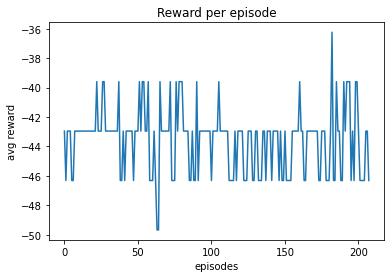

The episode is  209
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.245891524752963


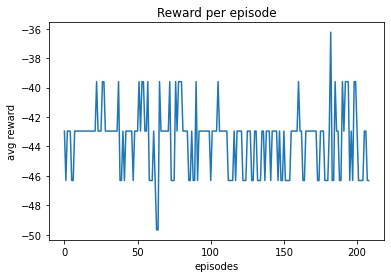

The episode is  210
The eval average rewards per episode is  -46.30872483221544
the value error is 24.245891524752963


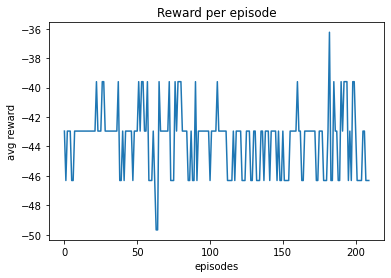

The episode is  211
Track generation: 1153..1446 -> 293-tiles track
Track generation: 1114..1404 -> 290-tiles trackTrack generation: 1319..1661 -> 342-tiles track

Track generation: 1132..1419 -> 287-tiles trackTrack generation: 1239..1553 -> 314-tiles trackTrack generation: 1126..1419 -> 293-tiles trackTrack generation: 1089..1365 -> 276-tiles trackTrack generation: 1204..1510 -> 306-tiles trackTrack generation: 1242..1557 -> 315-tiles track
Track generation: 1190..1492 -> 302-tiles track
Track generation: 1147..1438 -> 291-tiles trackTrack generation: 1119..1403 -> 284-tiles track





Track generation: 1186..1494 -> 308-tiles track

Track generation: 1211..1519 -> 308-tiles trackTrack generation: 1268..1589 -> 321-tiles track

Track generation: 1142..1432 -> 290-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624226
the value error is 19.926972420742796


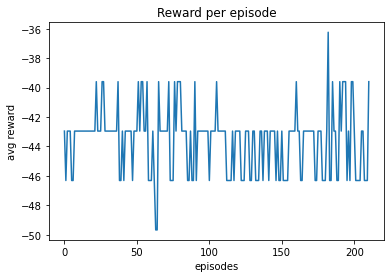

The episode is  212
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 21.598878086858303


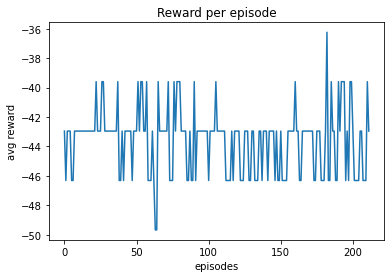

The episode is  213
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step34000.ckpt
The eval average rewards per episode is  -42.9530201342289
the value error is 22.025865654946884


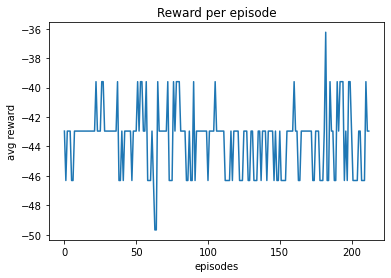

The episode is  214
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 21.759629492564063


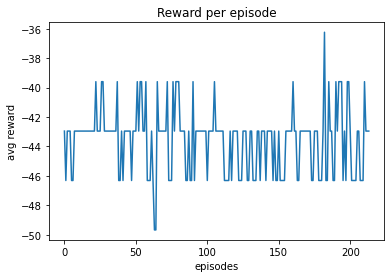

The episode is  215
The eval average rewards per episode is  -42.9530201342289
the value error is 21.759629492564063


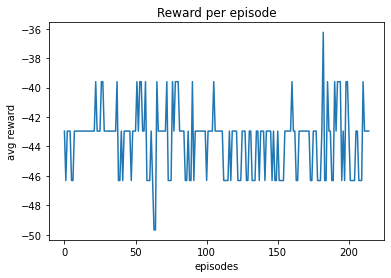

The episode is  216
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.608917287749122


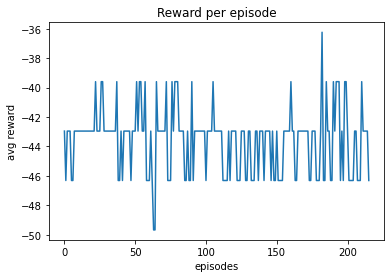

The episode is  217
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.51242782941124


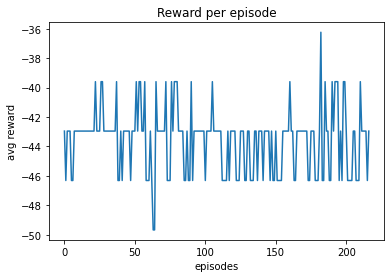

The episode is  218
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.21868602542117


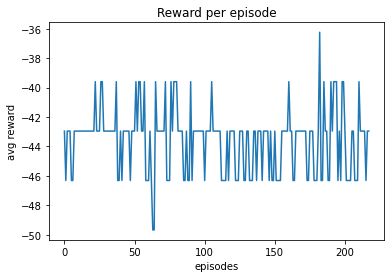

The episode is  219
Track generation: 1242..1556 -> 314-tiles trackTrack generation: 1124..1417 -> 293-tiles trackTrack generation: 1112..1394 -> 282-tiles trackTrack generation: 1025..1291 -> 266-tiles trackTrack generation: 1124..1409 -> 285-tiles trackTrack generation: 1045..1316 -> 271-tiles track
Track generation: 1186..1487 -> 301-tiles trackTrack generation: 1149..1440 -> 291-tiles track
Track generation: 1229..1540 -> 311-tiles track

Track generation: 1132..1415 -> 283-tiles trackTrack generation: 1112..1394 -> 282-tiles track

Track generation: 1295..1623 -> 328-tiles track
Track generation: 1236..1549 -> 313-tiles trackTrack generation: 1348..1689 -> 341-tiles track




Track generation: 1180..1479 -> 299-tiles track


Track generation: 1208..1524 -> 316-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step35000.ckpt
The eval average rewards per episode is  -42.95302013422888
the 

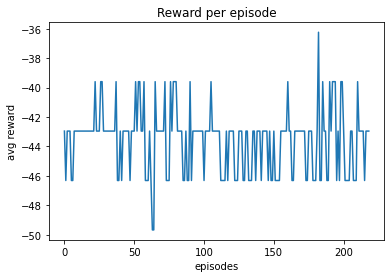

The episode is  220
The eval average rewards per episode is  -42.95302013422888
the value error is 21.828765271842062


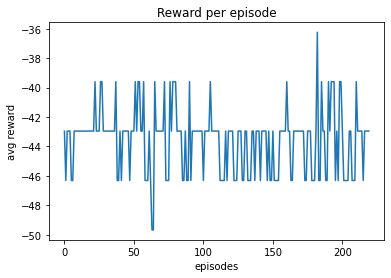

The episode is  221
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 24.950897146471803


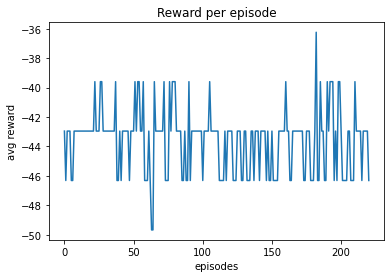

The episode is  222
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.30503544230924


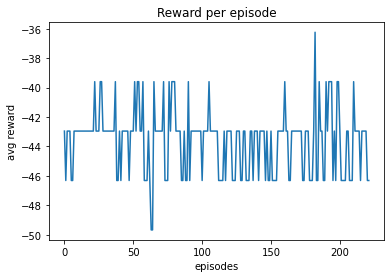

The episode is  223
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.731490741751273


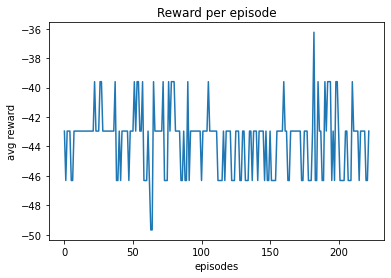

The episode is  224
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422879
the value error is 21.87595191280719


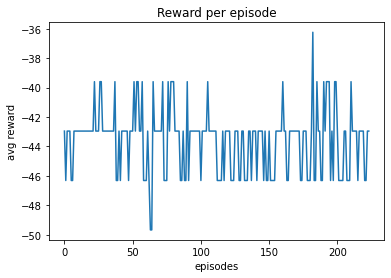

The episode is  225
The eval average rewards per episode is  -42.95302013422879
the value error is 21.87595191280719


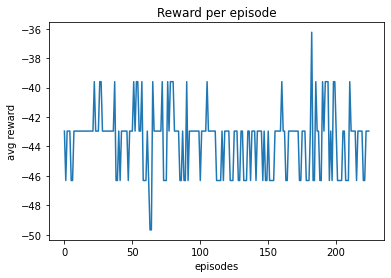

The episode is  226
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step36000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 22.30693195826189


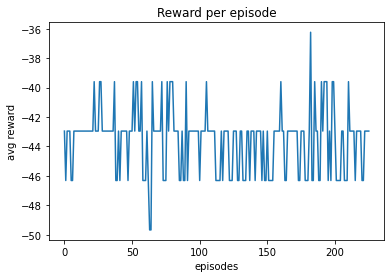

The episode is  227
Track generation: 1103..1383 -> 280-tiles track
Track generation: 1150..1441 -> 291-tiles track
Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1093..1373 -> 280-tiles track
Track generation: 1144..1434 -> 290-tiles trackTrack generation: 1261..1590 -> 329-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 912..1150 -> 238-tiles trackTrack generation: 1129..1425 -> 296-tiles track
Track generation: 1112..1394 -> 282-tiles trackTrack generation: 875..1105 -> 230-tiles track
Track generation: 1051..1318 -> 267-tiles trackTrack generation: 1200..1504 -> 304-tiles track





Track generation: 1219..1528 -> 309-tiles trackTrack generation: 1154..1447 -> 293-tiles track
Track generation: 1095..1373 -> 278-tiles track

Track generation: 1157..1454 -> 297-tiles trackTrack generation: 1083..1358 -> 275-tiles track



[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

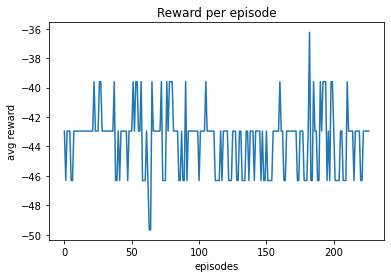

The episode is  228
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 22.540686886672198


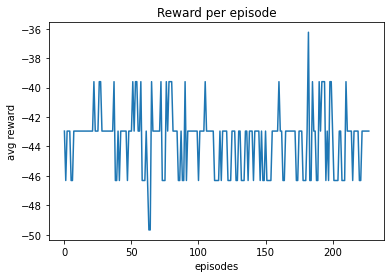

The episode is  229
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624223
the value error is 18.61370850775328


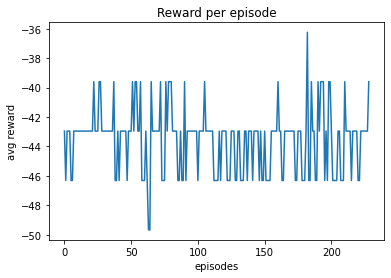

The episode is  230
The eval average rewards per episode is  -39.59731543624223
the value error is 18.61370850775328


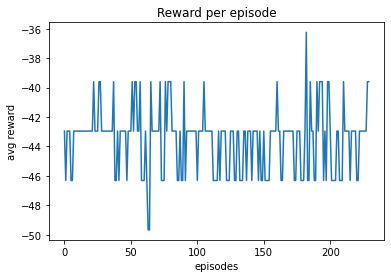

The episode is  231
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228794
the value error is 22.953689136780017


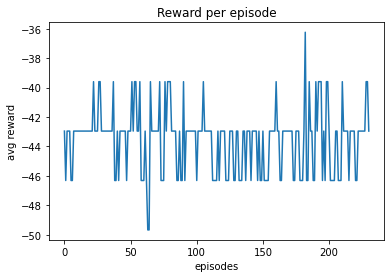

The episode is  232
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step37000.ckpt
The eval average rewards per episode is  -46.30872483221539
the value error is 24.973561127908994


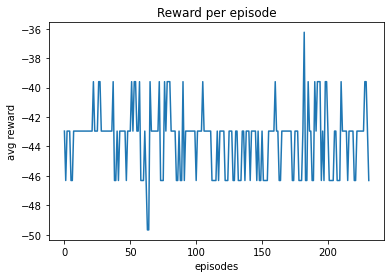

The episode is  233
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 24.213627933234253


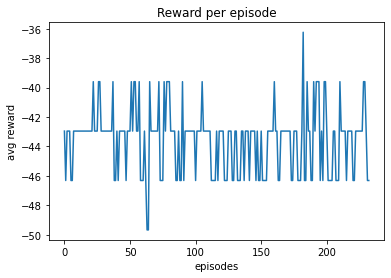

The episode is  234
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 22.157349722101856


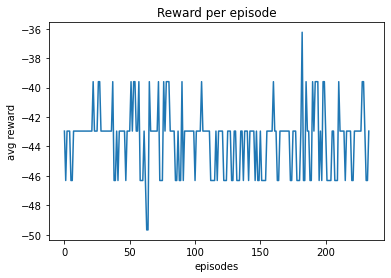

The episode is  235
Track generation: 1188..1489 -> 301-tiles track
Track generation: 1168..1472 -> 304-tiles track
Track generation: 1063..1333 -> 270-tiles trackTrack generation: 1104..1384 -> 280-tiles trackTrack generation: 1264..1584 -> 320-tiles trackTrack generation: 1136..1424 -> 288-tiles trackTrack generation: 1144..1442 -> 298-tiles trackTrack generation: 1316..1649 -> 333-tiles trackTrack generation: 1110..1393 -> 283-tiles trackTrack generation: 1256..1583 -> 327-tiles track
Track generation: 888..1117 -> 229-tiles trackTrack generation: 1088..1364 -> 276-tiles track

Track generation: 1069..1348 -> 279-tiles trackTrack generation: 1087..1363 -> 276-tiles track


Track generation: 1172..1469 -> 297-tiles track

Track generation: 1132..1419 -> 287-tiles track


retry to generate track (normal if there are not many of this messages)



Track generation: 1041..1309 -> 268-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 110

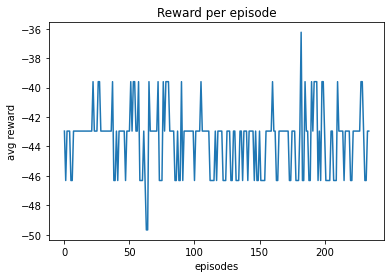

The episode is  236
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 24.390644676955013


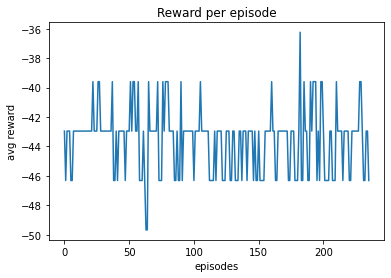

The episode is  237
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.59483744048812


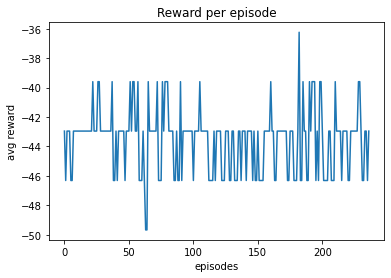

The episode is  238
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step38000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.068732713967574


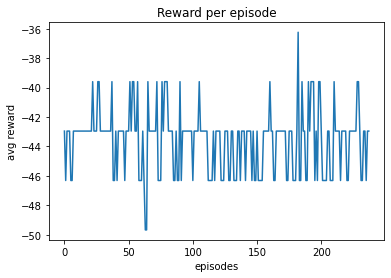

The episode is  239
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624227
the value error is 18.65954576283706


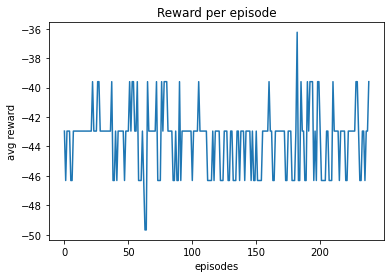

The episode is  240
The eval average rewards per episode is  -39.59731543624227
the value error is 18.65954576283706


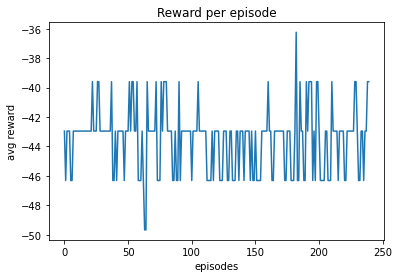

The episode is  241
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624227
the value error is 19.727630289390437


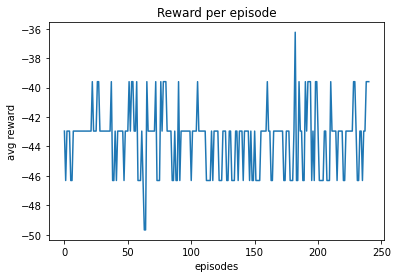

The episode is  242
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422895
the value error is 22.068498806552352


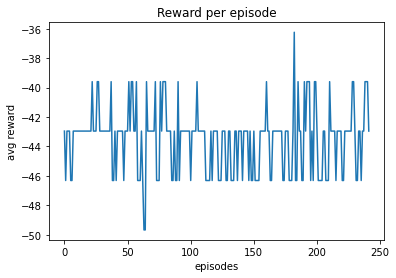

The episode is  243
Track generation: 1089..1368 -> 279-tiles trackTrack generation: 1239..1553 -> 314-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1094..1373 -> 279-tiles track
Track generation: 1100..1379 -> 279-tiles trackTrack generation: 945..1185 -> 240-tiles trackTrack generation: 1053..1320 -> 267-tiles track


Track generation: 1168..1464 -> 296-tiles track

Track generation: 1049..1317 -> 268-tiles trackTrack generation: 1268..1589 -> 321-tiles trackTrack generation: 1079..1353 -> 274-tiles track

Track generation: 1097..1379 -> 282-tiles trackTrack generation: 1134..1429 -> 295-tiles track
Track generation: 1102..1382 -> 280-tiles track

Track generation: 1220..1529 -> 309-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1107..1388 -> 281-tiles track

retry to generate track (normal if there are not many of this messages)


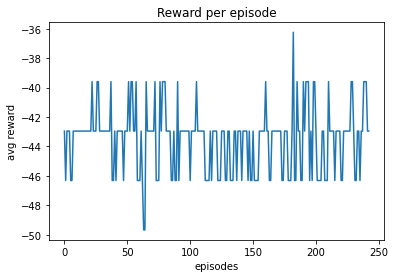

The episode is  244
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step39000.ckpt
The eval average rewards per episode is  -46.30872483221549
the value error is 23.8590844403105


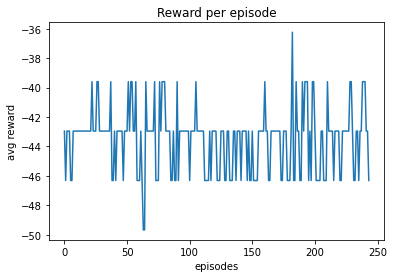

The episode is  245
The eval average rewards per episode is  -46.30872483221549
the value error is 23.8590844403105


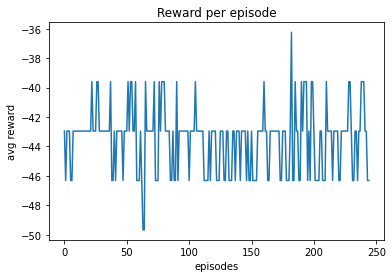

The episode is  246
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.86033051573807


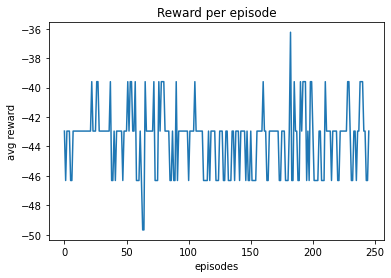

The episode is  247
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 23.846899269897953


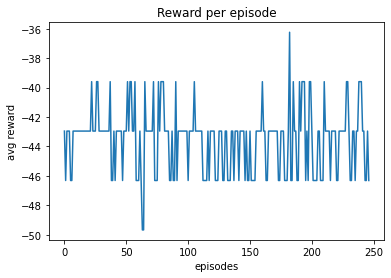

The episode is  248
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.507085704185258


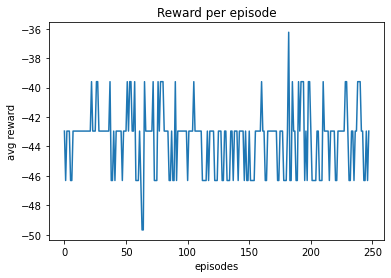

The episode is  249
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.17146249440305


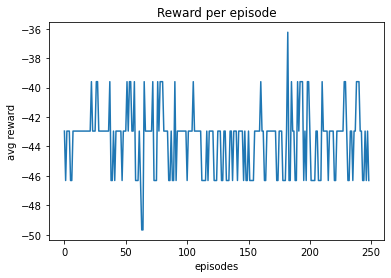

The episode is  250
Track generation: 1138..1429 -> 291-tiles trackTrack generation: 1062..1332 -> 270-tiles trackTrack generation: 1069..1347 -> 278-tiles trackTrack generation: 1084..1368 -> 284-tiles track
Track generation: 1243..1582 -> 339-tiles trackTrack generation: 1194..1501 -> 307-tiles track

Track generation: 1355..1698 -> 343-tiles trackTrack generation: 1011..1277 -> 266-tiles track
retry to generate track (normal if there are not many of this messages)Track generation: 1110..1390 -> 280-tiles track


Track generation: 1242..1556 -> 314-tiles track
Track generation: 1119..1403 -> 284-tiles trackretry to generate track (normal if there are not many of this messages)
Track generation: 1159..1453 -> 294-tiles track



Track generation: 947..1197 -> 250-tiles trackTrack generation: 1345..1685 -> 340-tiles trackTrack generation: 1176..1474 -> 298-tiles trackTrack generation: 1005..1263 -> 258-tiles trackTrack generation: 1051..1323 -> 272-tiles track




Track generation: 1216

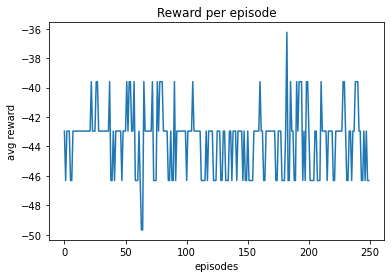

The episode is  251
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step40000.ckpt
The eval average rewards per episode is  -42.95302013422884
the value error is 21.53702810469212


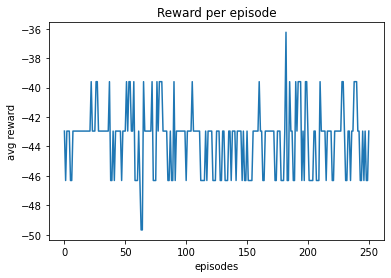

The episode is  252
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 21.915386153520622


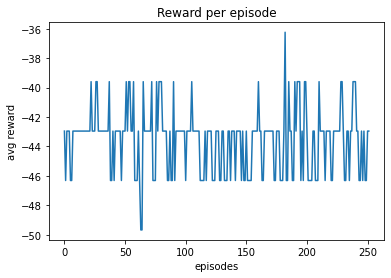

The episode is  253
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221551
the value error is 23.793040232437143


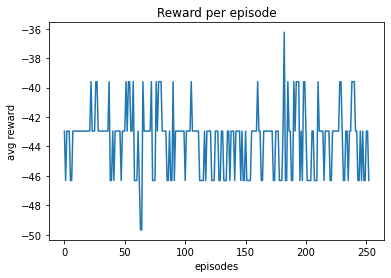

The episode is  254
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.5973154362422
the value error is 19.036270962210434


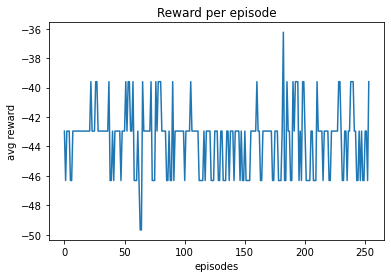

The episode is  255
The eval average rewards per episode is  -39.5973154362422
the value error is 19.036270962210434


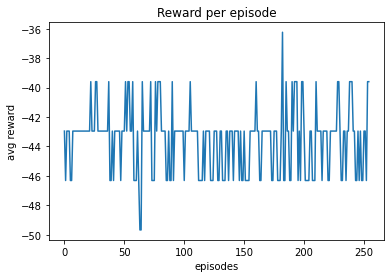

The episode is  256
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242255
the value error is 19.14775470021848


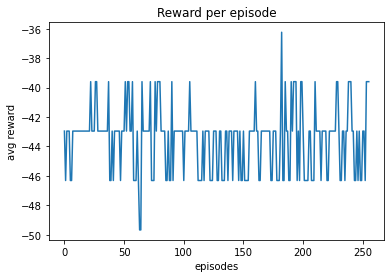

The episode is  257
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step41000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 22.152553623817802


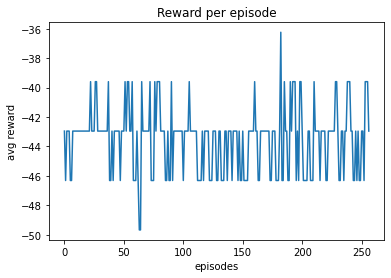

The episode is  258
Track generation: 1096..1374 -> 278-tiles trackTrack generation: 1185..1485 -> 300-tiles trackTrack generation: 1300..1629 -> 329-tiles trackTrack generation: 1109..1390 -> 281-tiles trackTrack generation: 1393..1745 -> 352-tiles trackTrack generation: 1079..1360 -> 281-tiles trackTrack generation: 1080..1360 -> 280-tiles track



Track generation: 1227..1538 -> 311-tiles trackTrack generation: 1148..1439 -> 291-tiles track



Track generation: 1104..1384 -> 280-tiles track
Track generation: 1166..1462 -> 296-tiles trackTrack generation: 1301..1630 -> 329-tiles trackTrack generation: 1151..1443 -> 292-tiles track



Track generation: 943..1191 -> 248-tiles trackTrack generation: 1132..1419 -> 287-tiles track

Track generation: 1139..1428 -> 289-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 23.909777731895364


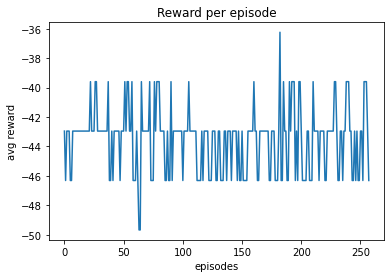

The episode is  259
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.95705337774705


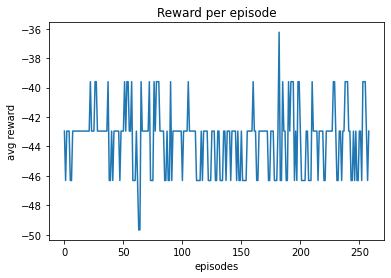

The episode is  260
The eval average rewards per episode is  -42.953020134228886
the value error is 21.95705337774705


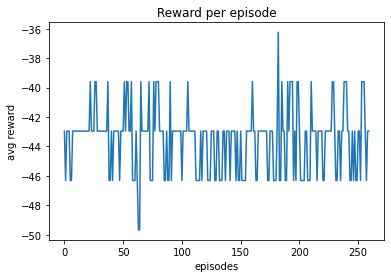

The episode is  261
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215425
the value error is 24.58499121405134


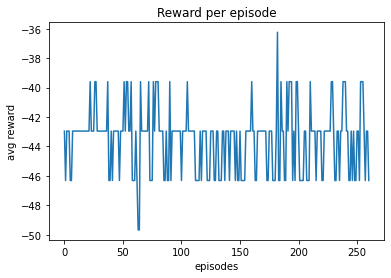

The episode is  262
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 24.23709811043376


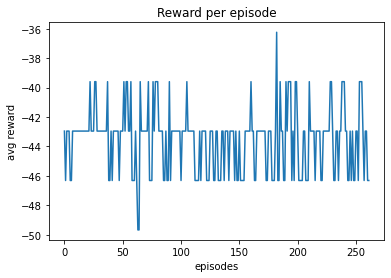

The episode is  263
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step42000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 21.878093480124182


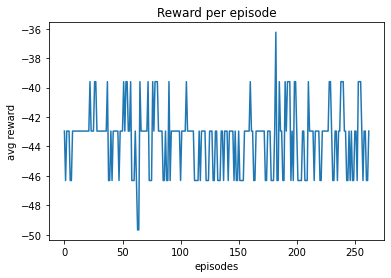

The episode is  264
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624225
the value error is 19.454088156095928


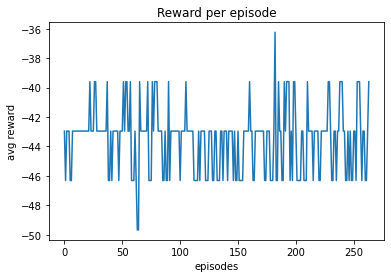

The episode is  265
The eval average rewards per episode is  -39.59731543624225
the value error is 19.454088156095928


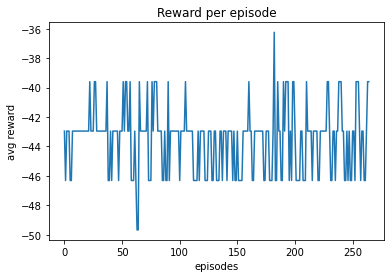

The episode is  266
Track generation: 1292..1619 -> 327-tiles track
Track generation: 1111..1393 -> 282-tiles track
Track generation: 1123..1408 -> 285-tiles track
Track generation: 1046..1318 -> 272-tiles trackTrack generation: 1077..1349 -> 272-tiles trackTrack generation: 1067..1338 -> 271-tiles trackTrack generation: 987..1244 -> 257-tiles track
Track generation: 1135..1423 -> 288-tiles trackTrack generation: 1232..1544 -> 312-tiles trackTrack generation: 1141..1430 -> 289-tiles trackTrack generation: 1240..1554 -> 314-tiles trackTrack generation: 1134..1428 -> 294-tiles track

Track generation: 1218..1526 -> 308-tiles track


Track generation: 1147..1446 -> 299-tiles track
Track generation: 1128..1414 -> 286-tiles track
Track generation: 1168..1464 -> 296-tiles track




[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624223
the value error is 19.125562258239565


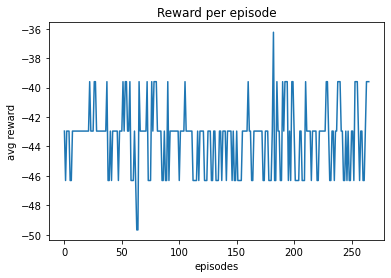

The episode is  267
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.231083196361684


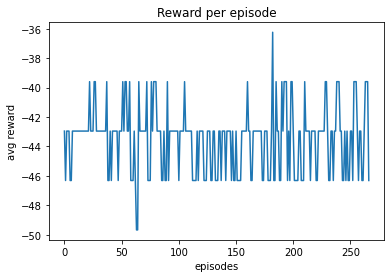

The episode is  268
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 22.2218015255409


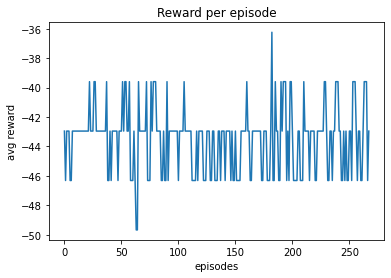

The episode is  269
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step43000.ckpt
The eval average rewards per episode is  -46.30872483221545
the value error is 24.652340055093966


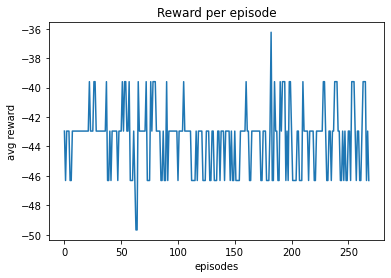

The episode is  270
The eval average rewards per episode is  -46.30872483221545
the value error is 24.652340055093966


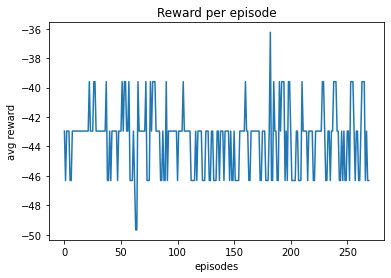

The episode is  271
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 24.249191125853322


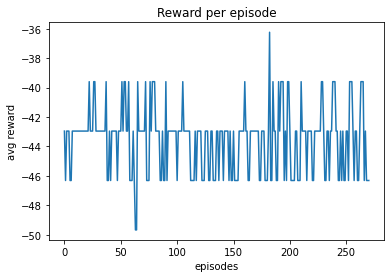

The episode is  272
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.179282907877557


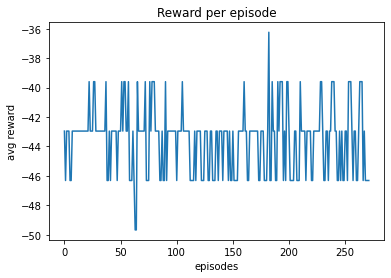

The episode is  273
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.74328958153043


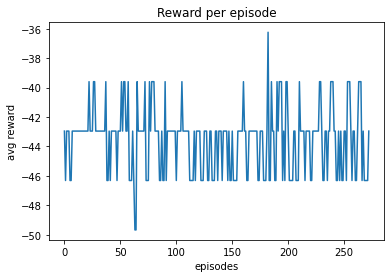

The episode is  274
Track generation: 1077..1350 -> 273-tiles track
Track generation: 1461..1829 -> 368-tiles trackTrack generation: 1056..1324 -> 268-tiles track
Track generation: 1155..1448 -> 293-tiles trackTrack generation: 1204..1508 -> 304-tiles trackTrack generation: 1072..1344 -> 272-tiles trackTrack generation: 1302..1631 -> 329-tiles trackTrack generation: 1113..1396 -> 283-tiles track
Track generation: 1187..1488 -> 301-tiles trackTrack generation: 1175..1473 -> 298-tiles trackTrack generation: 1052..1319 -> 267-tiles trackTrack generation: 1108..1389 -> 281-tiles trackTrack generation: 1097..1384 -> 287-tiles track
Track generation: 1016..1274 -> 258-tiles track





Track generation: 1082..1356 -> 274-tiles track




Track generation: 1081..1361 -> 280-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 20.87718805433704


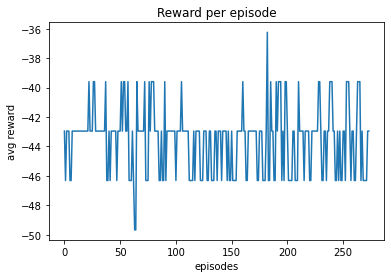

The episode is  275
The eval average rewards per episode is  -42.95302013422889
the value error is 20.87718805433704


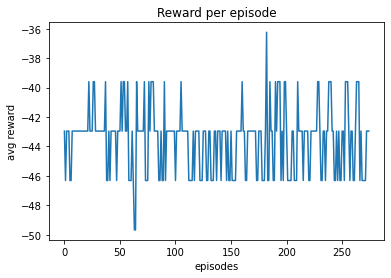

The episode is  276
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step44000.ckpt
The eval average rewards per episode is  -42.95302013422895
the value error is 22.594458914239908


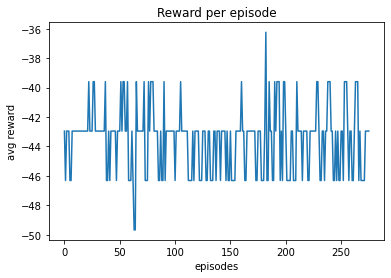

The episode is  277
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.344903350634834


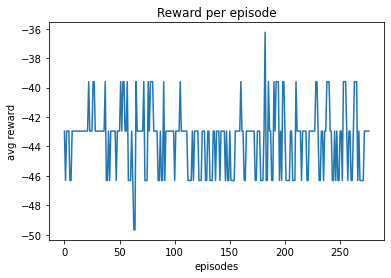

The episode is  278
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.374229424439534


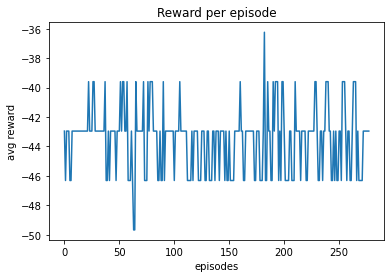

The episode is  279
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.629932539714712


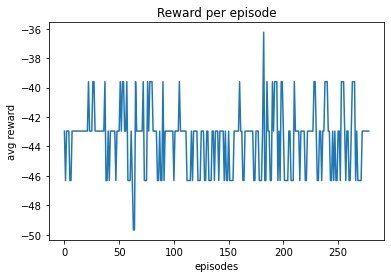

The episode is  280
The eval average rewards per episode is  -42.95302013422883
the value error is 22.629932539714712


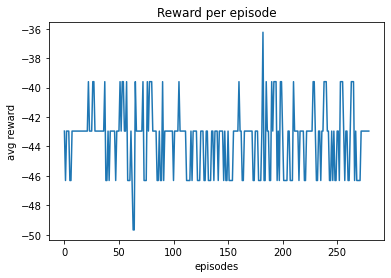

The episode is  281
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.42226668043129


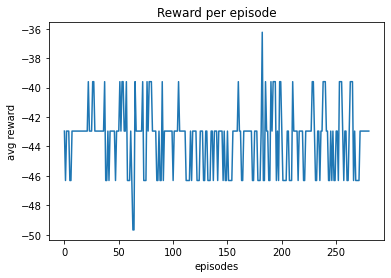

The episode is  282
Track generation: 1047..1322 -> 275-tiles trackTrack generation: 1132..1419 -> 287-tiles track
Track generation: 1151..1443 -> 292-tiles track

Track generation: 1271..1590 -> 319-tiles trackTrack generation: 1144..1434 -> 290-tiles trackTrack generation: 1224..1534 -> 310-tiles trackTrack generation: 1184..1484 -> 300-tiles track
Track generation: 1260..1579 -> 319-tiles trackTrack generation: 1171..1468 -> 297-tiles track

Track generation: 1185..1491 -> 306-tiles trackTrack generation: 1155..1448 -> 293-tiles trackTrack generation: 1129..1424 -> 295-tiles trackTrack generation: 1114..1399 -> 285-tiles track




Track generation: 1209..1515 -> 306-tiles track


retry to generate track (normal if there are not many of this messages)
Track generation: 1070..1342 -> 272-tiles trackTrack generation: 1175..1473 -> 298-tiles trackretry to generate track (normal if there are not many of this messages)
Track generation: 1072..1344 -> 272-tiles track


Track generation: 12

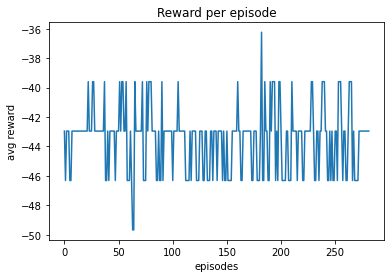

The episode is  283
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221551
the value error is 24.002892275064628


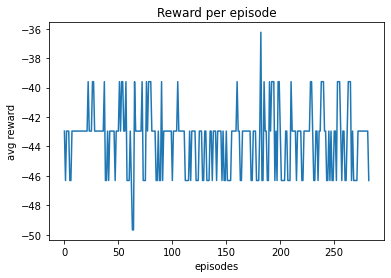

The episode is  284
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 23.74167402358124


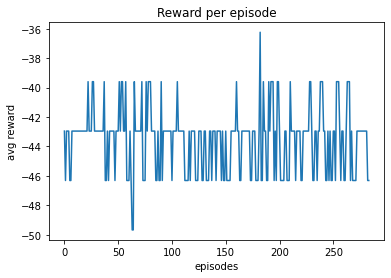

The episode is  285
The eval average rewards per episode is  -46.30872483221553
the value error is 23.74167402358124


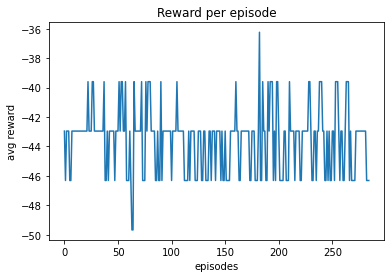

The episode is  286
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 23.689110538983357


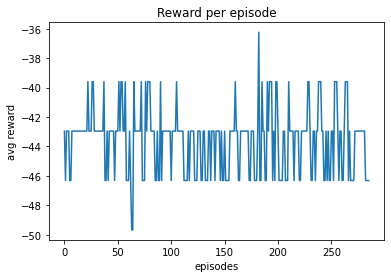

The episode is  287
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 24.726139265451426


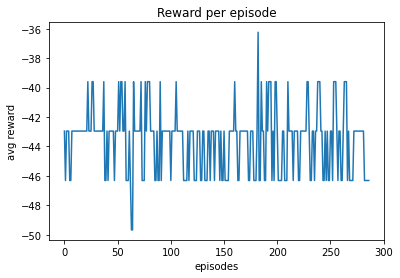

The episode is  288
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step46000.ckpt
The eval average rewards per episode is  -46.30872483221548
the value error is 24.875506063086757


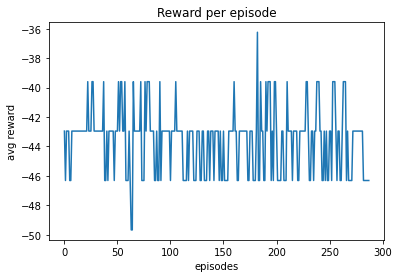

The episode is  289
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.121471570893824


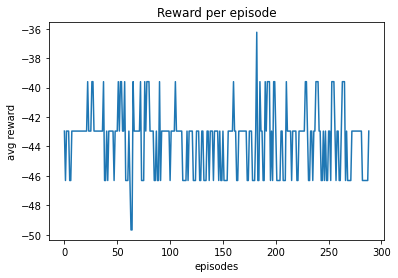

The episode is  290
Track generation: 1343..1683 -> 340-tiles trackTrack generation: 1244..1560 -> 316-tiles trackTrack generation: 1142..1429 -> 287-tiles trackTrack generation: 1128..1414 -> 286-tiles trackTrack generation: 1124..1409 -> 285-tiles trackTrack generation: 968..1214 -> 246-tiles trackTrack generation: 1193..1494 -> 301-tiles track

Track generation: 1080..1354 -> 274-tiles track


Track generation: 1078..1356 -> 278-tiles trackTrack generation: 1108..1389 -> 281-tiles track
Track generation: 1115..1398 -> 283-tiles trackTrack generation: 1228..1539 -> 311-tiles trackTrack generation: 1115..1398 -> 283-tiles track

Track generation: 1063..1333 -> 270-tiles track




Track generation: 1140..1429 -> 289-tiles track

Track generation: 1145..1436 -> 291-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.121471570893824


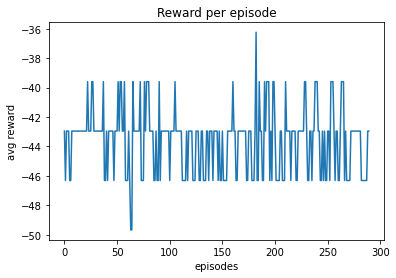

The episode is  291
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228936
the value error is 20.978929532891176


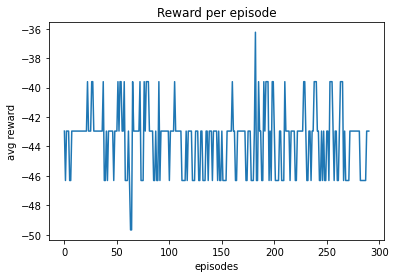

The episode is  292
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.41872629896635


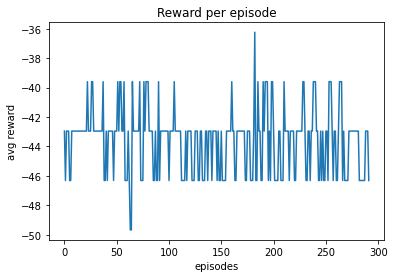

The episode is  293
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.960098539509033


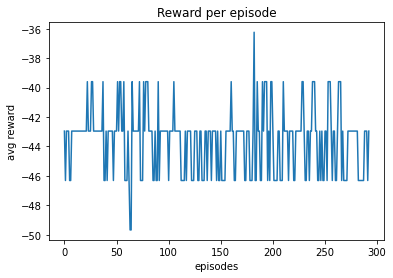

The episode is  294
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step47000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.33902161548984


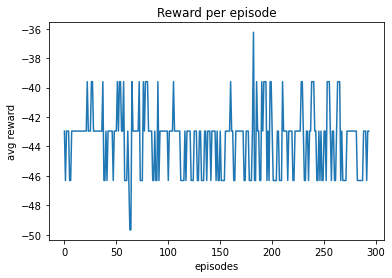

The episode is  295
The eval average rewards per episode is  -42.95302013422882
the value error is 21.33902161548984


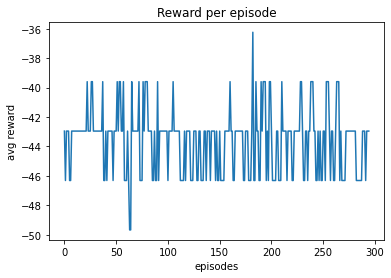

The episode is  296
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.836040987620216


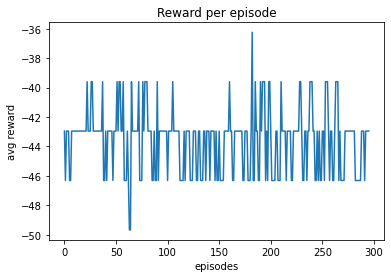

The episode is  297
Track generation: 1251..1568 -> 317-tiles track
Track generation: 1258..1577 -> 319-tiles trackTrack generation: 1151..1443 -> 292-tiles track
Track generation: 1220..1529 -> 309-tiles trackTrack generation: 1066..1339 -> 273-tiles trackTrack generation: 1160..1454 -> 294-tiles track
Track generation: 1091..1368 -> 277-tiles trackTrack generation: 1163..1458 -> 295-tiles track



Track generation: 1231..1549 -> 318-tiles track
retry to generate track (normal if there are not many of this messages)

Track generation: 1122..1407 -> 285-tiles trackTrack generation: 1095..1382 -> 287-tiles trackTrack generation: 964..1210 -> 246-tiles trackTrack generation: 1139..1437 -> 298-tiles trackTrack generation: 1157..1457 -> 300-tiles track
Track generation: 1251..1568 -> 317-tiles trackTrack generation: 1156..1449 -> 293-tiles track



Track generation: 1120..1404 -> 284-tiles track


[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average

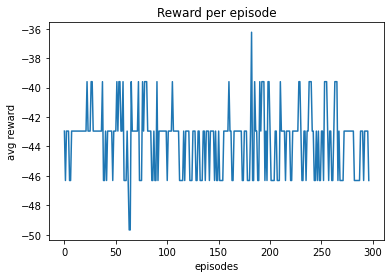

The episode is  298
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.527468271814787


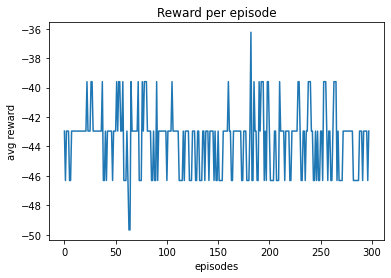

The episode is  299
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.22031094278543


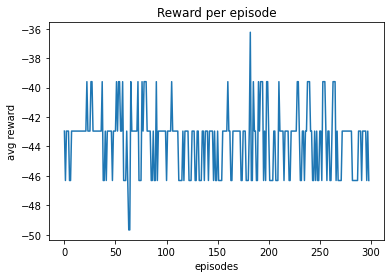

The episode is  300
The eval average rewards per episode is  -46.30872483221548
the value error is 24.22031094278543


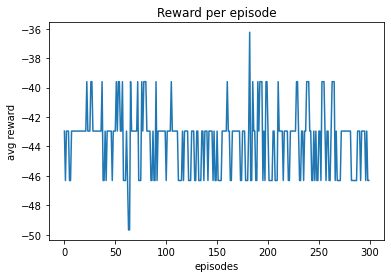

The episode is  301
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step48000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.829883133710815


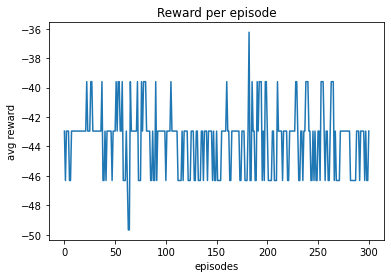

The episode is  302
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 23.14443753400423


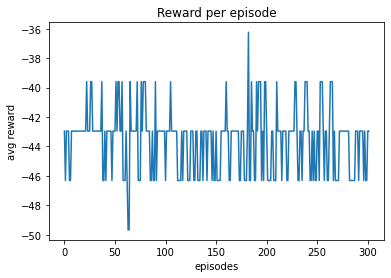

The episode is  303
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.807901880215958


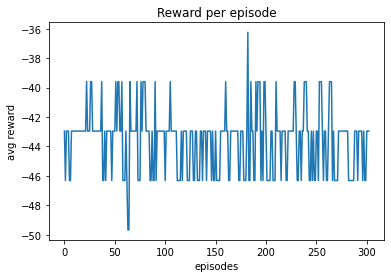

The episode is  304
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 22.169755318397133


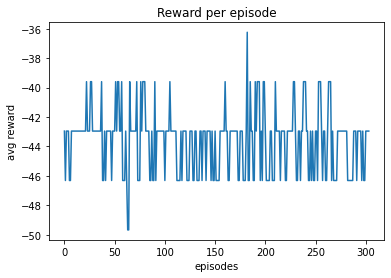

The episode is  305
Track generation: 1192..1494 -> 302-tiles track
Track generation: 1175..1473 -> 298-tiles trackTrack generation: 1168..1464 -> 296-tiles trackTrack generation: 1279..1603 -> 324-tiles trackTrack generation: 1101..1381 -> 280-tiles trackTrack generation: 1135..1423 -> 288-tiles trackTrack generation: 1095..1373 -> 278-tiles trackTrack generation: 1215..1523 -> 308-tiles track
Track generation: 1155..1448 -> 293-tiles track

Track generation: 1219..1528 -> 309-tiles trackTrack generation: 1144..1434 -> 290-tiles trackTrack generation: 1097..1375 -> 278-tiles track

Track generation: 1086..1364 -> 278-tiles track



Track generation: 1261..1580 -> 319-tiles track

Track generation: 1030..1300 -> 270-tiles trackTrack generation: 1172..1469 -> 297-tiles track
retry to generate track (normal if there are not many of this messages)


Track generation: 1081..1355 -> 274-tiles track

The eval average rewards per episode is  -42.95302013422891
the value error is 22.1697553183

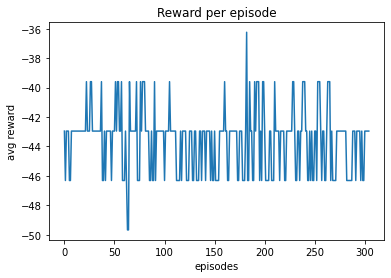

The episode is  306
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 22.373922630100907


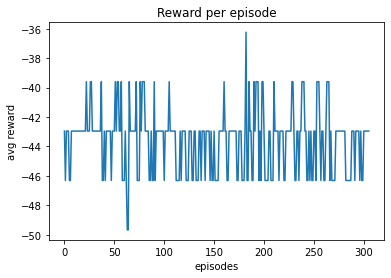

The episode is  307
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step49000.ckpt
The eval average rewards per episode is  -42.953020134228844
the value error is 21.650827494794534


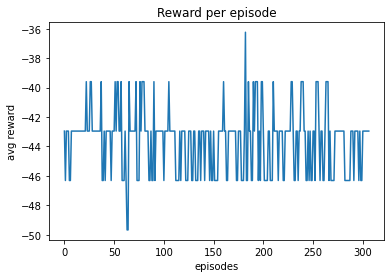

The episode is  308
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242226
the value error is 19.77640815451372


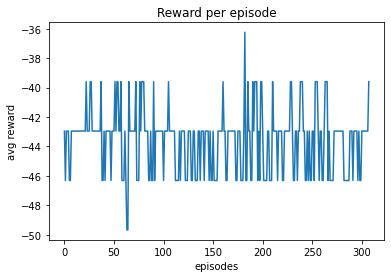

The episode is  309
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 25.26928868246553


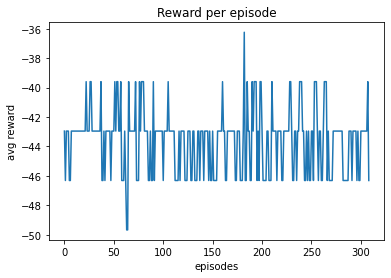

The episode is  310
The eval average rewards per episode is  -46.30872483221547
the value error is 25.26928868246553


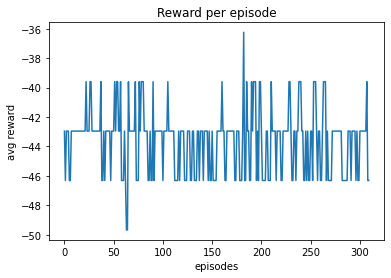

The episode is  311
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422878
the value error is 21.788942001637235


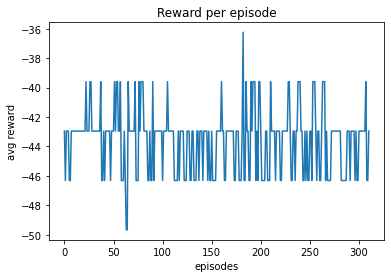

The episode is  312
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.930824407066343


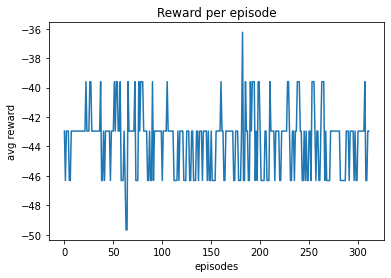

The episode is  313
Track generation: 1185..1487 -> 302-tiles trackTrack generation: 1043..1308 -> 265-tiles trackTrack generation: 1280..1604 -> 324-tiles trackTrack generation: 1097..1375 -> 278-tiles track

Track generation: 1203..1507 -> 304-tiles track
Track generation: 1073..1345 -> 272-tiles track
Track generation: 1068..1346 -> 278-tiles trackTrack generation: 1139..1428 -> 289-tiles track
retry to generate track (normal if there are not many of this messages)

Track generation: 1283..1608 -> 325-tiles track

Track generation: 1079..1353 -> 274-tiles trackTrack generation: 997..1254 -> 257-tiles trackTrack generation: 1171..1468 -> 297-tiles trackTrack generation: 1119..1403 -> 284-tiles trackTrack generation: 1070..1341 -> 271-tiles track

Track generation: 1163..1458 -> 295-tiles track


retry to generate track (normal if there are not many of this messages)
Track generation: 1389..1741 -> 352-tiles track

Track generation: 1032..1300 -> 268-tiles track
Track generation: 1216

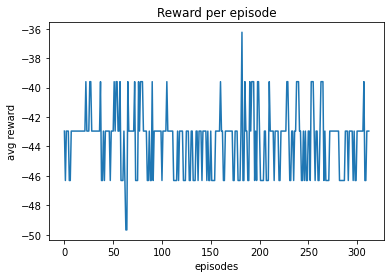

The episode is  314
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 23.182518060930278


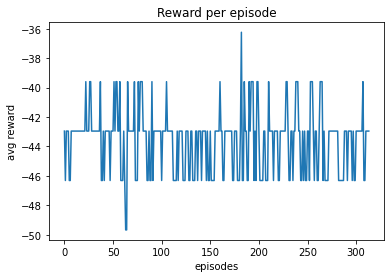

The episode is  315
The eval average rewards per episode is  -42.95302013422882
the value error is 23.182518060930278


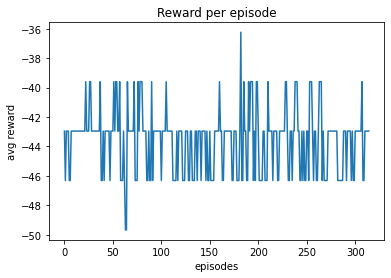

The episode is  316
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.84873315063709


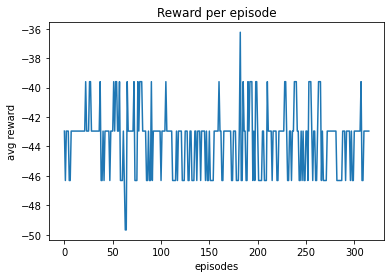

The episode is  317
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.64213183496374


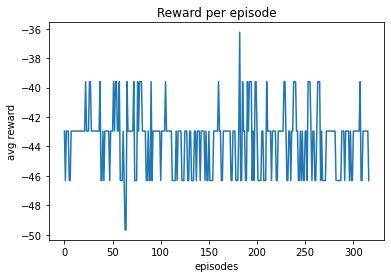

The episode is  318
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.040111053568037


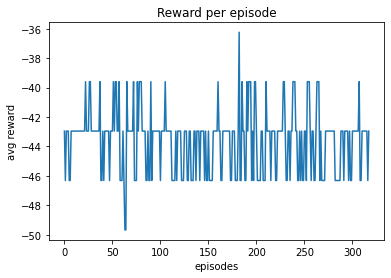

The episode is  319
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step51000.ckpt
The eval average rewards per episode is  -46.30872483221545
the value error is 24.886437135683728


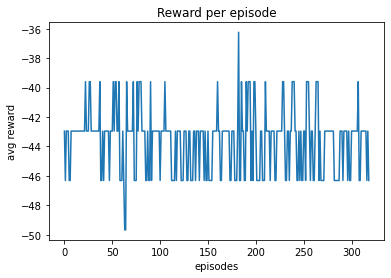

The episode is  320
The eval average rewards per episode is  -46.30872483221545
the value error is 24.886437135683728


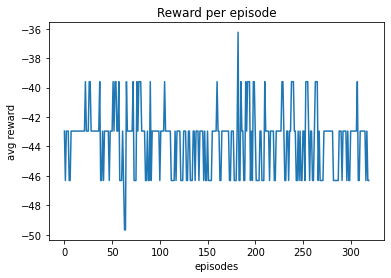

The episode is  321
Track generation: 1208..1514 -> 306-tiles trackTrack generation: 1123..1408 -> 285-tiles trackTrack generation: 1260..1579 -> 319-tiles trackTrack generation: 1212..1519 -> 307-tiles trackTrack generation: 1169..1472 -> 303-tiles trackTrack generation: 1011..1272 -> 261-tiles trackTrack generation: 1053..1320 -> 267-tiles trackTrack generation: 1293..1620 -> 327-tiles track



Track generation: 1228..1546 -> 318-tiles track



Track generation: 1224..1534 -> 310-tiles trackTrack generation: 1044..1309 -> 265-tiles trackTrack generation: 1031..1296 -> 265-tiles track

Track generation: 981..1240 -> 259-tiles track
Track generation: 1287..1613 -> 326-tiles trackTrack generation: 1127..1419 -> 292-tiles track



Track generation: 1335..1670 -> 335-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342288
the value error is 21.992494846524224


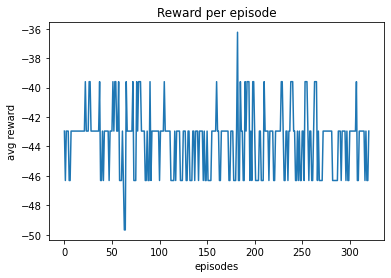

The episode is  322
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 22.31153441697991


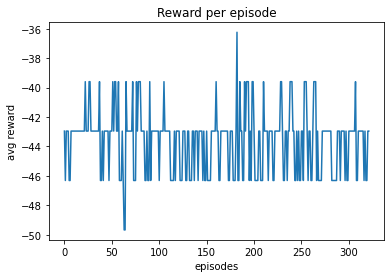

The episode is  323
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228964
the value error is 22.660639111048624


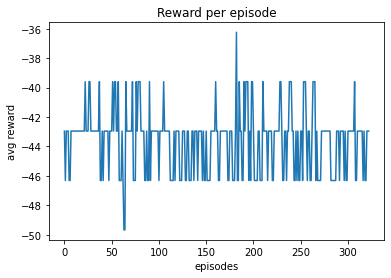

The episode is  324
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422889
the value error is 22.441413632772743


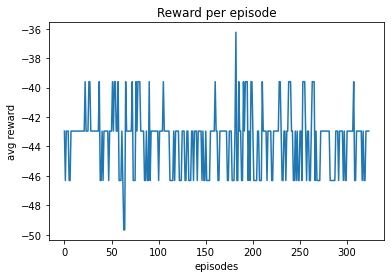

The episode is  325
The eval average rewards per episode is  -42.95302013422889
the value error is 22.441413632772743


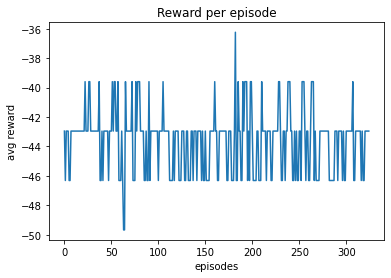

The episode is  326
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step52000.ckpt
The eval average rewards per episode is  -42.95302013422888
the value error is 20.76731863769619


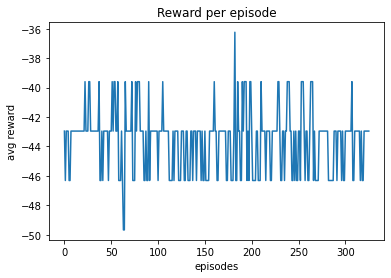

The episode is  327
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 22.452165703363608


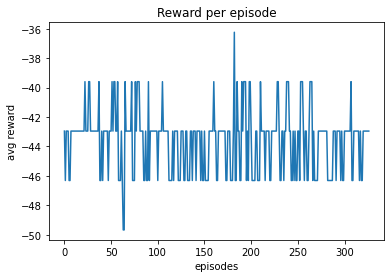

The episode is  328
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 24.398182904416576


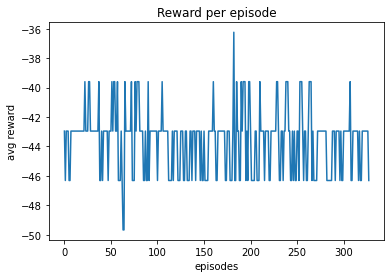

The episode is  329
Track generation: 1087..1362 -> 275-tiles track
Track generation: 1142..1431 -> 289-tiles track
Track generation: 1112..1394 -> 282-tiles track
Track generation: 1123..1408 -> 285-tiles trackTrack generation: 1056..1329 -> 273-tiles trackTrack generation: 1002..1266 -> 264-tiles track
Track generation: 1058..1331 -> 273-tiles trackTrack generation: 1115..1400 -> 285-tiles track

Track generation: 1171..1468 -> 297-tiles track
Track generation: 1142..1431 -> 289-tiles track
Track generation: 1236..1549 -> 313-tiles trackTrack generation: 1181..1480 -> 299-tiles trackTrack generation: 1271..1593 -> 322-tiles track
Track generation: 1167..1463 -> 296-tiles trackretry to generate track (normal if there are not many of this messages)




Track generation: 1292..1626 -> 334-tiles trackTrack generation: 1212..1522 -> 310-tiles trackTrack generation: 1068..1339 -> 271-tiles track



[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval averag

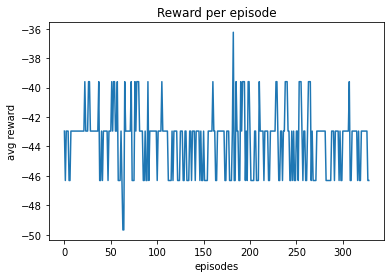

The episode is  330
The eval average rewards per episode is  -46.30872483221547
the value error is 24.66865758481913


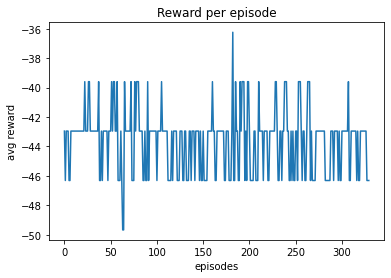

The episode is  331
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 24.944195124368225


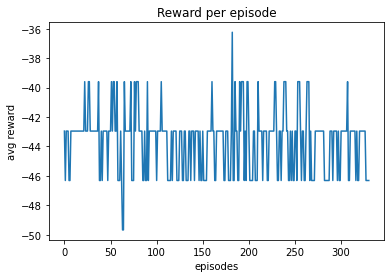

The episode is  332
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step53000.ckpt
The eval average rewards per episode is  -42.95302013422891
the value error is 21.219977582001356


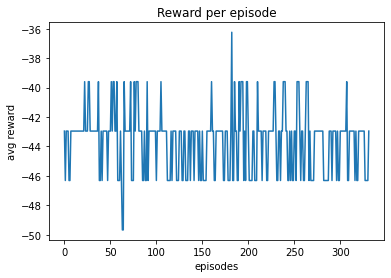

The episode is  333
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.293392512375185


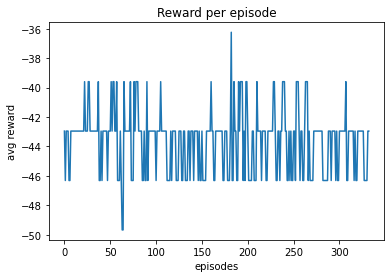

The episode is  334
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.687801801327375


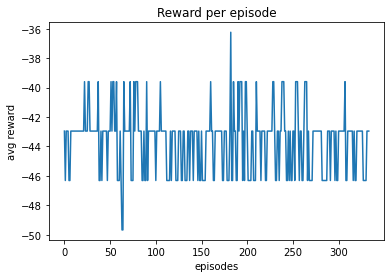

The episode is  335
The eval average rewards per episode is  -42.95302013422881
the value error is 21.687801801327375


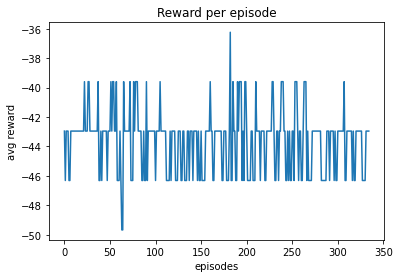

The episode is  336
Track generation: 1078..1354 -> 276-tiles track
Track generation: 1184..1484 -> 300-tiles track
Track generation: 1113..1403 -> 290-tiles trackTrack generation: 1168..1464 -> 296-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1109..1390 -> 281-tiles trackTrack generation: 1136..1426 -> 290-tiles track



Track generation: 1046..1319 -> 273-tiles track
Track generation: 1117..1400 -> 283-tiles trackTrack generation: 1356..1699 -> 343-tiles trackTrack generation: 1118..1400 -> 282-tiles trackTrack generation: 1283..1608 -> 325-tiles trackTrack generation: 1072..1344 -> 272-tiles trackTrack generation: 1077..1350 -> 273-tiles track
Track generation: 1167..1463 -> 296-tiles track
retry to generate track (normal if there are not many of this messages)Track generation: 1009..1265 -> 256-tiles track




Track generation: 1159..1456 -> 297-tiles trackTrack generation: 1125..1419 -> 294-tiles track



retry to generate tra

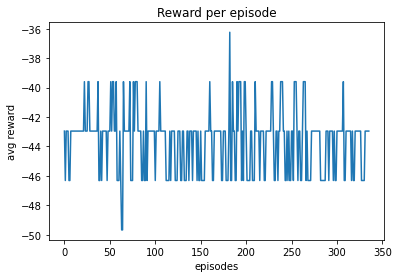

The episode is  337
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 22.163653627700498


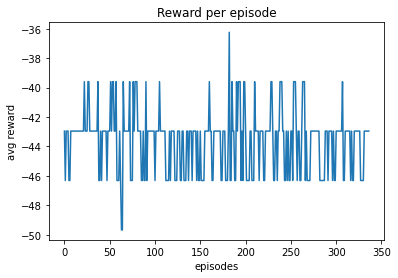

The episode is  338
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step54000.ckpt
The eval average rewards per episode is  -42.95302013422886
the value error is 21.897795689996148


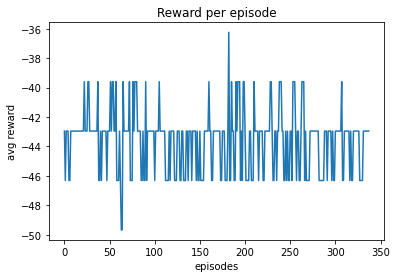

The episode is  339
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624224
the value error is 18.29115227988651


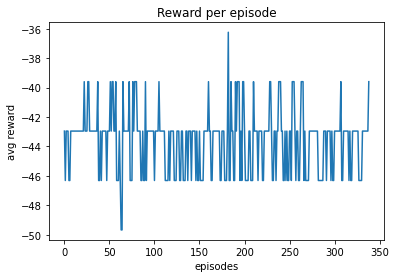

The episode is  340
The eval average rewards per episode is  -39.59731543624224
the value error is 18.29115227988651


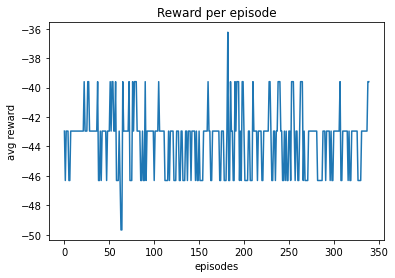

The episode is  341
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.40807041373185


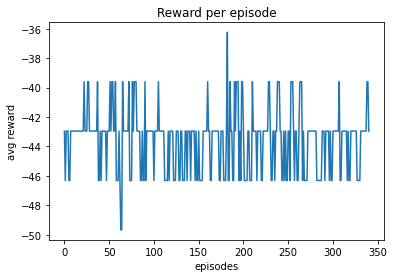

The episode is  342
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 22.044876327110064


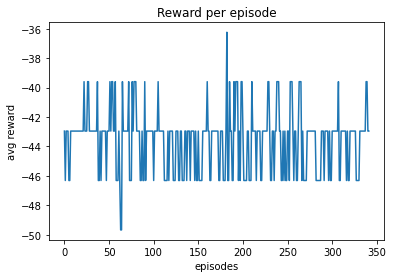

The episode is  343
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228915
the value error is 21.606005060102554


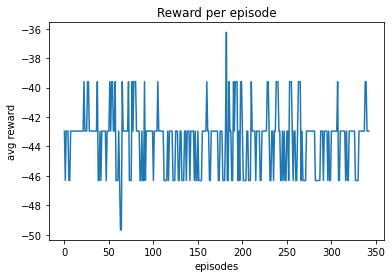

The episode is  344
Track generation: 1066..1342 -> 276-tiles track
Track generation: 1047..1313 -> 266-tiles trackTrack generation: 1146..1436 -> 290-tiles trackTrack generation: 1177..1484 -> 307-tiles trackTrack generation: 1229..1540 -> 311-tiles track

Track generation: 1028..1289 -> 261-tiles trackTrack generation: 1245..1560 -> 315-tiles track

Track generation: 1386..1737 -> 351-tiles trackTrack generation: 1291..1618 -> 327-tiles track
Track generation: 1076..1349 -> 273-tiles track

Track generation: 1165..1460 -> 295-tiles trackTrack generation: 1133..1420 -> 287-tiles trackTrack generation: 1075..1354 -> 279-tiles track




Track generation: 1085..1364 -> 279-tiles trackTrack generation: 1147..1438 -> 291-tiles track

retry to generate track (normal if there are not many of this messages)Track generation: 1352..1694 -> 342-tiles track
Track generation: 1067..1338 -> 271-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model ch

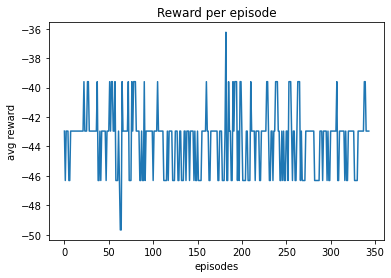

The episode is  345
The eval average rewards per episode is  -42.95302013422886
the value error is 20.971212173643668


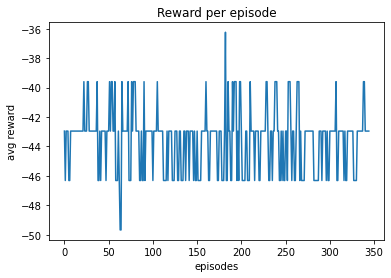

The episode is  346
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215425
the value error is 24.662171154828187


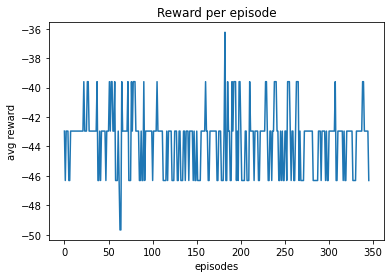

The episode is  347
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 25.042725600662436


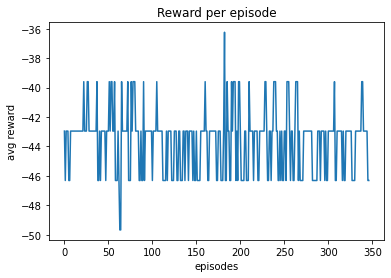

The episode is  348
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 24.23107531437155


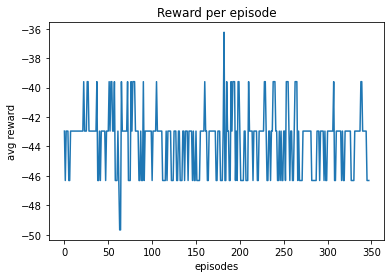

The episode is  349
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.723145486982578


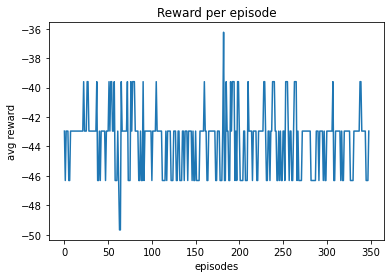

The episode is  350
The eval average rewards per episode is  -42.95302013422886
the value error is 21.723145486982578


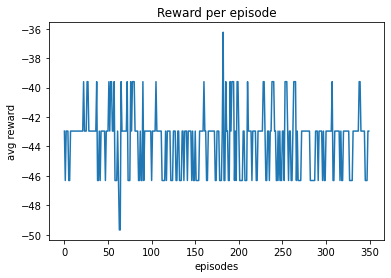

The episode is  351
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step56000.ckpt
The eval average rewards per episode is  -39.59731543624223
the value error is 19.105856469208444


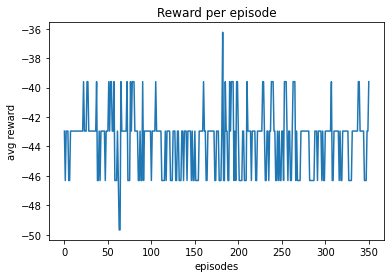

The episode is  352
Track generation: 1092..1369 -> 277-tiles track
Track generation: 1135..1423 -> 288-tiles track
Track generation: 1196..1499 -> 303-tiles trackTrack generation: 1230..1542 -> 312-tiles trackTrack generation: 1144..1434 -> 290-tiles track
Track generation: 1019..1285 -> 266-tiles trackTrack generation: 1136..1424 -> 288-tiles track
Track generation: 1101..1380 -> 279-tiles track
Track generation: 1205..1511 -> 306-tiles trackTrack generation: 1020..1279 -> 259-tiles track
Track generation: 1200..1504 -> 304-tiles track

Track generation: 1165..1460 -> 295-tiles trackTrack generation: 1197..1501 -> 304-tiles track


Track generation: 1167..1463 -> 296-tiles trackTrack generation: 1225..1535 -> 310-tiles track



Track generation: 1149..1440 -> 291-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422888
the value error is 21.33586192484553


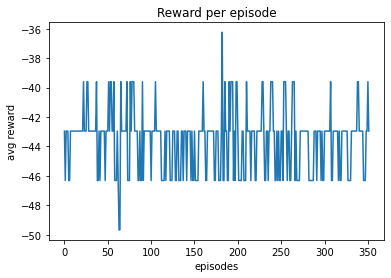

The episode is  353
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 21.47704656003917


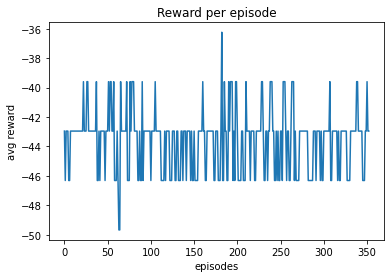

The episode is  354
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.240795055858918


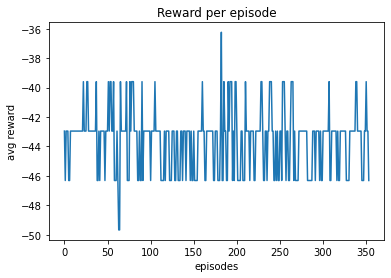

The episode is  355
The eval average rewards per episode is  -46.30872483221548
the value error is 24.240795055858918


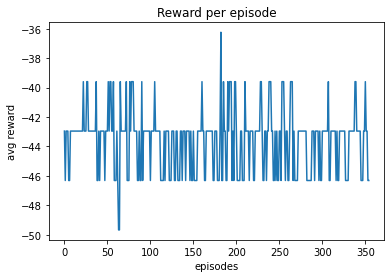

The episode is  356
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.485534466265072


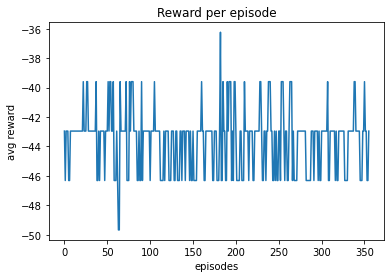

The episode is  357
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step57000.ckpt
The eval average rewards per episode is  -42.95302013422889
the value error is 21.87229816190115


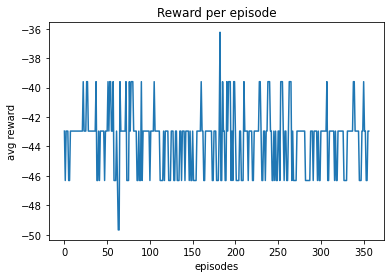

The episode is  358
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215454
the value error is 25.065956537069244


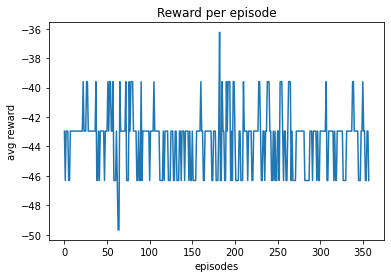

The episode is  359
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624227
the value error is 19.33075741777131


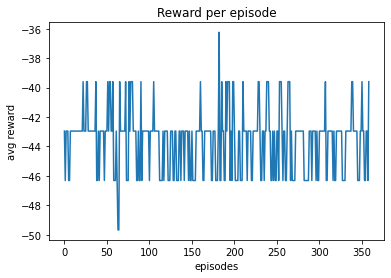

The episode is  360
Track generation: 1061..1330 -> 269-tiles track
Track generation: 1088..1364 -> 276-tiles trackTrack generation: 1052..1322 -> 270-tiles trackTrack generation: 930..1170 -> 240-tiles trackTrack generation: 1032..1294 -> 262-tiles trackTrack generation: 983..1238 -> 255-tiles track


Track generation: 1143..1433 -> 290-tiles trackTrack generation: 1090..1367 -> 277-tiles trackTrack generation: 972..1221 -> 249-tiles trackTrack generation: 1215..1523 -> 308-tiles trackretry to generate track (normal if there are not many of this messages)
Track generation: 1149..1440 -> 291-tiles trackTrack generation: 1129..1416 -> 287-tiles trackTrack generation: 1247..1563 -> 316-tiles track


Track generation: 1105..1394 -> 289-tiles track
Track generation: 1093..1377 -> 284-tiles track


retry to generate track (normal if there are not many of this messages)

Track generation: 1199..1503 -> 304-tiles trackretry to generate track (normal if there are not many of this messages)





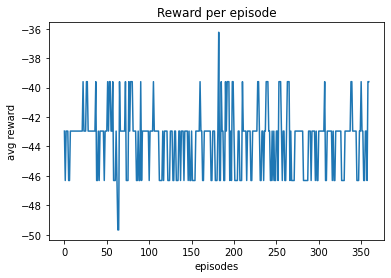

The episode is  361
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.5493970978616


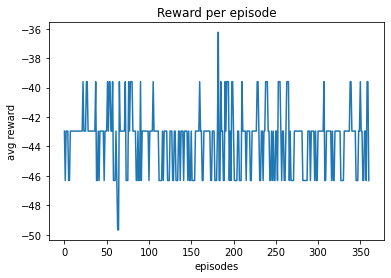

The episode is  362
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 21.946102173450353


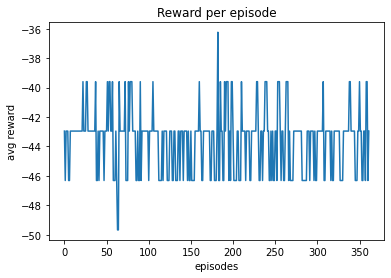

The episode is  363
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step58000.ckpt
The eval average rewards per episode is  -46.30872483221552
the value error is 24.38716770611174


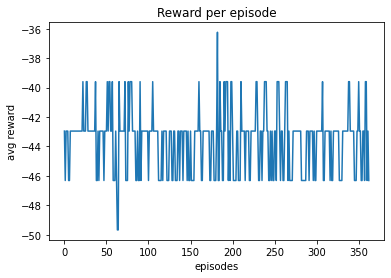

The episode is  364
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.930661696103183


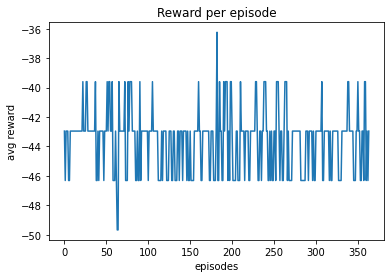

The episode is  365
The eval average rewards per episode is  -42.95302013422883
the value error is 21.930661696103183


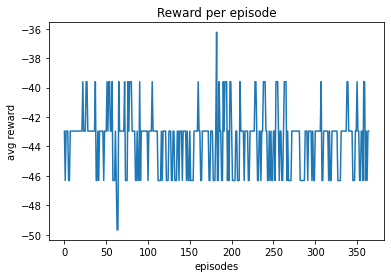

The episode is  366
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.664692287037276


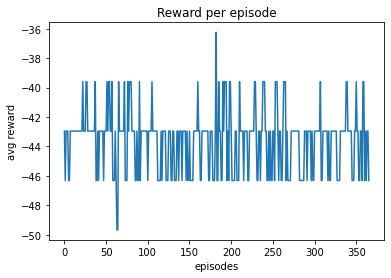

The episode is  367
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.186424645958017


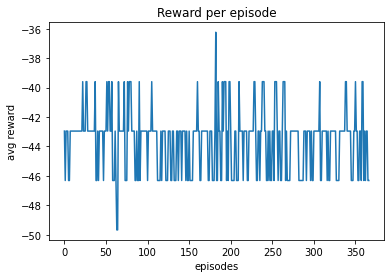

The episode is  368
Track generation: 1265..1585 -> 320-tiles trackTrack generation: 1140..1429 -> 289-tiles track
Track generation: 1200..1504 -> 304-tiles track

Track generation: 1110..1395 -> 285-tiles trackTrack generation: 1045..1310 -> 265-tiles track
Track generation: 1269..1591 -> 322-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1140..1429 -> 289-tiles trackTrack generation: 1059..1328 -> 269-tiles trackTrack generation: 1352..1694 -> 342-tiles trackTrack generation: 1195..1498 -> 303-tiles trackTrack generation: 1224..1534 -> 310-tiles trackTrack generation: 1136..1429 -> 293-tiles trackTrack generation: 1213..1520 -> 307-tiles track


Track generation: 1286..1611 -> 325-tiles trackTrack generation: 1055..1323 -> 268-tiles trackTrack generation: 916..1151 -> 235-tiles track








retry to generate track (normal if there are not many of this messages)Track generation: 1300..1629 -> 329-tiles track


Track generation: 100

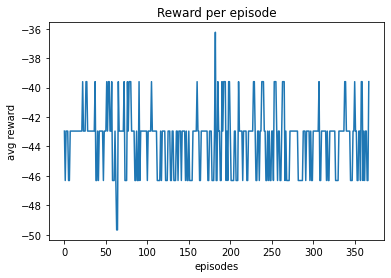

The episode is  369
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step59000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 20.81698361268626


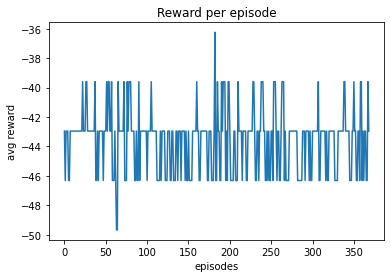

The episode is  370
The eval average rewards per episode is  -42.95302013422887
the value error is 20.81698361268626


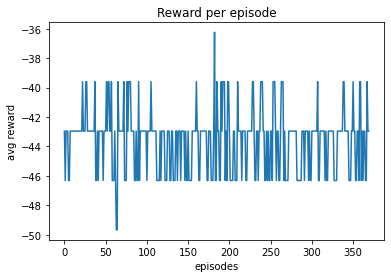

The episode is  371
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.051394093549945


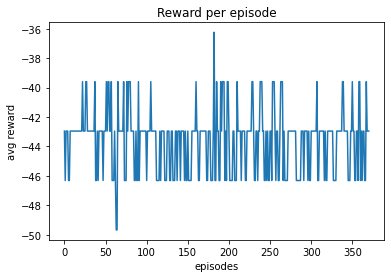

The episode is  372
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422879
the value error is 22.30153553910555


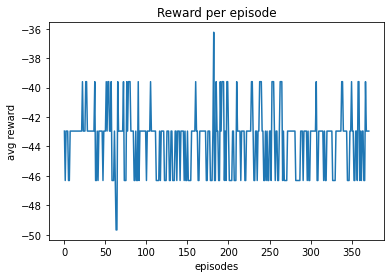

The episode is  373
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.9143686173419


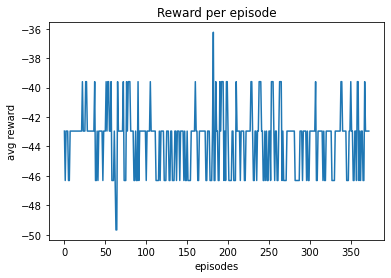

The episode is  374
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422879
the value error is 22.084805741435478


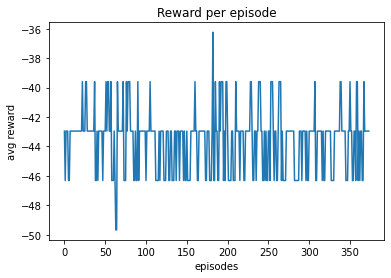

The episode is  375
Track generation: 1120..1411 -> 291-tiles track
Track generation: 1224..1534 -> 310-tiles trackTrack generation: 1202..1511 -> 309-tiles track

Track generation: 1108..1389 -> 281-tiles trackTrack generation: 1128..1414 -> 286-tiles trackTrack generation: 1167..1463 -> 296-tiles trackTrack generation: 1121..1405 -> 284-tiles trackTrack generation: 1057..1330 -> 273-tiles trackTrack generation: 1273..1601 -> 328-tiles track
Track generation: 1134..1429 -> 295-tiles track
Track generation: 1141..1430 -> 289-tiles trackTrack generation: 1392..1744 -> 352-tiles trackTrack generation: 1163..1458 -> 295-tiles trackTrack generation: 1123..1408 -> 285-tiles track
Track generation: 1047..1320 -> 273-tiles track




Track generation: 1058..1327 -> 269-tiles track




The eval average rewards per episode is  -42.95302013422879
the value error is 22.084805741435478


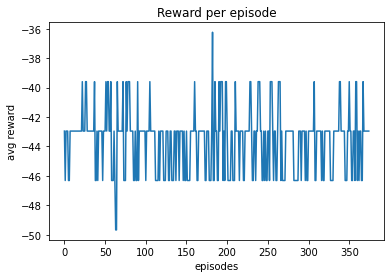

The episode is  376
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step60000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 22.557124862263993


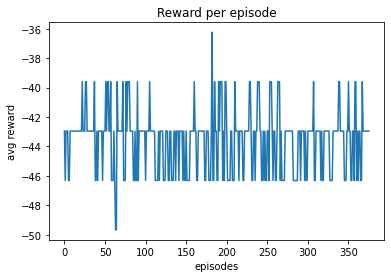

The episode is  377
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.218430426063147


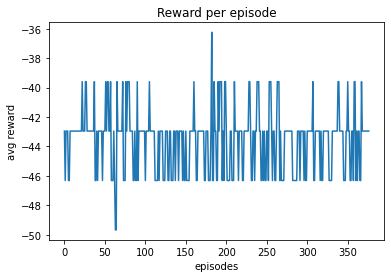

The episode is  378
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.046609277757934


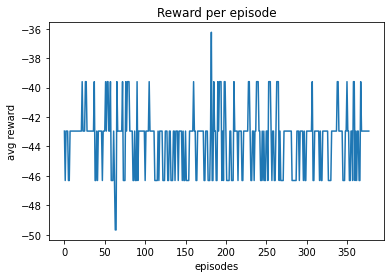

The episode is  379
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 22.814352492340007


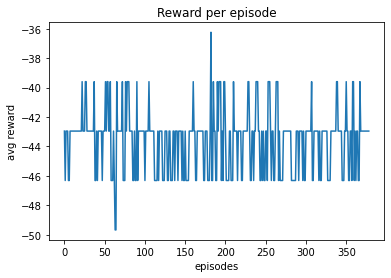

The episode is  380
The eval average rewards per episode is  -42.95302013422881
the value error is 22.814352492340007


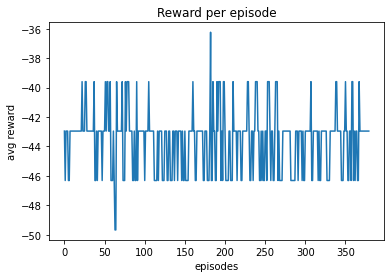

The episode is  381
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 21.741532106213047


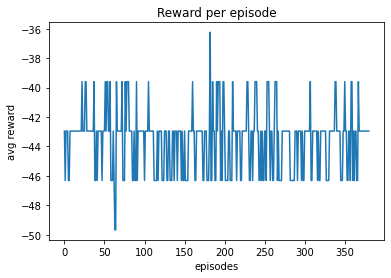

The episode is  382
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step61000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 21.66525626061462


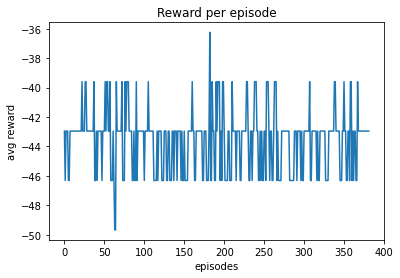

The episode is  383
Track generation: 1357..1700 -> 343-tiles track
Track generation: 1138..1431 -> 293-tiles trackTrack generation: 1210..1517 -> 307-tiles trackTrack generation: 1239..1553 -> 314-tiles track
Track generation: 1128..1422 -> 294-tiles trackTrack generation: 1081..1358 -> 277-tiles track



Track generation: 988..1239 -> 251-tiles trackTrack generation: 1088..1364 -> 276-tiles trackTrack generation: 1216..1524 -> 308-tiles trackTrack generation: 971..1224 -> 253-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1101..1385 -> 284-tiles trackTrack generation: 1132..1419 -> 287-tiles track





Track generation: 1243..1558 -> 315-tiles trackTrack generation: 1175..1473 -> 298-tiles trackTrack generation: 1116..1399 -> 283-tiles track

Track generation: 1192..1494 -> 302-tiles trackTrack generation: 1136..1424 -> 288-tiles track

retry to generate track (normal if there are not many of this messages)


Track generation: 1376

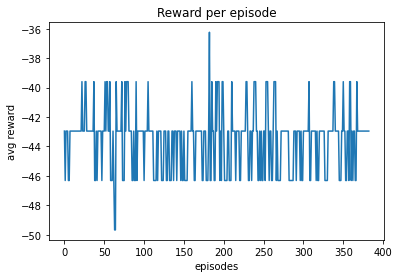

The episode is  384
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422895
the value error is 21.874893760638766


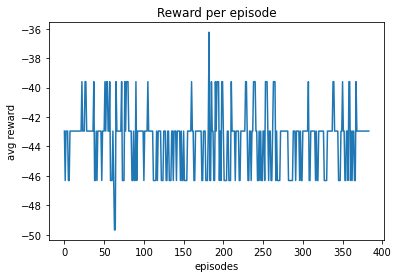

The episode is  385
The eval average rewards per episode is  -42.95302013422895
the value error is 21.874893760638766


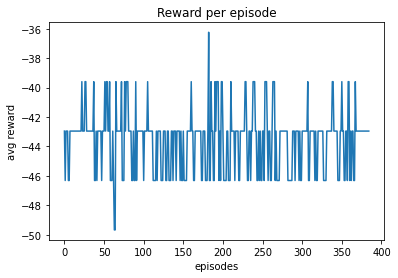

The episode is  386
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.50387516209232


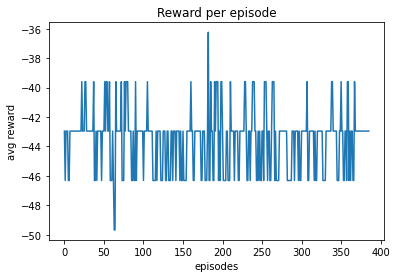

The episode is  387
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 21.59617793016115


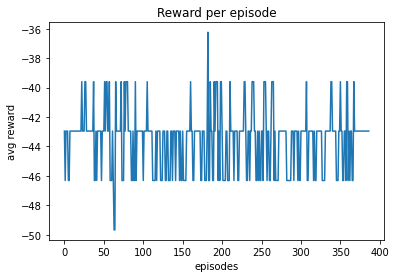

The episode is  388
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step62000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.935308900922198


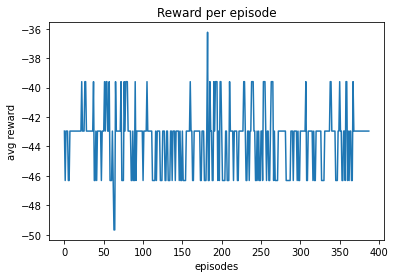

The episode is  389
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422893
the value error is 21.78611386239312


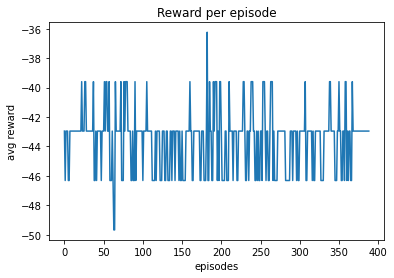

The episode is  390
The eval average rewards per episode is  -42.95302013422893
the value error is 21.78611386239312


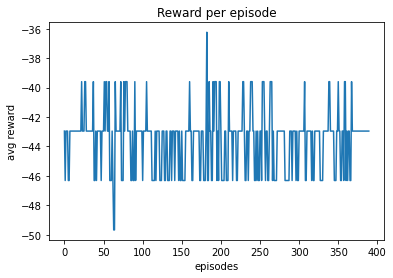

The episode is  391
Track generation: 1332..1669 -> 337-tiles trackTrack generation: 1094..1372 -> 278-tiles trackTrack generation: 1120..1405 -> 285-tiles trackTrack generation: 1160..1454 -> 294-tiles trackTrack generation: 1100..1379 -> 279-tiles track
Track generation: 1204..1509 -> 305-tiles track

Track generation: 992..1244 -> 252-tiles trackTrack generation: 1103..1383 -> 280-tiles trackTrack generation: 1073..1349 -> 276-tiles trackTrack generation: 1211..1518 -> 307-tiles trackTrack generation: 955..1198 -> 243-tiles track
Track generation: 1143..1433 -> 290-tiles trackTrack generation: 1011..1268 -> 257-tiles trackTrack generation: 1116..1399 -> 283-tiles track






Track generation: 1173..1470 -> 297-tiles track
Track generation: 1105..1392 -> 287-tiles track

retry to generate track (normal if there are not many of this messages)


Track generation: 1153..1446 -> 293-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

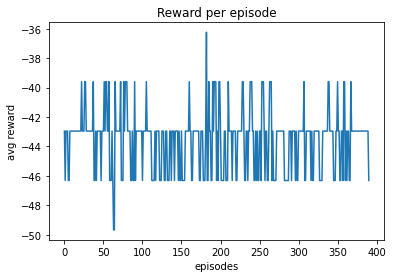

The episode is  392
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 24.053779629979164


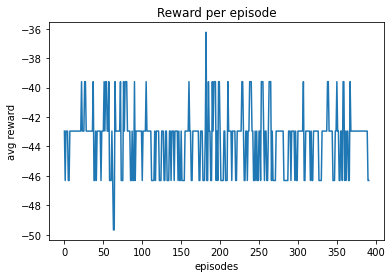

The episode is  393
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.607887183833302


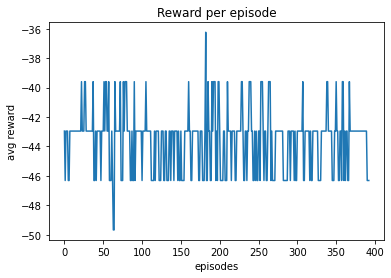

The episode is  394
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step63000.ckpt
The eval average rewards per episode is  -42.95302013422889
the value error is 21.187018504057598


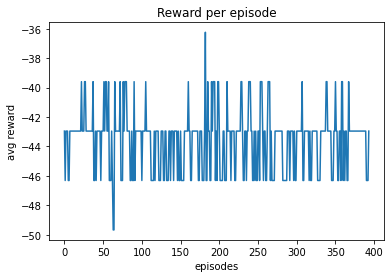

The episode is  395
The eval average rewards per episode is  -42.95302013422889
the value error is 21.187018504057598


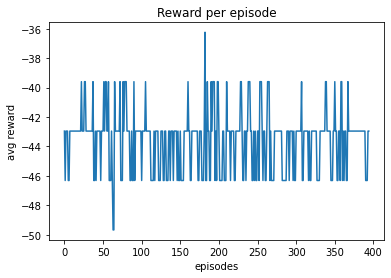

The episode is  396
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.12600877551497


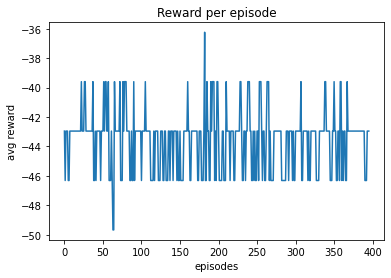

The episode is  397
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221545
the value error is 23.707093601686022


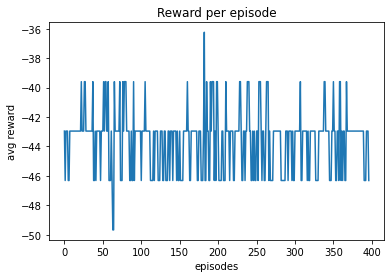

The episode is  398
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221543
the value error is 24.377244035607365


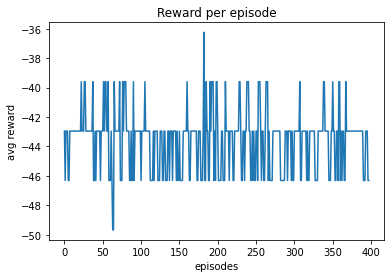

The episode is  399
Track generation: 1300..1628 -> 328-tiles trackTrack generation: 929..1171 -> 242-tiles trackTrack generation: 1170..1467 -> 297-tiles track
Track generation: 979..1236 -> 257-tiles trackTrack generation: 1304..1633 -> 329-tiles trackTrack generation: 1111..1393 -> 282-tiles track


Track generation: 1203..1516 -> 313-tiles track
Track generation: 1220..1529 -> 309-tiles trackTrack generation: 1108..1394 -> 286-tiles trackTrack generation: 1236..1549 -> 313-tiles trackTrack generation: 1159..1453 -> 294-tiles track
Track generation: 1135..1424 -> 289-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1063..1340 -> 277-tiles track


Track generation: 1068..1339 -> 271-tiles track
Track generation: 1223..1533 -> 310-tiles track




Track generation: 1091..1368 -> 277-tiles trackTrack generation: 1132..1419 -> 287-tiles track


[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

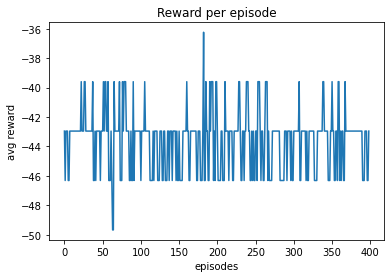

The episode is  400
The eval average rewards per episode is  -42.953020134228915
the value error is 21.318769926157948


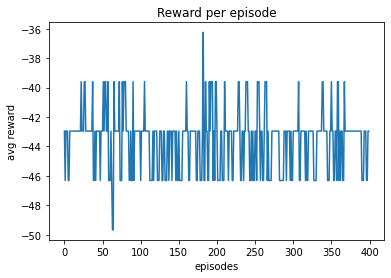

The episode is  401
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step64000.ckpt
The eval average rewards per episode is  -46.30872483221545
the value error is 23.83963728714718


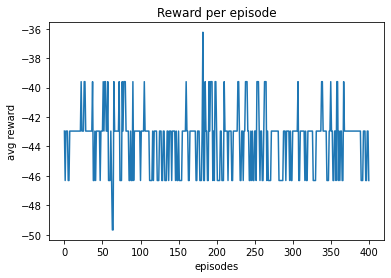

The episode is  402
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 22.13436313177223


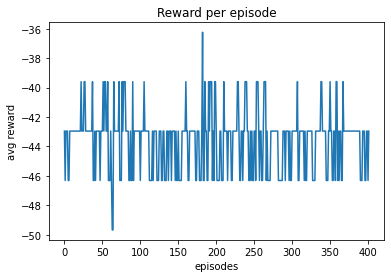

The episode is  403
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 24.870077614635182


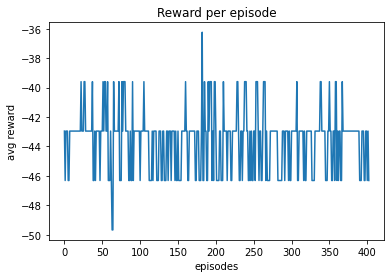

The episode is  404
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.627637987643467


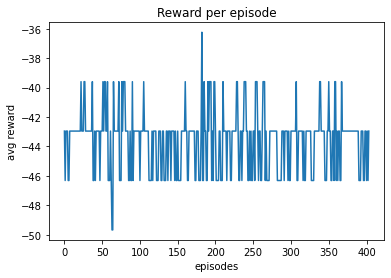

The episode is  405
The eval average rewards per episode is  -42.953020134228886
the value error is 21.627637987643467


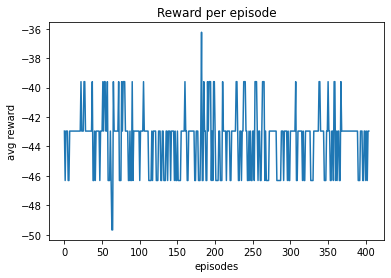

The episode is  406
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228915
the value error is 21.610071897781506


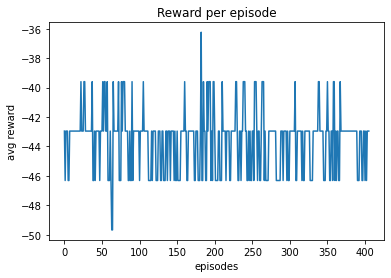

The episode is  407
Track generation: 1079..1360 -> 281-tiles trackTrack generation: 1071..1348 -> 277-tiles trackTrack generation: 1101..1380 -> 279-tiles trackTrack generation: 1213..1535 -> 322-tiles trackTrack generation: 1154..1447 -> 293-tiles trackTrack generation: 1202..1506 -> 304-tiles trackTrack generation: 1024..1276 -> 252-tiles track




Track generation: 1164..1459 -> 295-tiles track

Track generation: 1172..1469 -> 297-tiles trackTrack generation: 1282..1609 -> 327-tiles track
retry to generate track (normal if there are not many of this messages)Track generation: 1132..1419 -> 287-tiles track


Track generation: 1180..1479 -> 299-tiles trackTrack generation: 1156..1449 -> 293-tiles track

Track generation: 1199..1503 -> 304-tiles trackTrack generation: 1176..1474 -> 298-tiles trackTrack generation: 1163..1458 -> 295-tiles trackTrack generation: 1256..1574 -> 318-tiles track




[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model ch

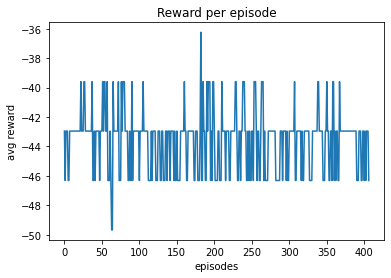

The episode is  408
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215425
the value error is 24.682289071937095


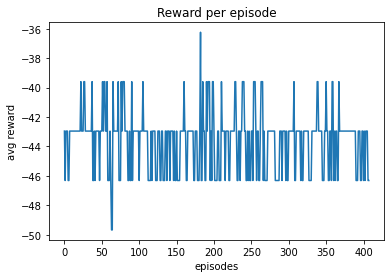

The episode is  409
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.690233118408866


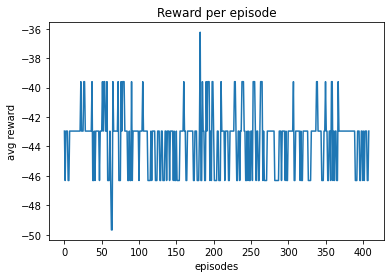

The episode is  410
The eval average rewards per episode is  -42.953020134228865
the value error is 21.690233118408866


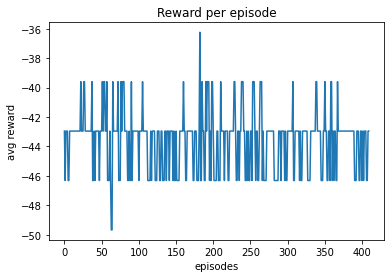

The episode is  411
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.672608238979755


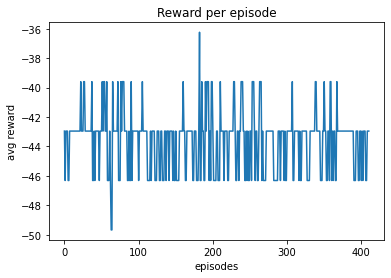

The episode is  412
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -49.6644295302021
the value error is 28.216042688184068


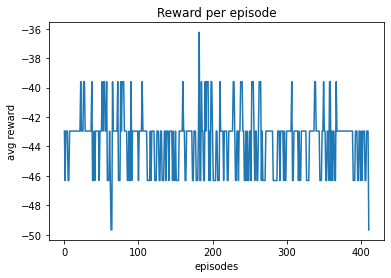

The episode is  413
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step66000.ckpt
The eval average rewards per episode is  -39.59731543624229
the value error is 19.818852456237366


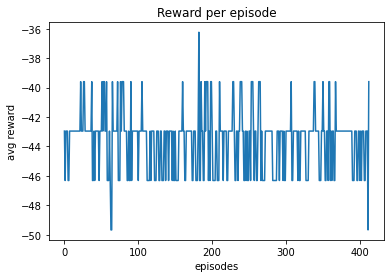

The episode is  414
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624223
the value error is 18.560712927228465


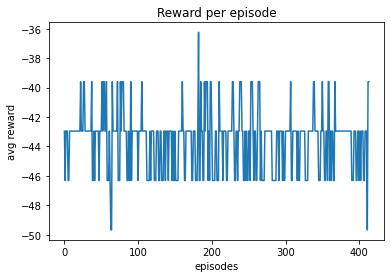

The episode is  415
Track generation: 1036..1299 -> 263-tiles trackTrack generation: 1056..1331 -> 275-tiles track
Track generation: 1205..1511 -> 306-tiles track
Track generation: 1084..1359 -> 275-tiles trackTrack generation: 1215..1523 -> 308-tiles trackTrack generation: 1279..1603 -> 324-tiles trackTrack generation: 1156..1449 -> 293-tiles trackTrack generation: 1013..1275 -> 262-tiles trackTrack generation: 1120..1404 -> 284-tiles track



Track generation: 1208..1514 -> 306-tiles track

Track generation: 1195..1498 -> 303-tiles trackTrack generation: 1250..1567 -> 317-tiles track


Track generation: 1068..1348 -> 280-tiles trackTrack generation: 1085..1360 -> 275-tiles trackTrack generation: 1083..1358 -> 275-tiles track


Track generation: 1232..1550 -> 318-tiles track

The eval average rewards per episode is  -39.59731543624223
the value error is 18.560712927228465


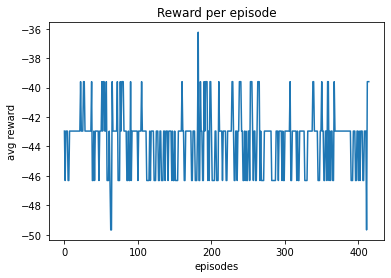

The episode is  416
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 24.701845254847356


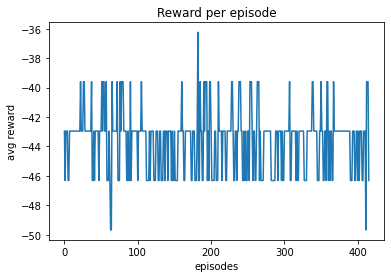

The episode is  417
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422876
the value error is 21.65880520318611


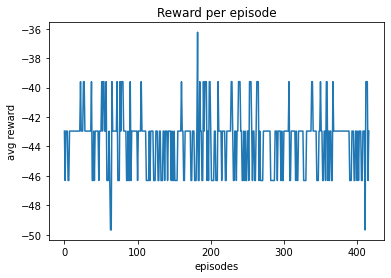

The episode is  418
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.680423582551605


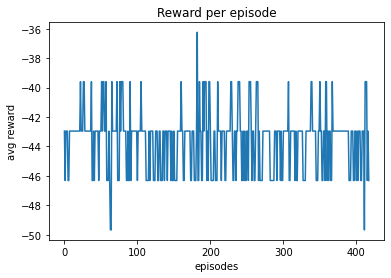

The episode is  419
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step67000.ckpt
The eval average rewards per episode is  -42.953020134228886
the value error is 22.69952049344748


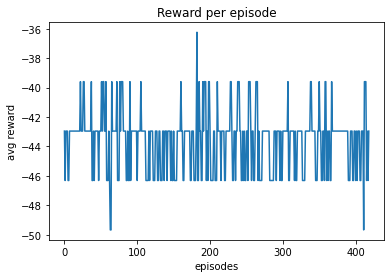

The episode is  420
The eval average rewards per episode is  -42.953020134228886
the value error is 22.69952049344748


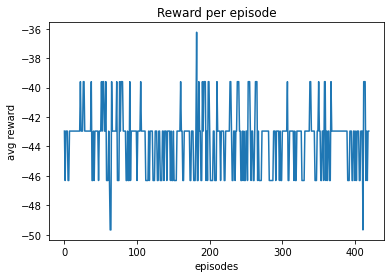

The episode is  421
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.186336153846504


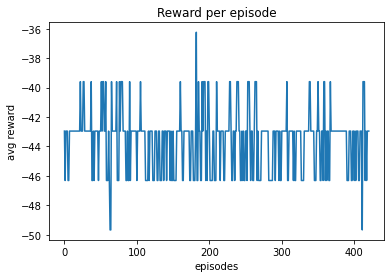

The episode is  422
Track generation: 1267..1588 -> 321-tiles track
Track generation: 1256..1575 -> 319-tiles track
Track generation: 1017..1275 -> 258-tiles trackTrack generation: 1079..1353 -> 274-tiles trackTrack generation: 1132..1419 -> 287-tiles trackTrack generation: 954..1197 -> 243-tiles trackTrack generation: 1077..1359 -> 282-tiles track
Track generation: 1147..1438 -> 291-tiles track


Track generation: 1000..1256 -> 256-tiles trackTrack generation: 1375..1723 -> 348-tiles trackTrack generation: 1168..1473 -> 305-tiles trackTrack generation: 1267..1588 -> 321-tiles track





retry to generate track (normal if there are not many of this messages)Track generation: 1199..1503 -> 304-tiles trackTrack generation: 1215..1522 -> 307-tiles trackTrack generation: 1152..1444 -> 292-tiles track

Track generation: 1052..1319 -> 267-tiles track


Track generation: 1414..1770 -> 356-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average

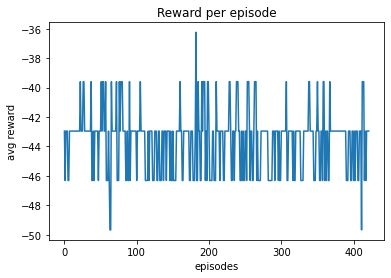

The episode is  423
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 22.1563938255012


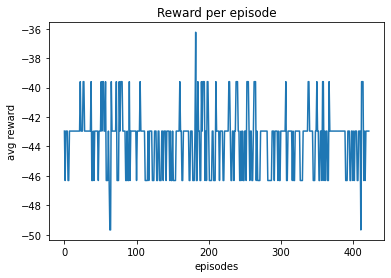

The episode is  424
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.224076378929887


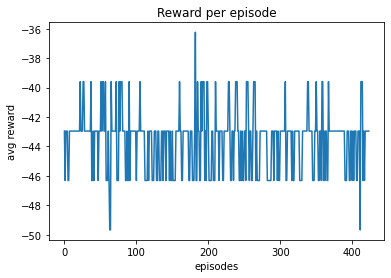

The episode is  425
The eval average rewards per episode is  -42.95302013422883
the value error is 22.224076378929887


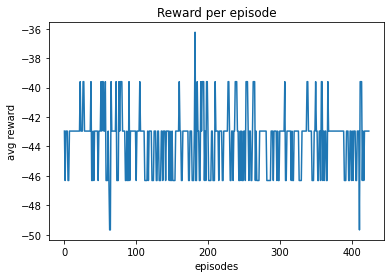

The episode is  426
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step68000.ckpt
The eval average rewards per episode is  -42.95302013422887
the value error is 22.888211828436862


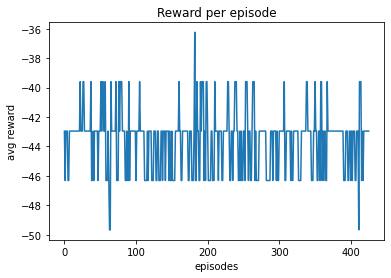

The episode is  427
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 21.81557999973497


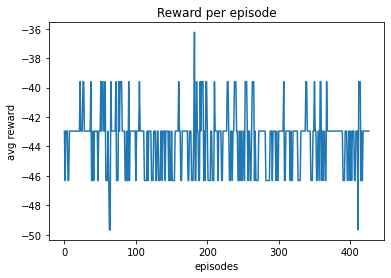

The episode is  428
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.366966009998027


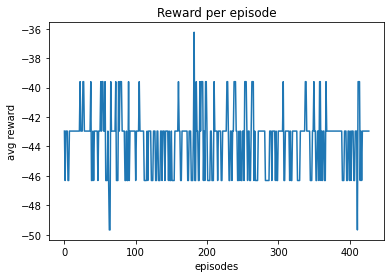

The episode is  429
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228794
the value error is 21.708122585383087


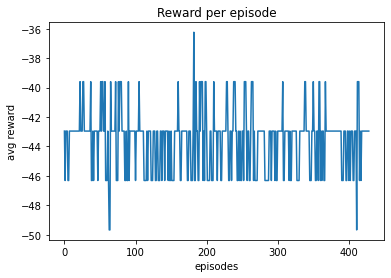

The episode is  430
Track generation: 1320..1654 -> 334-tiles trackTrack generation: 1207..1513 -> 306-tiles trackTrack generation: 978..1234 -> 256-tiles trackTrack generation: 1059..1328 -> 269-tiles trackTrack generation: 1179..1477 -> 298-tiles trackTrack generation: 1172..1469 -> 297-tiles trackTrack generation: 1191..1493 -> 302-tiles trackTrack generation: 1204..1509 -> 305-tiles trackTrack generation: 1148..1448 -> 300-tiles trackTrack generation: 1034..1303 -> 269-tiles track

Track generation: 1047..1316 -> 269-tiles track
Track generation: 1144..1434 -> 290-tiles track
Track generation: 1101..1380 -> 279-tiles trackTrack generation: 1092..1369 -> 277-tiles track



Track generation: 1238..1552 -> 314-tiles track



retry to generate track (normal if there are not many of this messages)Track generation: 1177..1475 -> 298-tiles track




Track generation: 1198..1501 -> 303-tiles track
The eval average rewards per episode is  -42.953020134228794
the value error is 21.7081225853

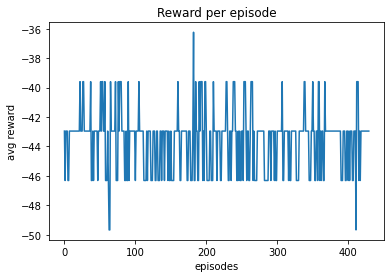

The episode is  431
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624223
the value error is 19.267748636850442


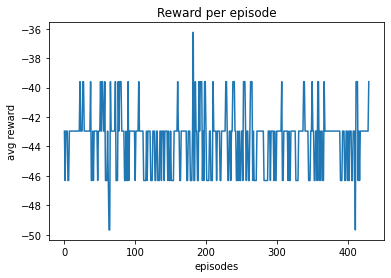

The episode is  432
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step69000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 21.37361821949475


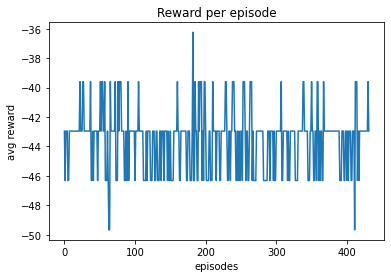

The episode is  433
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242276
the value error is 20.078057392943105


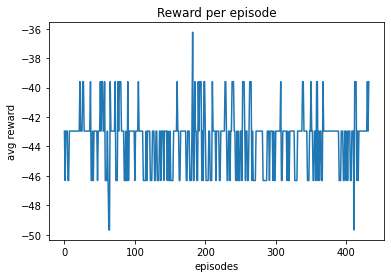

The episode is  434
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -49.66442953020208
the value error is 26.970515235335014


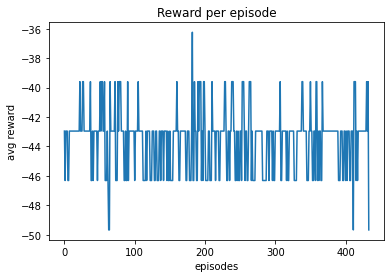

The episode is  435
The eval average rewards per episode is  -49.66442953020208
the value error is 26.970515235335014


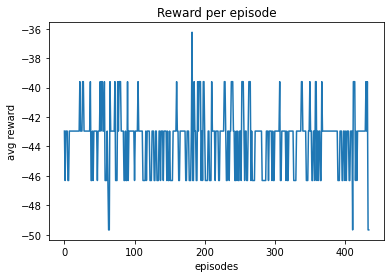

The episode is  436
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.72219676447819


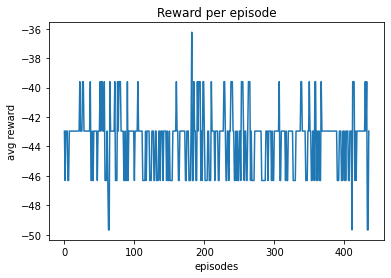

The episode is  437
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 21.786669207406543


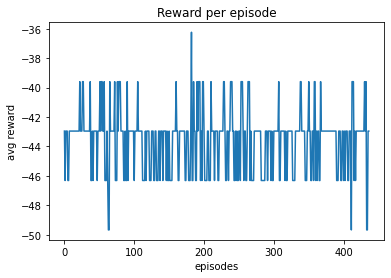

The episode is  438
Track generation: 1203..1508 -> 305-tiles track
Track generation: 1153..1452 -> 299-tiles trackTrack generation: 1149..1440 -> 291-tiles trackTrack generation: 1148..1439 -> 291-tiles trackTrack generation: 1120..1403 -> 283-tiles track
Track generation: 1070..1345 -> 275-tiles track



Track generation: 1183..1483 -> 300-tiles trackTrack generation: 1136..1424 -> 288-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 1124..1418 -> 294-tiles track

Track generation: 1211..1518 -> 307-tiles track

Track generation: 1138..1475 -> 337-tiles trackTrack generation: 1164..1466 -> 302-tiles trackTrack generation: 1101..1380 -> 279-tiles track
Track generation: 1256..1574 -> 318-tiles track

Track generation: 1159..1460 -> 301-tiles track

Track generation: 1066..1342 -> 276-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 1174..1471 -> 297-tiles track

Track generation: 11

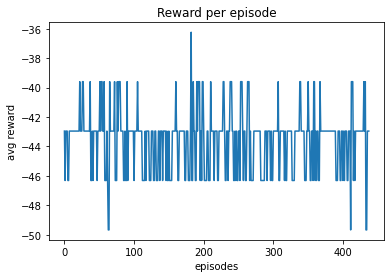

The episode is  439
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.779835287118793


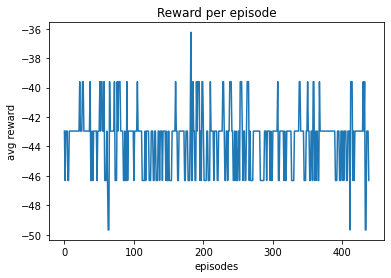

The episode is  440
The eval average rewards per episode is  -46.30872483221544
the value error is 24.779835287118793


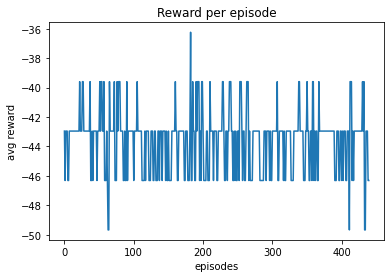

The episode is  441
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 21.88146196193563


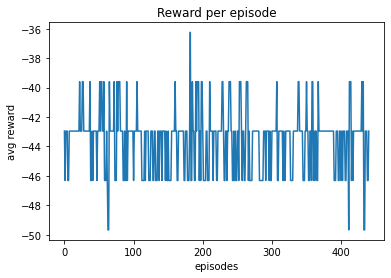

The episode is  442
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.492820920761172


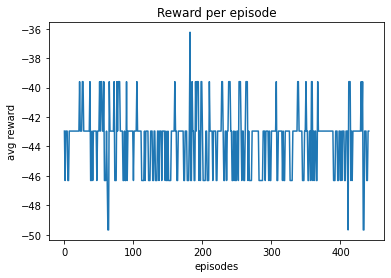

The episode is  443
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 22.43633041885794


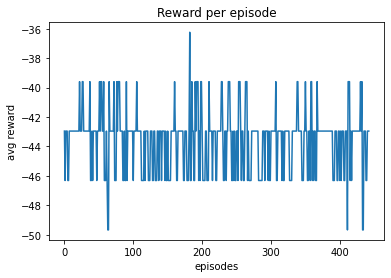

The episode is  444
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step71000.ckpt
The eval average rewards per episode is  -39.59731543624217
the value error is 18.886589543325034


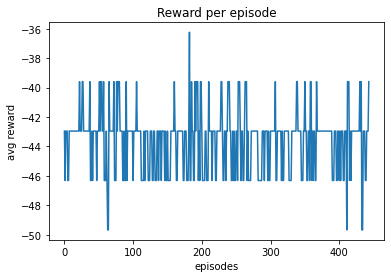

The episode is  445
The eval average rewards per episode is  -39.59731543624217
the value error is 18.886589543325034


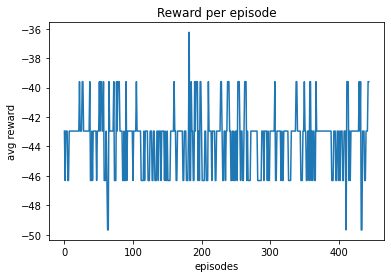

The episode is  446
Track generation: 922..1156 -> 234-tiles trackTrack generation: 1028..1295 -> 267-tiles trackTrack generation: 1055..1323 -> 268-tiles track


Track generation: 1249..1560 -> 311-tiles trackTrack generation: 1128..1422 -> 294-tiles track
Track generation: 958..1207 -> 249-tiles trackTrack generation: 1126..1412 -> 286-tiles trackTrack generation: 1187..1488 -> 301-tiles trackTrack generation: 1204..1509 -> 305-tiles trackTrack generation: 1091..1368 -> 277-tiles trackTrack generation: 1040..1302 -> 262-tiles trackTrack generation: 1144..1434 -> 290-tiles trackTrack generation: 1333..1670 -> 337-tiles track








Track generation: 1148..1439 -> 291-tiles trackTrack generation: 1068..1339 -> 271-tiles trackTrack generation: 1114..1394 -> 280-tiles track


retry to generate track (normal if there are not many of this messages)
Track generation: 1291..1618 -> 327-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

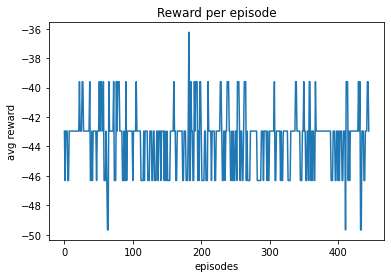

The episode is  447
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.55543111765138


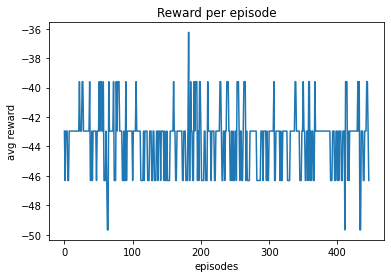

The episode is  448
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.603274894368482


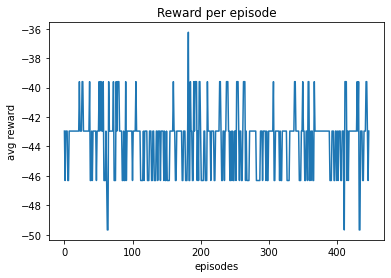

The episode is  449
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221548
the value error is 24.890887988815155


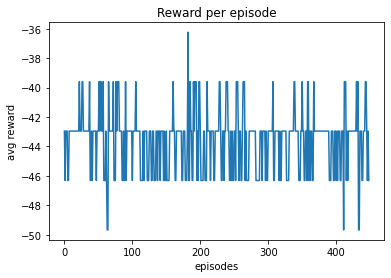

The episode is  450
The eval average rewards per episode is  -46.30872483221548
the value error is 24.890887988815155


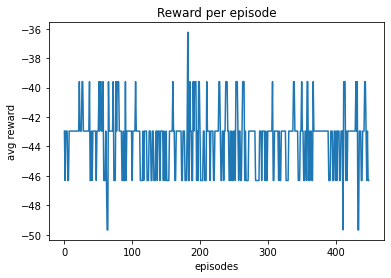

The episode is  451
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step72000.ckpt
The eval average rewards per episode is  -42.95302013422886
the value error is 22.565818017540575


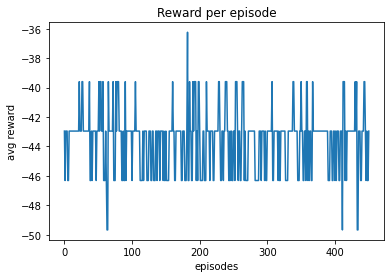

The episode is  452
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.81314153002111


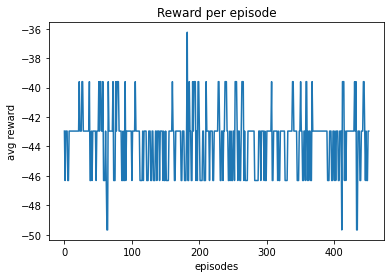

The episode is  453
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.472893356646875


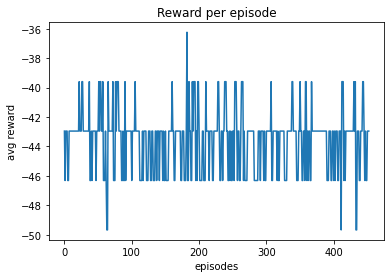

The episode is  454
Track generation: 1079..1353 -> 274-tiles trackTrack generation: 1083..1358 -> 275-tiles track
Track generation: 1128..1414 -> 286-tiles track

Track generation: 1019..1278 -> 259-tiles trackTrack generation: 1107..1388 -> 281-tiles trackTrack generation: 1178..1484 -> 306-tiles track
Track generation: 1244..1559 -> 315-tiles trackTrack generation: 1116..1399 -> 283-tiles trackTrack generation: 1068..1339 -> 271-tiles trackTrack generation: 1368..1715 -> 347-tiles trackTrack generation: 1063..1333 -> 270-tiles trackTrack generation: 1116..1400 -> 284-tiles track
Track generation: 1080..1354 -> 274-tiles trackTrack generation: 1240..1554 -> 314-tiles track

Track generation: 1124..1409 -> 285-tiles track


Track generation: 1420..1779 -> 359-tiles track





[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228794
the value error is 21.66867918038946


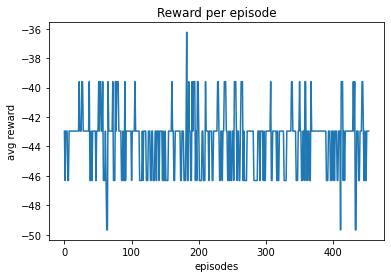

The episode is  455
The eval average rewards per episode is  -42.953020134228794
the value error is 21.66867918038946


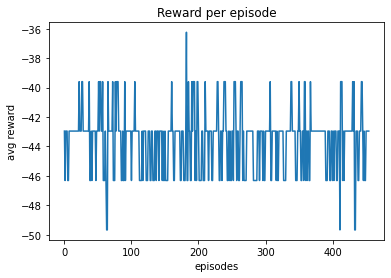

The episode is  456
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 21.812709695773755


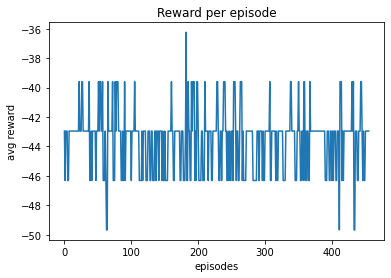

The episode is  457
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step73000.ckpt
The eval average rewards per episode is  -42.953020134228915
the value error is 21.832270382248822


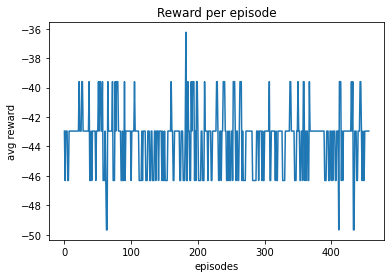

The episode is  458
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228865
the value error is 22.2464661645592


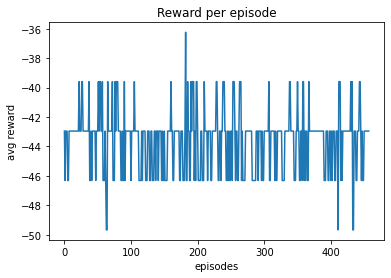

The episode is  459
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215496
the value error is 24.1338268200164


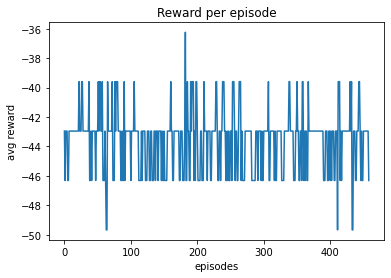

The episode is  460
The eval average rewards per episode is  -46.308724832215496
the value error is 24.1338268200164


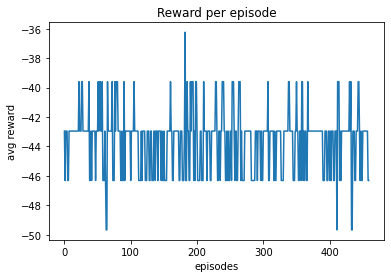

The episode is  461
Track generation: 1147..1438 -> 291-tiles trackTrack generation: 1119..1407 -> 288-tiles track
Track generation: 1012..1277 -> 265-tiles track

Track generation: 1003..1258 -> 255-tiles trackTrack generation: 1079..1353 -> 274-tiles track

Track generation: 1322..1657 -> 335-tiles trackTrack generation: 1147..1438 -> 291-tiles trackTrack generation: 1075..1356 -> 281-tiles track


Track generation: 1154..1446 -> 292-tiles trackTrack generation: 1026..1289 -> 263-tiles trackTrack generation: 1276..1599 -> 323-tiles track


Track generation: 1212..1519 -> 307-tiles trackTrack generation: 1231..1551 -> 320-tiles trackretry to generate track (normal if there are not many of this messages)

Track generation: 1316..1649 -> 333-tiles track
Track generation: 1109..1391 -> 282-tiles trackTrack generation: 1346..1686 -> 340-tiles track

Track generation: 1201..1506 -> 305-tiles track

[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval averag

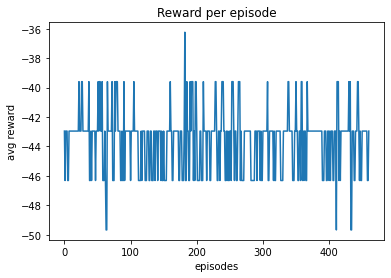

The episode is  462
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 22.113908669753037


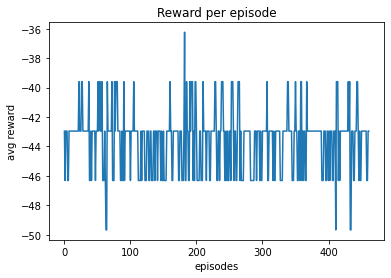

The episode is  463
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step74000.ckpt
The eval average rewards per episode is  -42.95302013422882
the value error is 21.238276156704067


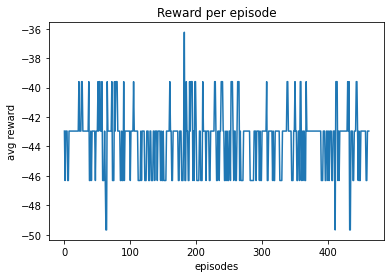

The episode is  464
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624223
the value error is 20.017073793820902


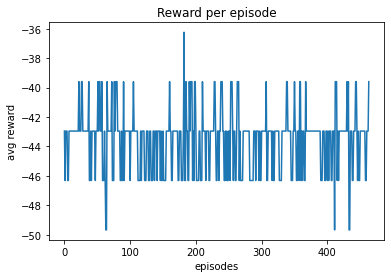

The episode is  465
The eval average rewards per episode is  -39.59731543624223
the value error is 20.017073793820902


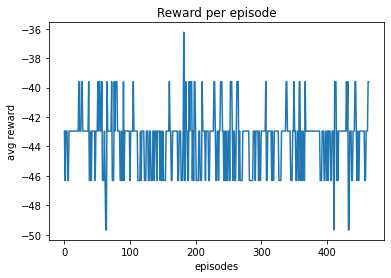

The episode is  466
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422892
the value error is 22.23537063245646


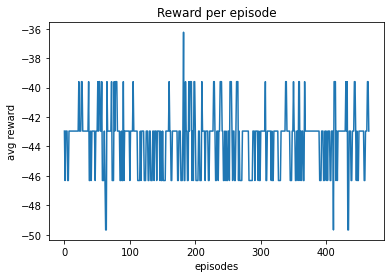

The episode is  467
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422885
the value error is 21.486075491530677


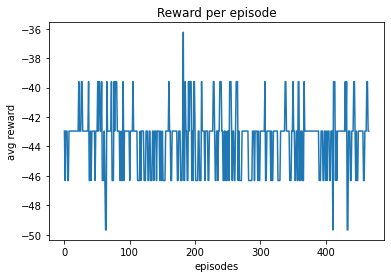

The episode is  468
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215404
the value error is 24.81991460850479


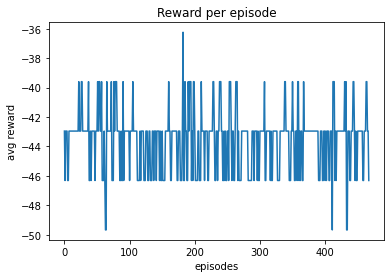

The episode is  469
Track generation: 1096..1374 -> 278-tiles track
Track generation: 1074..1347 -> 273-tiles trackTrack generation: 1196..1499 -> 303-tiles track

Track generation: 1126..1411 -> 285-tiles track
Track generation: 1152..1444 -> 292-tiles trackTrack generation: 1092..1369 -> 277-tiles track
Track generation: 1221..1530 -> 309-tiles track

Track generation: 1181..1480 -> 299-tiles trackTrack generation: 1172..1469 -> 297-tiles track
Track generation: 1344..1684 -> 340-tiles trackTrack generation: 1134..1429 -> 295-tiles track
Track generation: 1172..1469 -> 297-tiles track
Track generation: 1090..1371 -> 281-tiles trackTrack generation: 1208..1542 -> 334-tiles track


Track generation: 1257..1575 -> 318-tiles trackTrack generation: 1179..1478 -> 299-tiles track
retry to generate track (normal if there are not many of this messages)


Track generation: 1230..1542 -> 312-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model ch

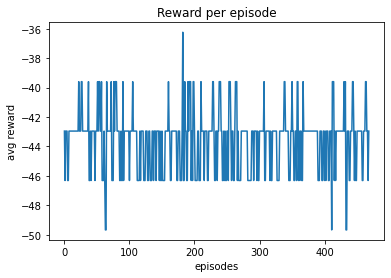

The episode is  470
The eval average rewards per episode is  -42.9530201342289
the value error is 21.91034974566547


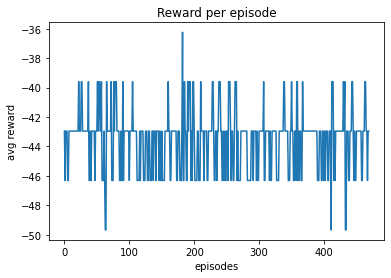

The episode is  471
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221549
the value error is 24.197779745499847


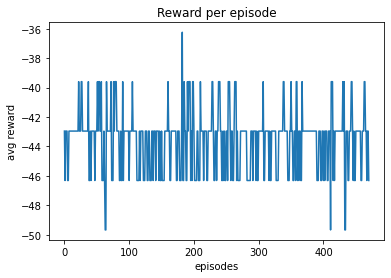

The episode is  472
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242226
the value error is 19.225980225998324


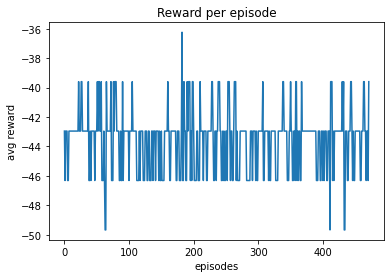

The episode is  473
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422884
the value error is 22.25196952729278


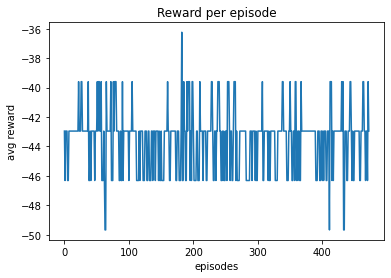

The episode is  474
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221546
the value error is 24.14664842620469


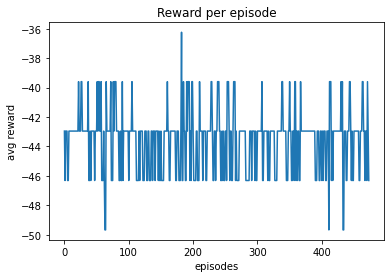

The episode is  475
The eval average rewards per episode is  -46.30872483221546
the value error is 24.14664842620469


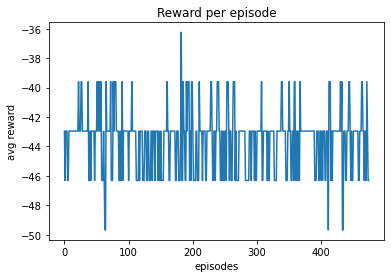

The episode is  476
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step76000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 22.23264051959926


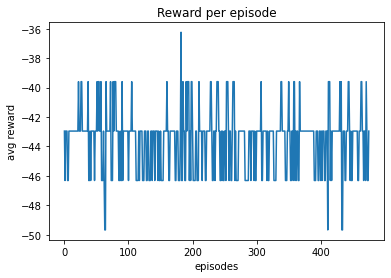

The episode is  477
Track generation: 1112..1394 -> 282-tiles trackTrack generation: 1124..1409 -> 285-tiles track
Track generation: 1088..1364 -> 276-tiles trackTrack generation: 1217..1532 -> 315-tiles track
Track generation: 1096..1380 -> 284-tiles trackTrack generation: 1213..1520 -> 307-tiles track

Track generation: 1112..1401 -> 289-tiles trackTrack generation: 1323..1658 -> 335-tiles track


Track generation: 1177..1475 -> 298-tiles track
Track generation: 1047..1313 -> 266-tiles trackTrack generation: 1156..1449 -> 293-tiles trackTrack generation: 1193..1497 -> 304-tiles trackTrack generation: 958..1211 -> 253-tiles track

Track generation: 1117..1399 -> 282-tiles track

Track generation: 1130..1416 -> 286-tiles track
retry to generate track (normal if there are not many of this messages)
Track generation: 1108..1389 -> 281-tiles track


Track generation: 968..1221 -> 253-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average 

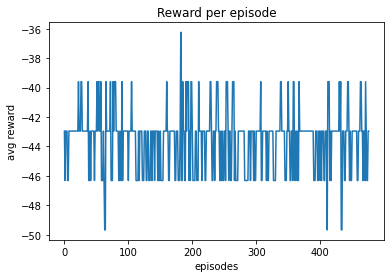

The episode is  478
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221541
the value error is 24.36185776628769


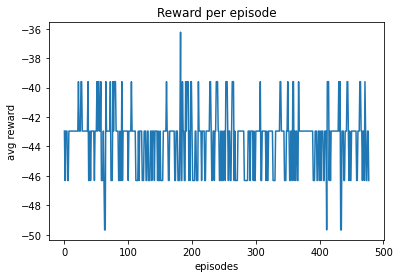

The episode is  479
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 22.428914308258687


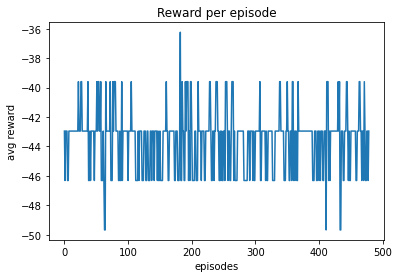

The episode is  480
The eval average rewards per episode is  -42.95302013422887
the value error is 22.428914308258687


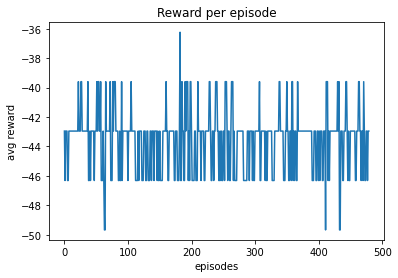

The episode is  481
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422881
the value error is 21.33733186063593


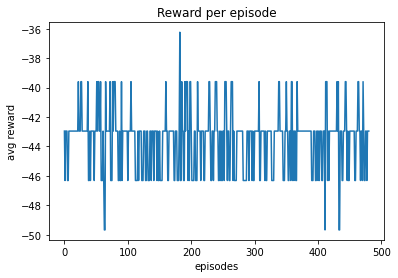

The episode is  482
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step77000.ckpt
The eval average rewards per episode is  -42.953020134228844
the value error is 22.226686073303494


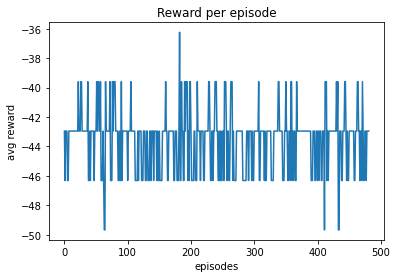

The episode is  483
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422887
the value error is 22.325780966520508


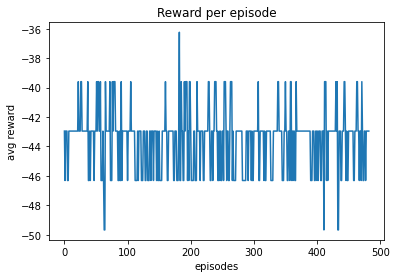

The episode is  484
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 22.08148581664411


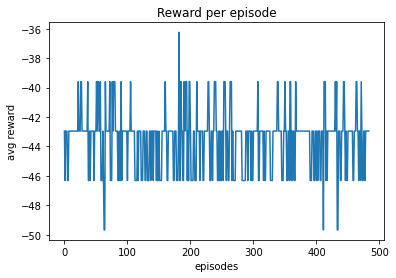

The episode is  485
Track generation: 1210..1525 -> 315-tiles track
Track generation: 1208..1514 -> 306-tiles trackTrack generation: 1053..1329 -> 276-tiles trackTrack generation: 1061..1331 -> 270-tiles trackTrack generation: 1156..1449 -> 293-tiles track

Track generation: 1083..1358 -> 275-tiles track


Track generation: 1092..1369 -> 277-tiles trackTrack generation: 1071..1343 -> 272-tiles trackretry to generate track (normal if there are not many of this messages)Track generation: 989..1242 -> 253-tiles trackTrack generation: 1156..1449 -> 293-tiles track

Track generation: 1092..1369 -> 277-tiles trackTrack generation: 1127..1413 -> 286-tiles trackTrack generation: 1075..1348 -> 273-tiles trackTrack generation: 1075..1347 -> 272-tiles trackTrack generation: 1228..1539 -> 311-tiles track
Track generation: 1320..1654 -> 334-tiles track

retry to generate track (normal if there are not many of this messages)

Track generation: 1163..1458 -> 295-tiles track





Track generation: 116

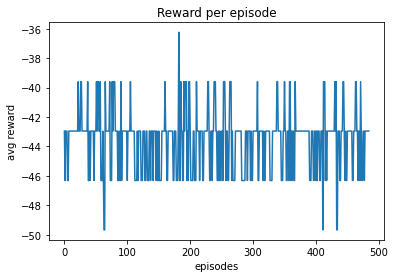

The episode is  486
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221547
the value error is 24.11666231908604


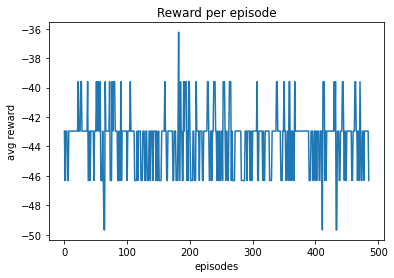

The episode is  487
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 22.304455807965798


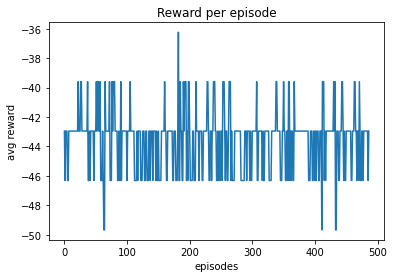

The episode is  488
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step78000.ckpt
The eval average rewards per episode is  -42.95302013422885
the value error is 22.538376105199813


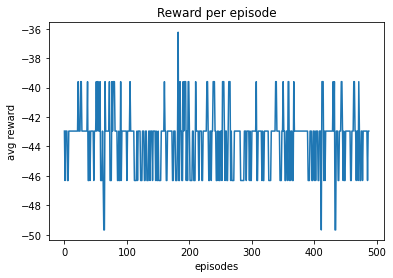

The episode is  489
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228886
the value error is 21.908256492592397


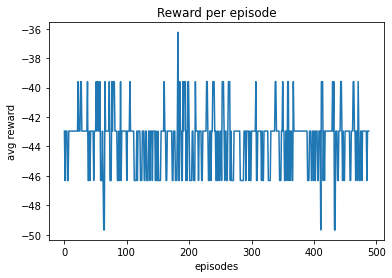

The episode is  490
The eval average rewards per episode is  -42.953020134228886
the value error is 21.908256492592397


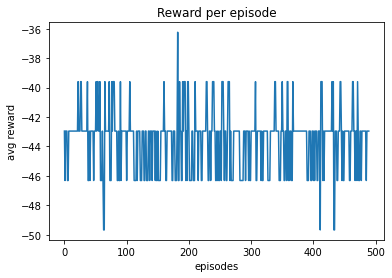

The episode is  491
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624226
the value error is 19.17674608498562


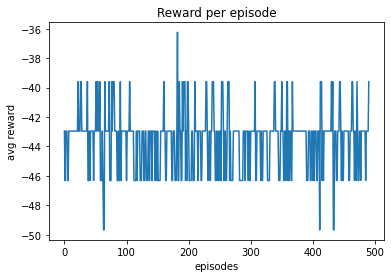

The episode is  492
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221544
the value error is 24.952951810267432


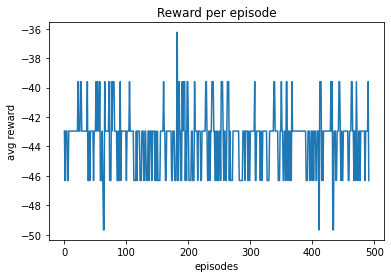

The episode is  493
Track generation: 1057..1325 -> 268-tiles track
Track generation: 1166..1469 -> 303-tiles trackTrack generation: 1165..1460 -> 295-tiles track
Track generation: 1160..1454 -> 294-tiles trackTrack generation: 1018..1276 -> 258-tiles track
Track generation: 1152..1450 -> 298-tiles track
Track generation: 1041..1305 -> 264-tiles track

Track generation: 1075..1348 -> 273-tiles trackTrack generation: 1283..1608 -> 325-tiles trackTrack generation: 1143..1433 -> 290-tiles trackTrack generation: 1142..1441 -> 299-tiles track
Track generation: 1079..1353 -> 274-tiles trackTrack generation: 999..1253 -> 254-tiles trackTrack generation: 1088..1364 -> 276-tiles track

Track generation: 1179..1478 -> 299-tiles track
Track generation: 931..1173 -> 242-tiles track





[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228794
the value error is 22.309383819525817


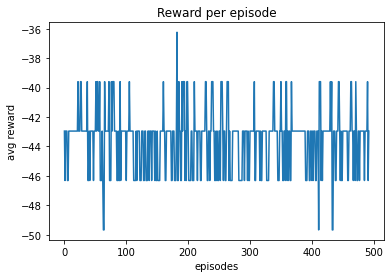

The episode is  494
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step79000.ckpt
The eval average rewards per episode is  -42.95302013422884
the value error is 21.24642470000788


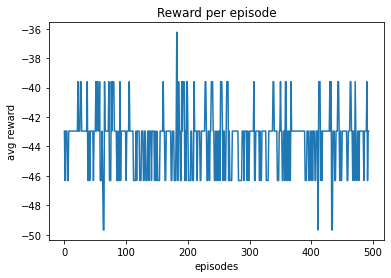

The episode is  495
The eval average rewards per episode is  -42.95302013422884
the value error is 21.24642470000788


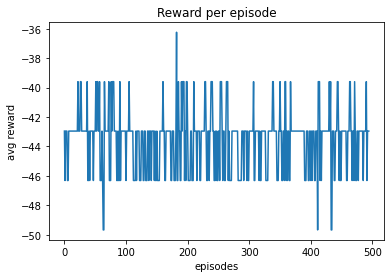

The episode is  496
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422893
the value error is 21.813576276248337


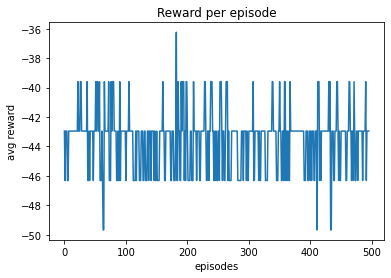

The episode is  497
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.9530201342289
the value error is 21.10516894904042


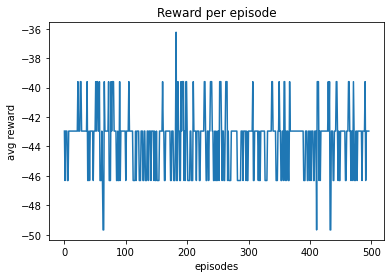

The episode is  498
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242134
the value error is 18.863922559253478


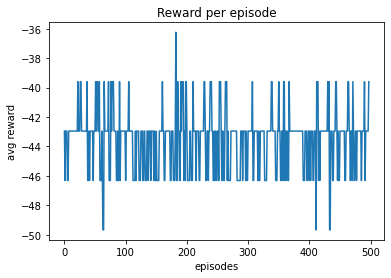

The episode is  499
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 25.388894965064523


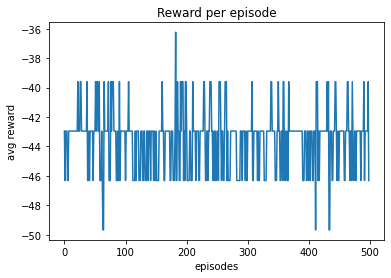

The episode is  500
Track generation: 1101..1385 -> 284-tiles track
Track generation: 1131..1418 -> 287-tiles trackTrack generation: 1147..1447 -> 300-tiles trackTrack generation: 1055..1323 -> 268-tiles track
Track generation: 1259..1578 -> 319-tiles track
Track generation: 1137..1425 -> 288-tiles track
Track generation: 1176..1474 -> 298-tiles track
Track generation: 1168..1464 -> 296-tiles track

Track generation: 1221..1530 -> 309-tiles track
Track generation: 1228..1539 -> 311-tiles track

Track generation: 1215..1523 -> 308-tiles track
Track generation: 1041..1305 -> 264-tiles trackTrack generation: 999..1261 -> 262-tiles trackTrack generation: 1032..1301 -> 269-tiles trackTrack generation: 1059..1331 -> 272-tiles track
Track generation: 998..1258 -> 260-tiles track



retry to generate track (normal if there are not many of this messages)
Track generation: 1206..1511 -> 305-tiles track
The eval average rewards per episode is  -46.308724832215475
the value error is 25.38889496506

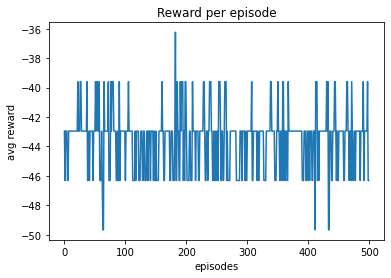

The episode is  501
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step80000.ckpt
The eval average rewards per episode is  -46.30872483221549
the value error is 25.253279375716456


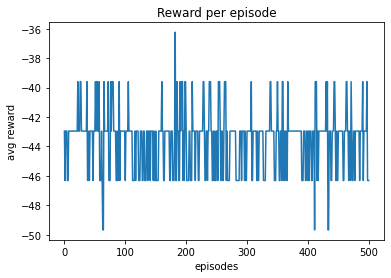

The episode is  502
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.33866897781879


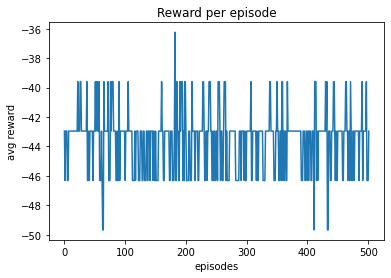

The episode is  503
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.597315436242155
the value error is 18.478471273944656


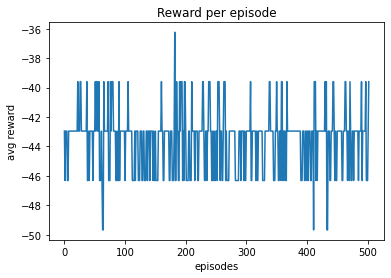

The episode is  504
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.30872483221553
the value error is 25.08326818322206


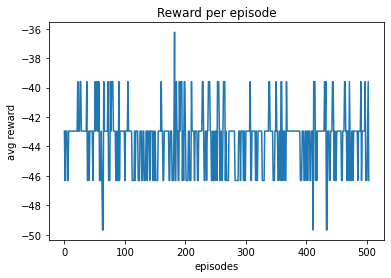

The episode is  505
The eval average rewards per episode is  -46.30872483221553
the value error is 25.08326818322206


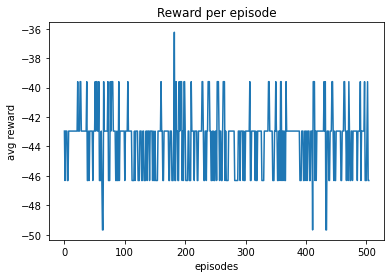

The episode is  506
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422882
the value error is 21.74261871752978


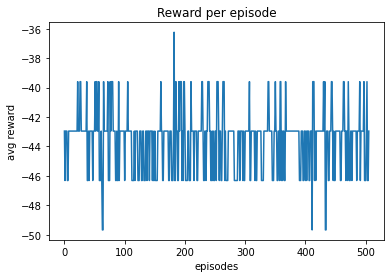

The episode is  507
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step81000.ckpt
The eval average rewards per episode is  -42.953020134228886
the value error is 21.71409583402385


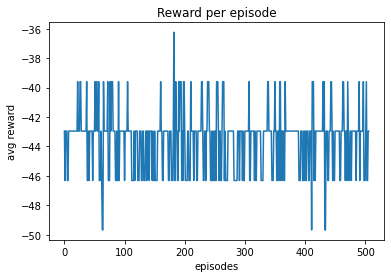

The episode is  508
Track generation: 1219..1528 -> 309-tiles track
Track generation: 1127..1413 -> 286-tiles trackTrack generation: 1051..1318 -> 267-tiles trackTrack generation: 1132..1419 -> 287-tiles track

Track generation: 1230..1542 -> 312-tiles trackTrack generation: 961..1210 -> 249-tiles trackTrack generation: 1124..1409 -> 285-tiles trackTrack generation: 1146..1445 -> 299-tiles trackTrack generation: 1183..1483 -> 300-tiles trackTrack generation: 1012..1269 -> 257-tiles trackTrack generation: 1291..1618 -> 327-tiles track




Track generation: 1149..1440 -> 291-tiles trackTrack generation: 1073..1350 -> 277-tiles track




Track generation: 1319..1653 -> 334-tiles trackTrack generation: 1348..1689 -> 341-tiles track

Track generation: 1133..1420 -> 287-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228815
the value error is 21.990560119250176


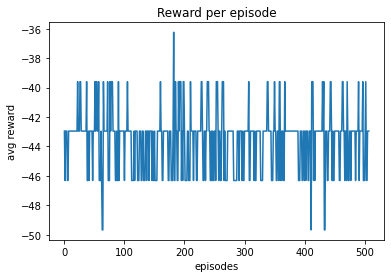

The episode is  509
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624224
the value error is 19.603509887449245


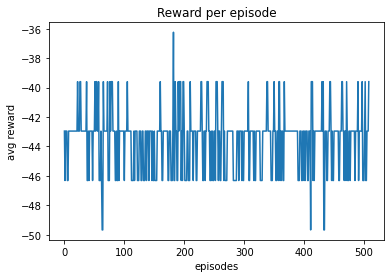

The episode is  510
The eval average rewards per episode is  -39.59731543624224
the value error is 19.603509887449245


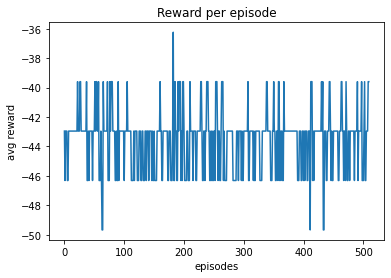

The episode is  511
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422883
the value error is 21.141194582351098


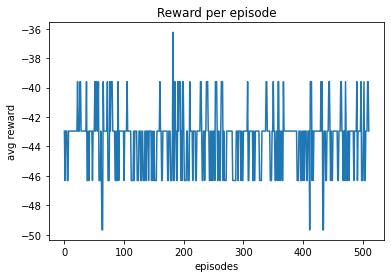

The episode is  512
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -49.66442953020212
the value error is 27.290307677078328


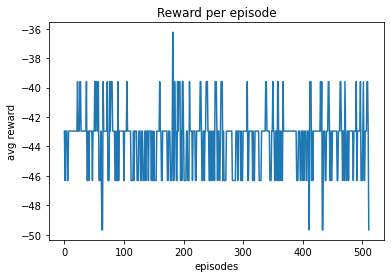

The episode is  513
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step82000.ckpt
The eval average rewards per episode is  -39.59731543624219
the value error is 20.082314041549218


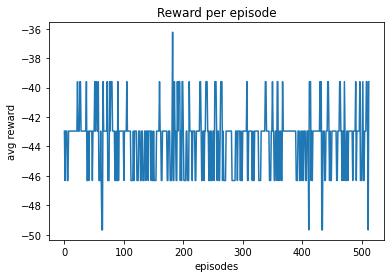

The episode is  514
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -46.308724832215525
the value error is 24.18826500353534


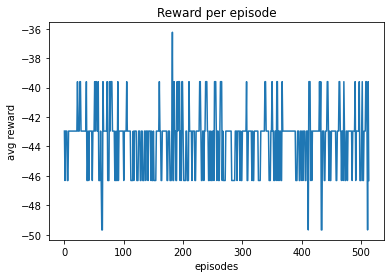

The episode is  515
The eval average rewards per episode is  -46.308724832215525
the value error is 24.18826500353534


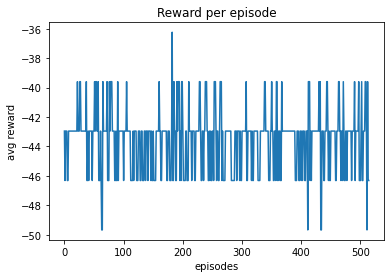

The episode is  516
Track generation: 1355..1707 -> 352-tiles track
Track generation: 1114..1406 -> 292-tiles trackTrack generation: 1081..1356 -> 275-tiles track
Track generation: 1031..1293 -> 262-tiles trackTrack generation: 1129..1416 -> 287-tiles track
Track generation: 1120..1404 -> 284-tiles trackTrack generation: 1061..1336 -> 275-tiles trackTrack generation: 1108..1389 -> 281-tiles trackTrack generation: 924..1166 -> 242-tiles track
Track generation: 1120..1404 -> 284-tiles track

Track generation: 1108..1389 -> 281-tiles trackretry to generate track (normal if there are not many of this messages)


Track generation: 1279..1603 -> 324-tiles trackTrack generation: 1031..1299 -> 268-tiles trackTrack generation: 1116..1399 -> 283-tiles track
Track generation: 1300..1629 -> 329-tiles track
Track generation: 1088..1372 -> 284-tiles track





Track generation: 1220..1529 -> 309-tiles track
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average

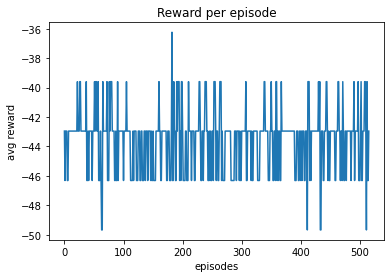

The episode is  517
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422891
the value error is 21.401347755176502


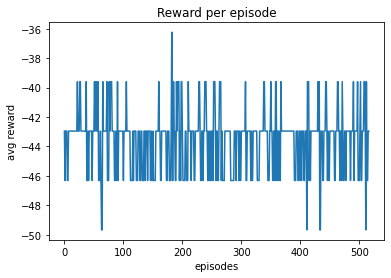

The episode is  518
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.95302013422886
the value error is 22.091743822678037


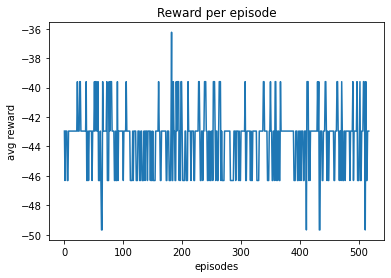

The episode is  519
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
[INFO] Model checkpoint saved to ./models/racecar_final/step83000.ckpt
The eval average rewards per episode is  -42.953020134228865
the value error is 20.99979089376491


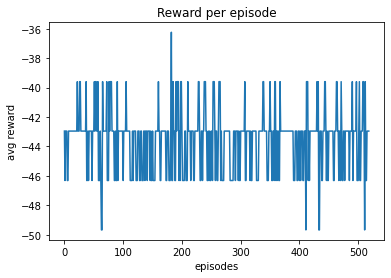

The episode is  520
The eval average rewards per episode is  -42.953020134228865
the value error is 20.99979089376491


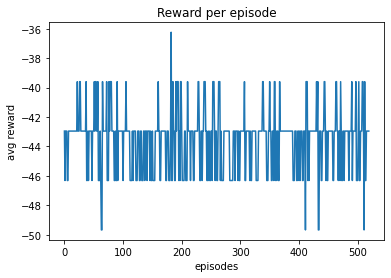

The episode is  521
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624221
the value error is 19.032977747687493


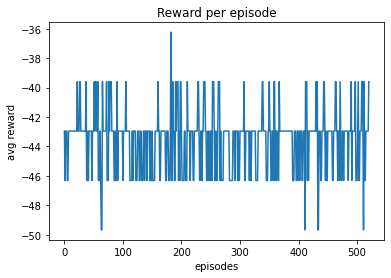

The episode is  522
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -42.953020134228844
the value error is 21.386948784898802


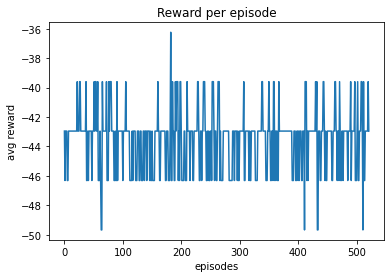

The episode is  523
[INFO] Running evaluation...
Track generation: 1143..1442 -> 299-tiles track
The eval average rewards per episode is  -39.59731543624222
the value error is 19.860015760479826


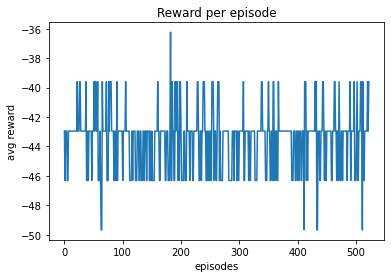

The episode is  524
Track generation: 1168..1471 -> 303-tiles track


In [ ]:
from vec_env.subproc_vec_env import SubprocVecEnv
import matplotlib.pyplot as plt

env_name = "CarRacing-v0"
reward_arr = []


def preprocess_frame(image):
    image = image[:-12, 6:-6]
    image = np.dot(image[..., 0:3], [0.299, 0.587, 0.114])
    image = image / 255.0
    image = image * 2 - 1
    return image


def make_env():
    return gym.make(env_name)


def evaluate(model, test_env, disFactor, frame_stack_size,
             make_video=False):
    totalReward = 0
    test_env.seed(0)
    initImage = test_env.reset()
    frame_stack = FrameStack(
        initImage, stacLen=frame_stack_size,
        preFunc=preprocess_frame)
    rederedImg = test_env.render(mode="rgb_array")
    values, rewards, dones = [], [], []
    if make_video:
        video_writer = cv2.VideoWriter(os.path.join(model.video_dir, "step{}.avi".format(model.steps)),
                                       cv2.VideoWriter_fourcc(*"MPEG"), 30,
                                       (rederedImg.shape[1], rederedImg.shape[0]))
    while True:
        state = frame_stack.getState()
        action, value = model.getPredection(np.expand_dims(state, axis=0), greedy=False) #too evaluate give True
        frame, reward, done, _ = test_env.step(action[0])
        rederedImg = test_env.render(mode="rgb_array")
        totalReward += reward
        dones.append(done)
        values.append(value)
        rewards.append(reward)
        frame_stack.addFrame(frame)
        if make_video:
            video_writer.write(cv2.cvtColor(rederedImg, cv2.COLOR_RGB2BGR))
        if done:
            break
    if make_video:
        video_writer.release()
    retPlacehold = genReturn(np.transpose([rewards], [1, 0]), [0], np.transpose([dones], [1, 0]), disFactor)
    valError = np.mean(np.square(np.array(values) - retPlacehold))
    return totalReward, valError


def train(modelName):
    try:

        print("crating env's")
        test_env = gym.make(env_name)
        learningRate = 0.0003
        disFactor = 0.99
        gaeLambda = 0.95
        ppoEps = 0.2
        valScale = 0.5
        entropyScale = 0.01
        horizon = 128
        noEpochs = 10
        batchSize = 128
        noEnvs = 16
        saveInterval=1000
        evalInterval=200
        record_episodes=True
        restart=True
        def lr_scheduler(steps): return learningRate * \
            0.85 ** (steps // 10000)
        
        inputShape = (84, 84, 4)
        numActions = test_env.action_space.shape[0]
        minAction = test_env.action_space.low
        maxAction = test_env.action_space.high
        print("[INFO] Creating model")
        model = PPO(inputShape, numActions, minAction, maxAction,
                    epsilon=ppoEps,
                    valScale=valScale, entropyScale=entropyScale,
                    modelName=modelName)

        print("[INFO] Creating environments")
        envs = SubprocVecEnv([make_env for _ in range(noEnvs)])

        initial_frames = envs.reset()
        envs.get_images()
        #fStack = [FrameStack(initial_frames[i], stacLen=4, preFunc=preprocess_frame) for i in range(noEnvs)]
        fStack = []                         
        for i in range(noEnvs):
          fStack.append(FrameStack(initial_frames[i], stacLen=4, preFunc=preprocess_frame))

        print("[INFO] Training loop")
        var = 0 
        while True:
            if var > 700:
              break
            var += 1 
            print("The episode is ",var)
            currStates, takenAct, values, rewards, dones = [], [], [], [], []
            for _ in range(horizon):
                stateVal = [fStack[i].getState()
                            for i in range(noEnvs)]
                actVal, valVal = model.getPredection(stateVal)

                envs.step_async(actVal)
                frames, rewardVal, doneVal, _ = envs.step_wait()
                envs.get_images()
                currStates.append(stateVal)
                takenAct.append(actVal)             
                values.append(np.squeeze(valVal, axis=-1)) 
                rewards.append(rewardVal)                
                dones.append(doneVal)                     

                for i in range(noEnvs):
                    if doneVal[i]:
                        for _ in range(4):
                            fStack[i].addFrame(frames[i])
                    else:
                        fStack[i].addFrame(frames[i])

            #stateLast = [fStack[i].getState()for i in range(noEnvs)]
            stateLast = []
            for i in range(noEnvs):
              stateLast.append(fStack[i].getState())
            lastVals = np.squeeze(model.getPredection(stateLast)[1], axis=-1)

            advS = genGae(rewards, values, lastVals, dones, disFactor, gaeLambda)
            advS = (advS - advS.mean()) /(advS.std() + 1e-8)
            retPlacehold = advS + values
            currStates = np.array(currStates).reshape((-1, *inputShape))

            takenAct = np.array(takenAct).reshape((-1, numActions))

            retPlacehold = retPlacehold.flatten()
            advS = advS.flatten()

            T = len(rewards)
            N = noEnvs
            assert currStates.shape == (T * N, inputShape[0], inputShape[1], 4)
            assert takenAct.shape == (T * N, numActions)
            assert retPlacehold.shape == (T * N,)
            assert advS.shape == (T * N,)
            model.update_old_policy() 
            
            for _ in range(noEpochs):
                num_samples = len(currStates)
                indices = np.arange(num_samples)
                np.random.shuffle(indices)
                for i in range(int(np.ceil(num_samples / batchSize))):
                    if model.steps % evalInterval == 0:
                        print("[INFO] Running evaluation...")
                        avg_reward, valError = evaluate(model, test_env, disFactor, 4, make_video=True)
                    if model.steps % saveInterval == 0:
                        model.save()
                    begin = i * batchSize
                    end = begin + batchSize
                    if end > num_samples:
                        end = None
                    mb_idx = indices[begin:end]
                    model.steps += 1

            print("The eval average rewards per episode is ",avg_reward)
            print("the value error is",valError)
            reward_arr.append(avg_reward)
            plt.plot(reward_arr)
            plt.xlabel('episodes')
            plt.ylabel('avg reward')
            plt.title('Avg reward per episode')
            plt.show()
    except KeyboardInterrupt:
        model.save()


if __name__ == "__main__":
    train("racecar_final_three")


#Eval

In [ ]:
from vec_env.subproc_vec_env import SubprocVecEnv
import matplotlib.pyplot as plt

env_name = "CarRacing-v0"
reward_arr = []


def preprocess_frame(image):
    image = image[:-12, 6:-6]
    image = np.dot(image[..., 0:3], [0.299, 0.587, 0.114])
    image = image / 255.0
    image = image * 2 - 1
    return image


def make_env():
    return gym.make(env_name)


def evaluate(model, test_env, disFactor, frame_stack_size,
             make_video=False):
    totalReward = 0
    test_env.seed(0)
    initImage = test_env.reset()
    frame_stack = FrameStack(
        initImage, stacLen=frame_stack_size,
        preFunc=preprocess_frame)
    rederedImg = test_env.render(mode="rgb_array")
    values, rewards, dones = [], [], []
    if make_video:
        video_writer = cv2.VideoWriter(os.path.join(model.video_dir, "step{}.avi".format(model.steps)),
                                       cv2.VideoWriter_fourcc(*"MPEG"), 30,
                                       (rederedImg.shape[1], rederedImg.shape[0]))
    while True:
        state = frame_stack.getState()
        action, value = model.getPredection(np.expand_dims(state, axis=0), greedy=True) #too evaluate give True
        frame, reward, done, _ = test_env.step(action[0])
        rederedImg = test_env.render(mode="rgb_array")
        totalReward += reward
        dones.append(done)
        values.append(value)
        rewards.append(reward)
        frame_stack.addFrame(frame)
        if make_video:
            video_writer.write(cv2.cvtColor(rederedImg, cv2.COLOR_RGB2BGR))
        if done:
            break
    if make_video:
        video_writer.release()
    retPlacehold = genReturn(np.transpose([rewards], [1, 0]), [0], np.transpose([dones], [1, 0]), disFactor)
    valError = np.mean(np.square(np.array(values) - retPlacehold))
    return totalReward, valError


def train(modelName):
    try:

        print("crating env's")
        test_env = gym.make(env_name)
        learningRate = 0.0003
        disFactor = 0.99
        gaeLambda = 0.95
        ppoEps = 0.2
        valScale = 0.5
        entropyScale = 0.01
        horizon = 128
        noEpochs = 10
        batchSize = 128
        noEnvs = 16
        saveInterval=1000
        evalInterval=200
        record_episodes=True
        restart=True
        def lr_scheduler(steps): return learningRate * \
            0.85 ** (steps // 10000)
        
        inputShape = (84, 84, 4)
        numActions = test_env.action_space.shape[0]
        minAction = test_env.action_space.low
        maxAction = test_env.action_space.high
        print("[INFO] Creating model")
        model = PPO(inputShape, numActions, minAction, maxAction,
                    epsilon=ppoEps,
                    valScale=valScale, entropyScale=entropyScale,
                    modelName=modelName)

        print("[INFO] Creating environments")
        envs = SubprocVecEnv([make_env for _ in range(noEnvs)])

        initial_frames = envs.reset()
        envs.get_images()
        #fStack = [FrameStack(initial_frames[i], stacLen=4, preFunc=preprocess_frame) for i in range(noEnvs)]
        fStack = []                         
        for i in range(noEnvs):
          fStack.append(FrameStack(initial_frames[i], stacLen=4, preFunc=preprocess_frame))

        print("[INFO] Training loop")
        var = 0 
        while True:
            if var > 700:
              break
            var += 1 
            print("The episode is ",var)
            currStates, takenAct, values, rewards, dones = [], [], [], [], []
            for _ in range(horizon):
                stateVal = [fStack[i].getState()
                            for i in range(noEnvs)]
                actVal, valVal = model.getPredection(stateVal)

                envs.step_async(actVal)
                frames, rewardVal, doneVal, _ = envs.step_wait()
                envs.get_images()
                currStates.append(stateVal)
                takenAct.append(actVal)             
                values.append(np.squeeze(valVal, axis=-1)) 
                rewards.append(rewardVal)                
                dones.append(doneVal)                     

                for i in range(noEnvs):
                    if doneVal[i]:
                        for _ in range(4):
                            fStack[i].addFrame(frames[i])
                    else:
                        fStack[i].addFrame(frames[i])

            #stateLast = [fStack[i].getState()for i in range(noEnvs)]
            stateLast = []
            for i in range(noEnvs):
              stateLast.append(fStack[i].getState())
            lastVals = np.squeeze(model.getPredection(stateLast)[1], axis=-1)

            advS = genGae(rewards, values, lastVals, dones, disFactor, gaeLambda)
            advS = (advS - advS.mean()) /(advS.std() + 1e-8)
            retPlacehold = advS + values
            currStates = np.array(currStates).reshape((-1, *inputShape))

            takenAct = np.array(takenAct).reshape((-1, numActions))

            retPlacehold = retPlacehold.flatten()
            advS = advS.flatten()

            T = len(rewards)
            N = noEnvs
            assert currStates.shape == (T * N, inputShape[0], inputShape[1], 4)
            assert takenAct.shape == (T * N, numActions)
            assert retPlacehold.shape == (T * N,)
            assert advS.shape == (T * N,)
            model.update_old_policy() 
            
            for _ in range(noEpochs):
                num_samples = len(currStates)
                indices = np.arange(num_samples)
                np.random.shuffle(indices)
                for i in range(int(np.ceil(num_samples / batchSize))):
                    if model.steps % evalInterval == 0:
                        print("[INFO] Running evaluation...")
                        avg_reward, valError = evaluate(model, test_env, disFactor, 4, make_video=True)
                    if model.steps % saveInterval == 0:
                        model.save()
                    begin = i * batchSize
                    end = begin + batchSize
                    if end > num_samples:
                        end = None
                    mb_idx = indices[begin:end]
                    model.steps += 1

            print("The eval average rewards per episode is ",avg_reward)
            print("the value error is",valError)
            reward_arr.append(avg_reward)
            plt.plot(reward_arr)
            plt.xlabel('episodes')
            plt.ylabel('avg reward')
            plt.title('Avg reward per episode')
            plt.show()
    except KeyboardInterrupt:
        model.save()


if __name__ == "__main__":
    train("racecar_final_three")
